In [1]:
import serial
import datetime
import time
import schedule
import csv
import datetime
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [70]:
!pip install ref_index

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for ref_index: filename=ref_index-1.0-py3-none-any.whl size=9071 sha256=158caac25ef7b6f38c19f5c270f5d763dd68242d0053b53da0bd870af6bed3b7
  Stored in directory: c:\users\biswa\appdata\local\pip\cache\wheels\ca\74\64\672f978a77c6f164d8dcd9bb37daf976f599227fa3705dd535
Successfully built ref_index


In [2]:
import matplotlib.pyplot as plt
import scienceplots

plt.style.use(['science','notebook','grid'])

In [2]:
def modify_csv(original_filename, modified_filename):
    try:
        with open(original_filename, 'r') as original_file:
            # Skip the first two lines
            lines = original_file.readlines()[2:]

        # Specify the header
        header = ["Date", "Time", "Temperature(C)", "Pressure(hPa)", "Humidity(%rh)"]

        with open(modified_filename, 'w', newline='') as modified_file:
            # Write the header
            writer = csv.writer(modified_file)
            writer.writerow(header)

            # Write the remaining lines
            writer.writerows(csv.reader(lines))

        print(f"CSV file '{modified_filename}' has been created with the modified format.")
    except Exception as e:
        print(f"Error: {e}")




In [12]:
 # Specify the original and modified file names
original_filename = "Environmental_Readings.csv"
modified_filename = "Environmental_Readings_Modified.csv"
modify_csv(original_filename, modified_filename)

CSV file 'Environmental_Readings_Modified.csv' has been created with the modified format.


In [4]:
def Environmental_plot():
    # Read the CSV file into a pandas DataFrame
    df = pd.read_csv('Environmental_Readings_Modified_job2.csv', parse_dates=[['Date', 'Time']], dayfirst=True)

    # Create a single plot with twin y-axes
    fig, ax1 = plt.subplots(figsize=(10, 6))
   

    # Plot Temperature and Humidity on the left y-axis
    color = 'tab:orange'
    ax1.set_xlabel('Date & Time')
    ax1.set_ylabel('Temperature (C) / Humidity (%rh)', color=color)
    ax1.plot(df['Date_Time'], df['Temperature(C)'], label='Temperature', marker='.', linestyle='-', color=color)
    ax1.plot(df['Date_Time'], df['Humidity(%rh)'], label='Humidity',marker='.', linestyle='-', color='tab:blue')
    ax1.tick_params(axis='y', labelcolor=color)
    
    # Set the y-axis limit for the left axis
    ax1.set_ylim([0, 60])
    
    # Create a second y-axis for Pressure on the right
    ax2 = ax1.twinx()
    color = 'tab:grey'
    ax2.set_ylabel('Pressure (hPa)', color=color)
    ax2.plot(df['Date_Time'], df['Pressure(hPa)'], label='Pressure',  marker='.', linestyle='-', color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    
    # Set the y-axis limit for the right axis
    ax2.set_ylim([960, 1015])

    # Show the legends at the bottom
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2, bbox_to_anchor=(0.5,0),loc='lower center')

    # Set grid
    ax1.grid(True)
    
    ax1.tick_params(axis='x', labelrotation=45)

    # Show the plot
    plt.title("BM680 Environmental Monitor Demo")
    plt.tight_layout()
    plt.show()

# # Call the function
# Environmental_plot()

In [3]:
def plot_pos_time():
        %matplotlib notebook
        # Load data from the CSV file
        import pandas as pd
        import matplotlib.pyplot as plt

        # Read the CSV file
        data = pd.read_csv("pos_time_readings_job2.csv")

        # Extract Date, Time, and Position columns
        date_time = data["Date"] + " " + data["Time"]
        position = data["Position (cm)"]

        # Convert date and time to datetime objects
        date_time = pd.to_datetime(date_time, format="%Y-%m-%d %H:%M:%S")

        # Create the scatter plot
        plt.figure(figsize=(10, 6))
        plt.scatter(date_time, position, marker='.', color='blue')  # Use scatter instead of plot
        plt.xlabel("Date and Time")
        plt.ylabel("Position (cm)")
        plt.title("Position vs. Time")
        plt.xticks(rotation=45)
        plt.grid(True)

        plt.tight_layout()
        plt.show()


In [13]:
import scienceplots
import pandas as pd

plt.style.use(['science', 'notebook', 'grid'])
%matplotlib notebook

# Experiment 1

### Environmental Parameters plot

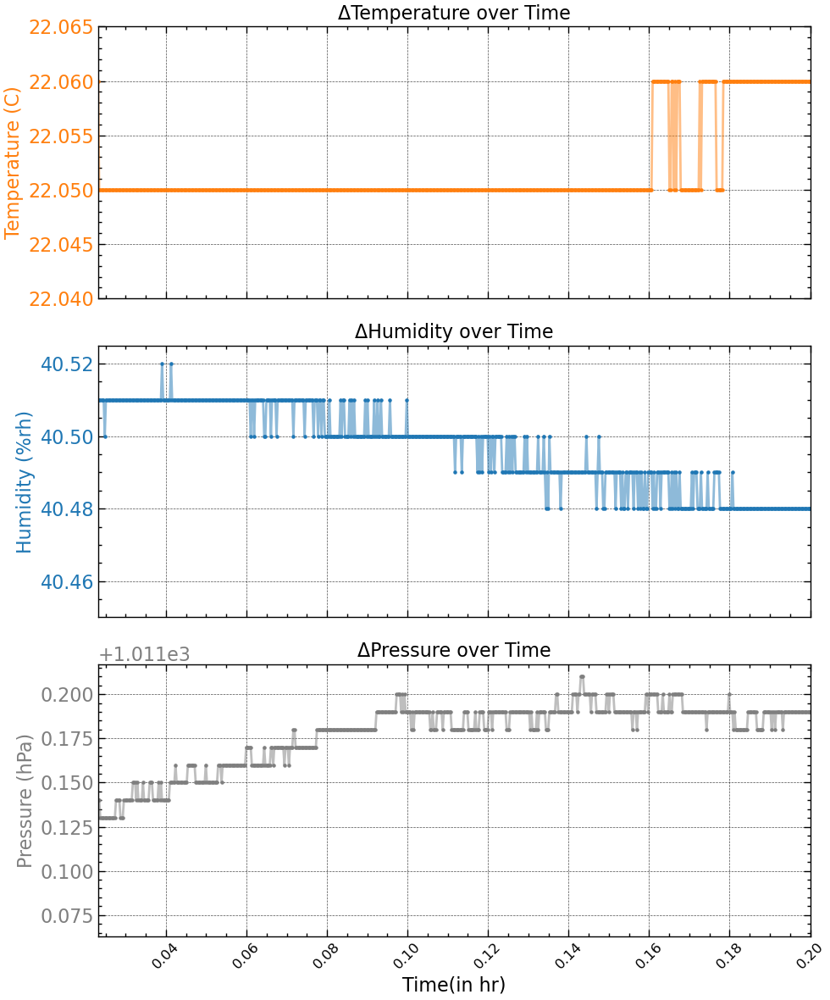

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file into a pandas DataFrame
df = pd.read_csv('Environmental_Readings_Modified.csv', parse_dates=[['Date', 'Time']], dayfirst=True)

# Calculate time difference in hours from the minimum timestamp
df['Hours'] = (df['Date_Time'] - df['Date_Time'].min()).dt.total_seconds() / 3600

# Create subplots with shared x-axis
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)

# Plot Temperature on the first subplot
ax1.set_ylabel('Temperature (C)', color='tab:orange')
ax1.scatter(df['Hours'], df['Temperature(C)'], color='tab:orange', label='Temperature', s=5)
ax1.plot(df['Hours'], df['Temperature(C)'], linestyle='-', color='tab:orange', alpha=0.5)
ax1.tick_params(axis='y', labelcolor='tab:orange')
ax1.set_ylim(22.04, 22.065)
ax1.set_xlim(0.0232,0.2)
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.tick_params(axis='x', labelrotation=45,labelsize=12)
ax1.set_title('ΔTemperature over Time')

# Plot Humidity on the second subplot
ax2.set_ylabel('Humidity (%rh)', color='tab:blue')
ax2.scatter(df['Hours'], df['Humidity(%rh)'], color='tab:blue', label='Humidity', s=5)
ax2.plot(df['Hours'], df['Humidity(%rh)'], linestyle='-', color='tab:blue', alpha=0.5)
ax2.tick_params(axis='y', labelcolor='tab:blue')
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.tick_params(axis='x', labelrotation=45,labelsize=12)
ax2.set_xlim(0.0232,0.2)
ax2.set_ylim(40.45, 40.525)
ax2.set_title('ΔHumidity over Time')

# Plot Pressure on the third subplot
ax3.set_xlabel('Time(in hr)')
ax3.set_ylabel('Pressure (hPa)', color='tab:grey')
ax3.scatter(df['Hours'], df['Pressure(hPa)'], color='tab:grey', label='Pressure', s=5)
ax3.plot(df['Hours'], df['Pressure(hPa)'], linestyle='-', color='tab:grey', alpha=0.5)
ax3.tick_params(axis='y', labelcolor='tab:grey')
ax3.grid(True, linestyle='--', alpha=0.7)
ax3.tick_params(axis='x', labelrotation=45, labelsize=12)
ax3.set_title('ΔPressure over Time')
ax3.set_xlim(0.0232,0.2)


# Adjust layout to prevent clipping of labels
plt.tight_layout()
plt.savefig("experiment1 enviromment reading plot")

# Show the plot
plt.show()


### Position Plot along with smooth data

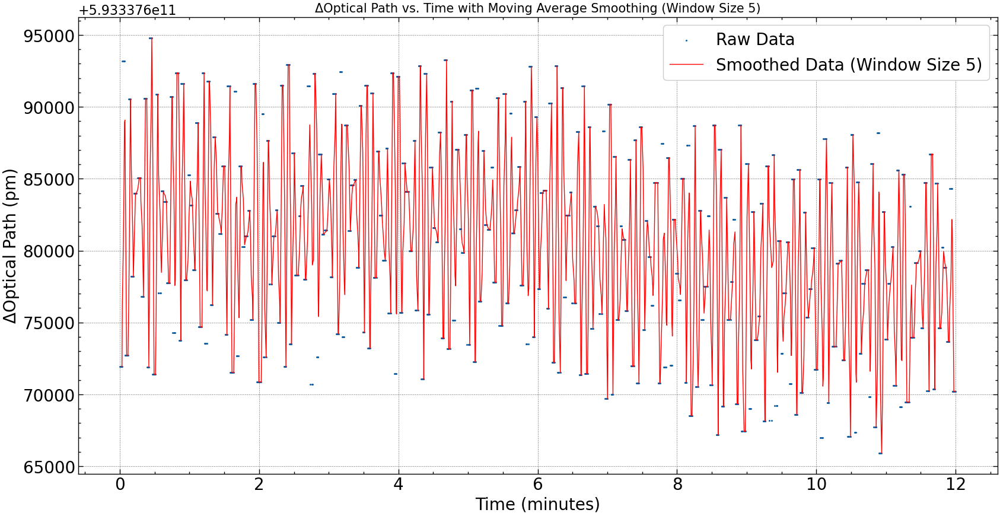

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data from the CSV file
data = pd.read_csv("position_readings.csv")

# Extract Date, Time, and Position columns
date_time = data["Date"] + " " + data["Time"]
position_cm = data["Position (cm)"]

# Convert position to nanometers
position_pm = position_cm * 1e10  # 1 cm = 1e10 pm

# Convert date and time to datetime objects
date_time = pd.to_datetime(date_time, format="%Y-%m-%d %H:%M:%S")

# Apply moving average filter with the specified window size
window_size = 5  # Adjust the window size as needed
position_smoothed = position_pm.rolling(window=window_size).mean()

# Convert time to minutes
time_minutes = (date_time - date_time.min()).dt.total_seconds() 

# Create a scatter plot with the first window size
plt.figure(figsize=(20, 10))
plt.scatter(time_minutes, position_pm, marker='.', s=5, label="Raw Data")  # Original data
plt.plot(time_minutes, position_smoothed, label=f"Smoothed Data (Window Size {window_size})", linestyle='-', linewidth=1, color='red')
plt.xlabel("Time (minutes)", fontsize=20)
plt.ylabel("ΔOptical Path (pm)", fontsize=20)
plt.title(f"ΔOptical Path vs. Time with Moving Average Smoothing (Window Size {window_size})", fontsize=15)
plt.legend(fontsize=20)
plt.tick_params(axis='both', labelsize=20)

# Save the plot as an image
plt.savefig("experiment1_Displacement_plot_reading.png")

# Display the plot in a separate window in Jupyter Notebook
plt.show()


# Experiment 2: Inserting 0.12-0.16 mm slip once

### Environmental Parameters plot

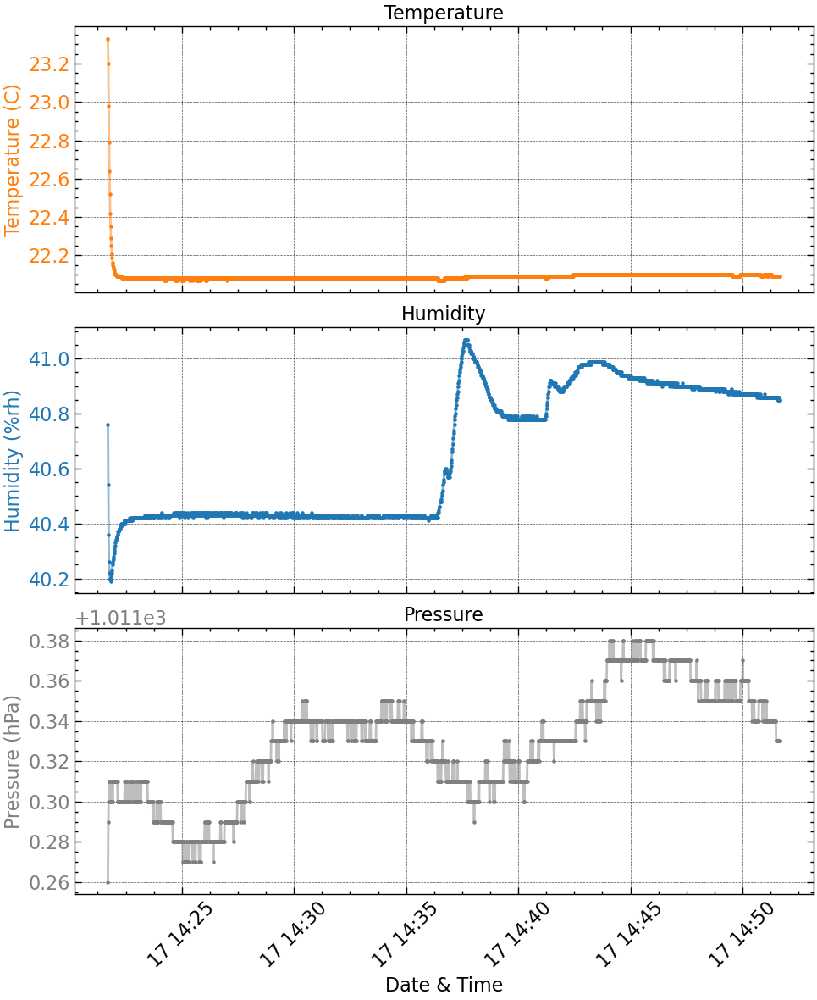

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file into a pandas DataFrame
df = pd.read_csv('Environmental_Readings_Modified_job1i.csv', parse_dates=[['Date', 'Time']], dayfirst=True)

# Create subplots with shared x-axis
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)

# Plot Temperature on the first subplot
ax1.set_ylabel('Temperature (C)', color='tab:orange')
ax1.scatter(df['Date_Time'], df['Temperature(C)'], color='tab:orange', label='Temperature', s=5)
ax1.plot(df['Date_Time'], df['Temperature(C)'], linestyle='-', color='tab:orange', alpha=0.5)
ax1.tick_params(axis='y', labelcolor='tab:orange')
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.tick_params(axis='x', labelrotation=45)
ax1.set_title('Temperature')

# Plot Humidity on the second subplot
ax2.set_ylabel('Humidity (%rh)', color='tab:blue')
ax2.scatter(df['Date_Time'], df['Humidity(%rh)'], color='tab:blue', label='Humidity', s=5)
ax2.plot(df['Date_Time'], df['Humidity(%rh)'], linestyle='-', color='tab:blue', alpha=0.5)
ax2.tick_params(axis='y', labelcolor='tab:blue')
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.tick_params(axis='x', labelrotation=45)
ax2.set_title('Humidity')

# Plot Pressure on the third subplot
ax3.set_xlabel('Date & Time')
ax3.set_ylabel('Pressure (hPa)', color='tab:grey')
ax3.scatter(df['Date_Time'], df['Pressure(hPa)'], color='tab:grey', label='Pressure', s=5)
ax3.plot(df['Date_Time'], df['Pressure(hPa)'], linestyle='-', color='tab:grey', alpha=0.5)
ax3.tick_params(axis='y', labelcolor='tab:grey')
ax3.grid(True, linestyle='--', alpha=0.7)
ax3.tick_params(axis='x', labelrotation=45)
ax3.set_title('Pressure')

# Adjust layout to prevent clipping of labels
plt.tight_layout()

# Show the plot
plt.show()


<IPython.core.display.Javascript object>


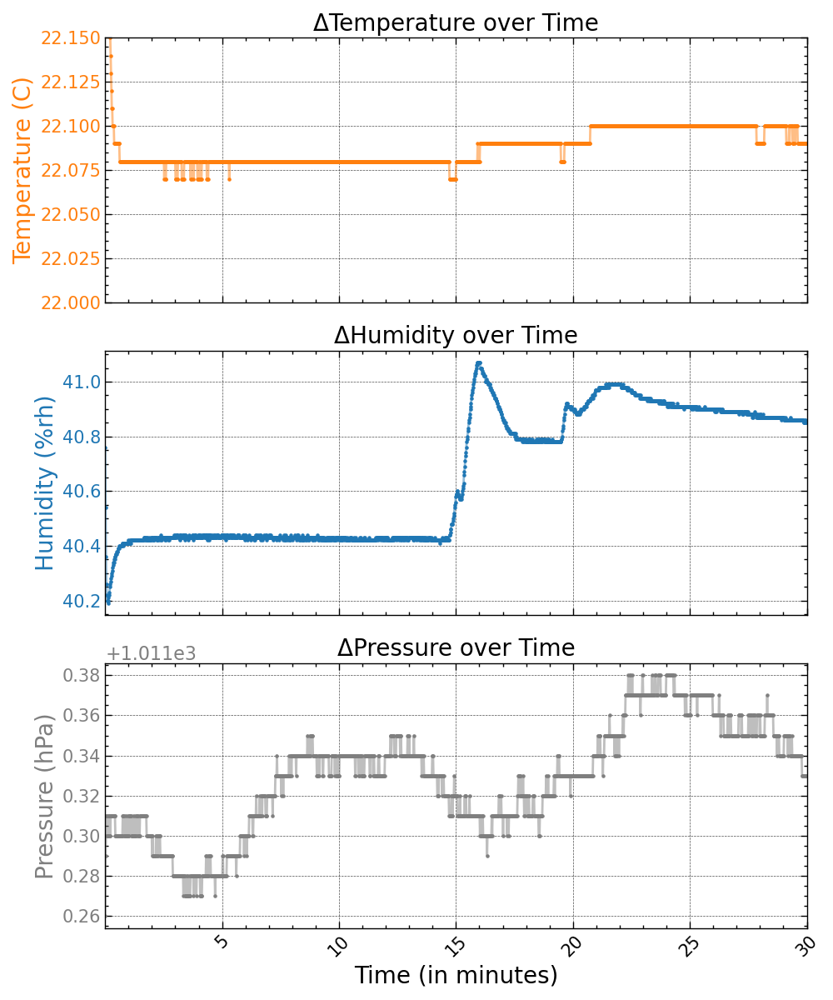

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file into a pandas DataFrame
df = pd.read_csv('Environmental_Readings_Modified_job1i.csv', parse_dates=[['Date', 'Time']], dayfirst=True)

# Calculate time difference in minutes from the minimum timestamp
df['Minutes'] = (df['Date_Time'] - df['Date_Time'].min()).dt.total_seconds() / 60

# Create subplots with shared x-axis
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)

# Plot Temperature on the first subplot
ax1.set_ylabel('Temperature (C)', color='tab:orange', fontsize=20)
ax1.scatter(df['Minutes'], df['Temperature(C)'], color='tab:orange', label='Temperature', s=5)
ax1.plot(df['Minutes'], df['Temperature(C)'], linestyle='-', color='tab:orange', alpha=0.5)
ax1.tick_params(axis='y', labelcolor='tab:orange', labelsize=15)
ax1.set_ylim(22, 22.15)
ax1.set_xlim(0.0009, 30)  # Adjust the limit as needed
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.tick_params(axis='x', labelrotation=45, labelsize=15)
ax1.set_title('ΔTemperature over Time', fontsize=20)

# Plot Humidity on the second subplot
ax2.set_ylabel('Humidity (%rh)', color='tab:blue', fontsize=20)
ax2.scatter(df['Minutes'], df['Humidity(%rh)'], color='tab:blue', label='Humidity', s=5)
ax2.plot(df['Minutes'], df['Humidity(%rh)'], linestyle='-', color='tab:blue', alpha=0.5)
ax2.tick_params(axis='y', labelcolor='tab:blue', labelsize=15)
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.tick_params(axis='x', labelrotation=45, labelsize=15)
ax2.set_xlim(0.0009, 30)  # Adjust the limit as needed
ax2.set_title('ΔHumidity over Time', fontsize=20)

# Plot Pressure on the third subplot
ax3.set_xlabel('Time (in minutes)', fontsize=20)
ax3.set_ylabel('Pressure (hPa)', color='tab:grey', fontsize=20)
ax3.scatter(df['Minutes'], df['Pressure(hPa)'], color='tab:grey', label='Pressure', s=5)
ax3.plot(df['Minutes'], df['Pressure(hPa)'], linestyle='-', color='tab:grey', alpha=0.5)
ax3.tick_params(axis='y', labelcolor='tab:grey', labelsize=15)
ax3.grid(True, linestyle='--', alpha=0.7)
ax3.tick_params(axis='x', labelrotation=45, labelsize=15)
ax3.set_title('ΔPressure over Time', fontsize=20)
ax3.set_xlim(0.0009, 30)  # Adjust the limit as needed

# Adjust layout to prevent clipping of labels
plt.tight_layout()
plt.savefig("experiment2_environment_reading_plot.pdf")

# Show the plot
plt.show()


### Position Plot along with smooth data

<IPython.core.display.Javascript object>


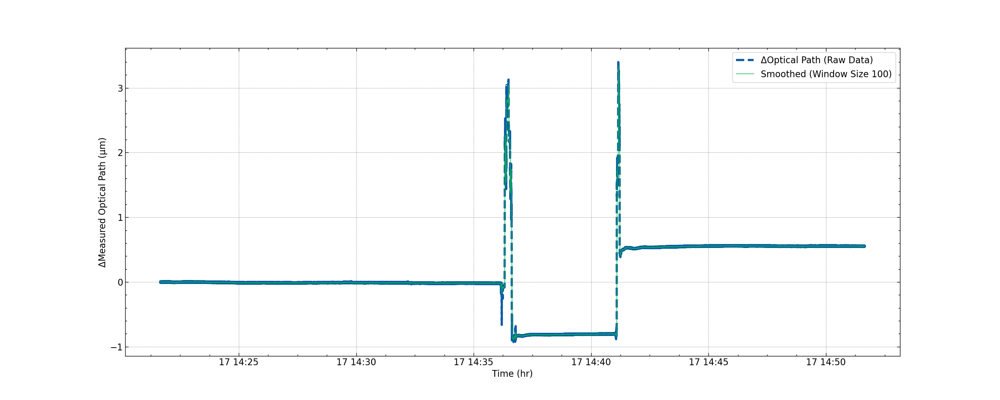

Δx1: 920000.0, Δx2: 270000.0, Δx: 650000.0


In [14]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib notebook

# Load data from the CSV file
data = pd.read_csv("pos_time_readings_job1i.csv")

# Extract Date, Time, and Position columns
date_time = data["Date"] + " " + data["Time"]
position_cm = data["Position (cm)"]

# Convert position to nanometers
position_pm = position_cm * 1e10  # 1 cm = 1e10 pm

# Convert date and time to datetime objects
date_time = pd.to_datetime(date_time, format="%Y-%m-%d %H:%M:%S")

# Calculate ΔOptical Path
delta_optical_path = position_pm - position_pm.iloc[0]  # Assuming the initial value is the reference point

# Apply moving average filters with different window sizes
window_size1 = 5  # Adjust the window size as needed
window_size2 = 100
position_smoothed1 = delta_optical_path.rolling(window=window_size1).mean()
position_smoothed2 = delta_optical_path.rolling(window=window_size2).mean()

# Calculate Δx
delta_x1 = abs(-8.2e5 + (-1e5))
delta_x2 = abs(-8.2e5 + 5.5e5)
delta_x = delta_x1 - delta_x2

# Create subplots
fig, ( ax2) = plt.subplots(1, 1, figsize=(25, 10), sharex=True)

# # Plot for the first window size
# ax1.plot(date_time, delta_optical_path, label="ΔOptical Path (Raw Data)", linestyle='-', linewidth=1, color='blue')
# # ax1.plot(date_time, position_smoothed1, label=f"Smoothed ΔOptical Path (Window Size {window_size1})", linestyle='-', linewidth=1, color='green')
# ax1.set_ylabel("ΔOptical Path (pm)")
# ax1.set_title("ΔOptical Path vs. Time")
# ax1.legend(fontsize=15)
# ax1.tick_params(axis='both', which='major', labelsize=15)

# Plot for the second window size
ax2.plot(date_time, delta_optical_path/1e6, label="ΔOptical Path (Raw Data)", linestyle='--', linewidth=4)
ax2.plot(date_time, position_smoothed2/1e6, label=f"Smoothed (Window Size {window_size2})", linestyle='-', linewidth=1)
ax2.set_xlabel("Time (hr)")
ax2.set_ylabel("ΔMeasured Optical Path (µm)")
# ax2.set_title(f"ΔOptical Path vs. Time with Moving Average Smoothing (Window Size {window_size2})", fontsize=15)
ax2.legend()
# ax2.tick_params(axis='both', which='major', labelsize=15)

# # Plot for the Third window size
# ax3.plot(date_time, position_smoothed2, label=f"Smoothed ΔOptical Path (Window Size {window_size2})", linestyle='-', linewidth=1, color='red')
# ax3.set_xlabel("Time (hr)", fontsize=15)
# ax3.set_ylabel("ΔOptical Path (pm)", fontsize=15)
# ax3.set_title(f"ΔOptical Path vs. Time (extracted) with Moving Average Smoothing (Window Size {window_size2})", fontsize=15)
# ax3.legend(fontsize=15)
# ax3.tick_params(axis='both', which='major', labelsize=15)

# Save the plot as an image
plt.savefig("experiment2_Displacement_plot_reading.png")

# Display the plot in a separate window in Jupyter Notebook
plt.show()

# Print the calculated Δx
print(f"Δx1: {delta_x1}, Δx2: {delta_x2}, Δx: {delta_x}")


<IPython.core.display.Javascript object>


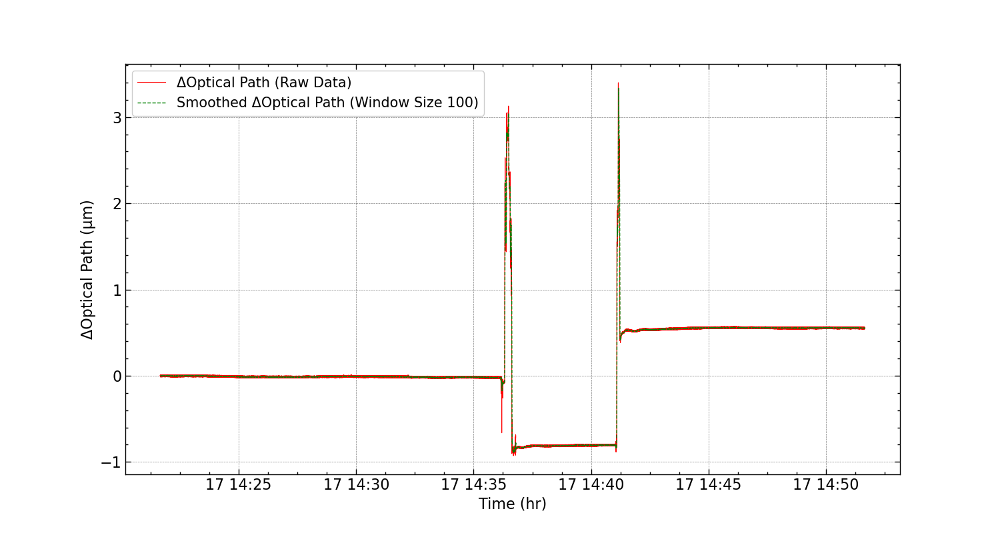

Δx1: 0.92, Δx2: 0.27, Δx: 0.65


In [53]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data from the CSV file
data = pd.read_csv("pos_time_readings_job1i.csv")

# Extract Date, Time, and Position columns
date_time = data["Date"] + " " + data["Time"]
position_cm = data["Position (cm)"]

# Convert position to nanometers
position_pm = position_cm * 1e10  # 1 cm = 1e10 pm

# Convert date and time to datetime objects
date_time = pd.to_datetime(date_time, format="%Y-%m-%d %H:%M:%S")

# Calculate ΔOptical Path
delta_optical_path = position_pm - position_pm.iloc[0]  # Assuming the initial value is the reference point

# Apply moving average filters with different window sizes
window_size1 = 5  # Adjust the window size as needed
window_size2 = 100
position_smoothed1 = delta_optical_path.rolling(window=window_size1).mean()
position_smoothed2 = delta_optical_path.rolling(window=window_size2).mean()

# Calculate Δx
delta_x1 = abs(-8.2e5 + (-1e5))
delta_x2 = abs(-8.2e5 + 5.5e5)
delta_x = delta_x1 - delta_x2

# Create subplots
fig, (ax2) = plt.subplots(1, 1, figsize=(15, 8), sharex=True)

# # Plot for the first window size
# ax1.plot(date_time, delta_optical_path, label="ΔOptical Path (Raw Data)", linestyle='-', linewidth=1, color='blue')
# ax1.plot(date_time, position_smoothed1, label=f"Smoothed ΔOptical Path (Window Size {window_size1})", linestyle='-', linewidth=1, color='green')
# ax1.set_ylabel("ΔOptical Path (pm)")
# ax1.set_title("ΔOptical Path vs. Time")
# ax1.legend(fontsize=15)
# ax1.tick_params(axis='both', which='major', labelsize=15)

# Plot for the second window size
ax2.plot(date_time, delta_optical_path/1e6, label="ΔOptical Path (Raw Data)", linestyle='-', linewidth=0.8, color='red')
ax2.plot(date_time, position_smoothed2/1e6, label=f"Smoothed ΔOptical Path (Window Size {window_size2})", linestyle='--', linewidth=1, color='green')
ax2.set_xlabel("Time (hr)")
ax2.set_ylabel("ΔOptical Path (μm)")
# ax2.set_title(f"ΔOptical Path vs. Time with Moving Average Smoothing (Window Size {window_size2})")
ax2.legend(fontsize=15)
ax2.tick_params(axis='both', which='major')

# # Plot for the Third window size
# ax3.plot(date_time, position_smoothed2, label=f"Smoothed ΔOptical Path (Window Size {window_size2})", linestyle='-', linewidth=1, color='red')
# ax3.set_xlabel("Time (hr)", fontsize=15)
# ax3.set_ylabel("ΔOptical Path (pm)", fontsize=15)
# ax3.set_title(f"ΔOptical Path vs. Time (extracted) with Moving Average Smoothing (Window Size {window_size2})")
# ax3.legend(fontsize=15)
# ax3.tick_params(axis='both', which='major', labelsize=15)

# Save the plot as an image
plt.savefig("experiment2_1_Displacement_plot_reading.png")

# Display the plot in a separate window in Jupyter Notebook
plt.show()

# Print the calculated Δx
print(f"Δx1: {delta_x1/1e6}, Δx2: {delta_x2/1e6}, Δx: {delta_x/1e6}")


### Calibration result

<IPython.core.display.Javascript object>


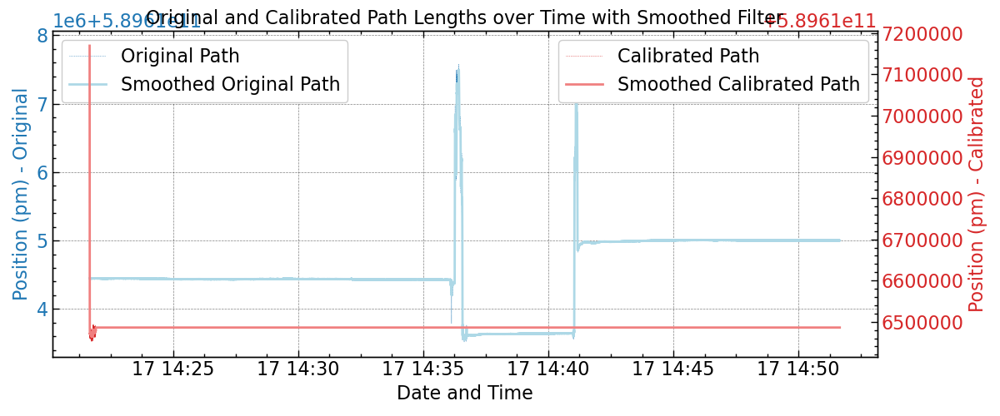

<IPython.core.display.Javascript object>


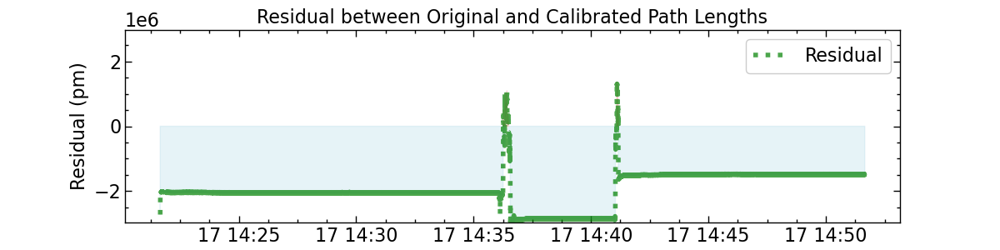

In [15]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) #hpa to kpa: 1hpa = 0.1kpa

def calculate_calibrated_path(original_path, refractive_index_standard, refractive_index_air):
    return original_path * refractive_index_standard / refractive_index_air

def plot_paths_with_twin_axes(date_time, original_path, calibrated_path, label_original="Original Path", label_calibrated="Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(12, 5))

    color = 'tab:blue'
    ax1.set_xlabel("Date and Time")
    ax1.set_ylabel("Position (pm) - Original", color=color)
    ax1.plot(date_time, original_path, label=label_original, linestyle='dotted', linewidth=0.5, color=color)
    ax1.plot(date_time, original_path.rolling(window=50, min_periods=1).mean(), label='Smoothed Original Path', linestyle='-', linewidth=2, color='lightblue')  # Adjust the window size as needed
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.legend(loc='upper left')
    

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel("Position (pm) - Calibrated", color=color)
    ax2.plot(date_time, calibrated_path, label=label_calibrated, linestyle='dotted', linewidth=0.5, color=color)
    ax2.plot(date_time, calibrated_path.rolling(window=50, min_periods=1).mean(), label='Smoothed Calibrated Path', linestyle='-', linewidth=2, color='lightcoral')  # Adjust the window size as needed
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right')

    fig.tight_layout()
    plt.title("Original and Calibrated Path Lengths over Time with Smoothed Filter")
    plt.grid(False)
    plt.show()
    plt.savefig('Experiment_2_Path_analysis_result.jpg')

def plot_residual(date_time, residual, label="Residual"):
    plt.figure(figsize=(12, 3))
    plt.plot(date_time, residual, label=label, linestyle='dotted', linewidth=4, color='green', alpha=0.7)
    
    # Calculate the maximum absolute value in the residual
    max_abs_residual = max(abs(residual))
    
    # Set y-axis limits symmetrically around 0
    plt.ylim([-max_abs_residual, max_abs_residual])
    
    plt.fill_between(date_time, 0, residual, where=(residual > 0), interpolate=True, color='lightcoral', alpha=0.3)
    plt.fill_between(date_time, 0, residual, where=(residual < 0), interpolate=True, color='lightblue', alpha=0.3)
    
    plt.xlabel("Date and Time")
    plt.ylabel("Residual (pm)")
    plt.title("Residual between Original and Calibrated Path Lengths")
    plt.legend()
    plt.grid(False)
    plt.savefig('Experiment_2_calibrated_displacement_result.jpg')  # Save the figure
    plt.show()

# Load data
position_data = load_data("pos_time_readings_job1i.csv")
environment_data = load_data('Environmental_Readings_Modified_job1i.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Calculate the residual between actual and calibrated paths
residual_interpolated = position_pm_interpolated - calibrated_path_interpolated

# Plot original and calibrated paths with twin axes and smoothed filter
plot_paths_with_twin_axes(date_time_interpolated, position_pm_interpolated, calibrated_path_interpolated)
 
# Plot the residual between original and calibrated paths
plot_residual(date_time_interpolated, residual_interpolated)

# # Add a custom ruler
# # Coordinates of the point (x1, y1) that you want to mark
# x1 = pd.to_datetime("17 11:43", format="%d %H:%M")
# y1 = 5.89616606e+11
# plt.add_patch(patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='r', facecolor='none'))




C:\Users\biswa\AppData\Local\Temp\ipykernel_25008\1830492028.py:11: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  environment_data = pd.read_csv('Environmental_Readings_Modified_job1i.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)


Time Constant (tau) of Refractive Index over Time: 1.0000048984016823 seconds


<IPython.core.display.Javascript object>


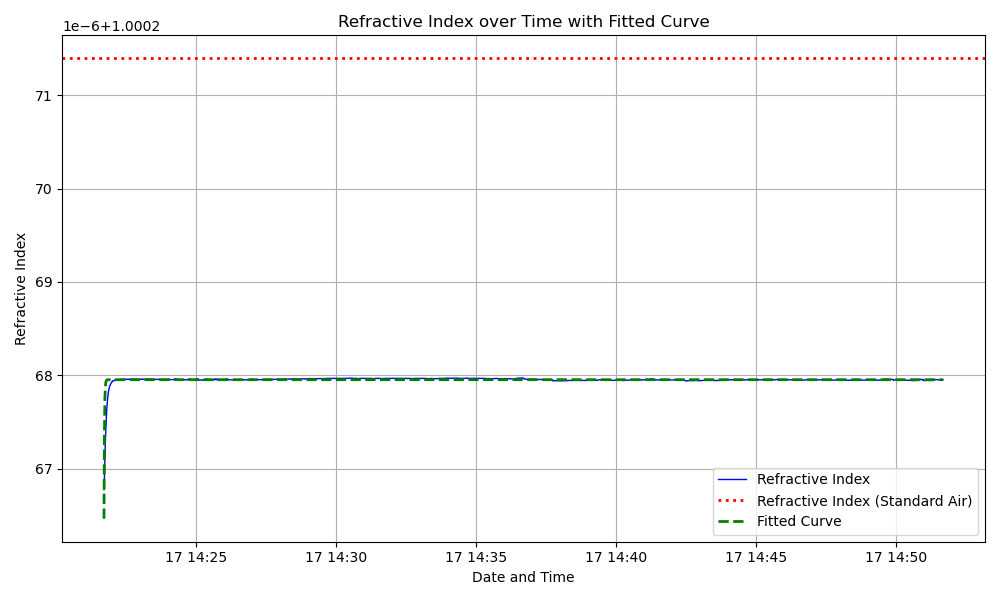

In [90]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit
from datetime import datetime

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160))  # hPa to kPa: 1 hPa = 0.1 kPa

# Load data
environment_data = pd.read_csv('Environmental_Readings_Modified_job1i.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)

# Set the start time
start_time = "17/11/2023 14:22:00.734"
start_time = datetime.strptime(start_time, "%d/%m/%Y %H:%M:%S.%f")

# Calculate refractive index using environmental data
refractive_index = calculate_refractive_index(environment_data['Pressure(hPa)'],
                                               environment_data['Temperature(C)'],
                                               environment_data['Humidity(%rh)'])

# Refractive index of standard air
refractive_index_standard = 1.0002713938

# Time constant calculation (fitting exponential decay model)
def exponential_decay_model(t, A, tau, C):
    return A * np.exp(-t / tau) + C

# Extract time and refractive index data
time_data = (environment_data['Date_Time'] - start_time).dt.total_seconds().values
refractive_index_data = refractive_index.values

# Fit the model to the data
popt, _ = curve_fit(exponential_decay_model, time_data, refractive_index_data)

# Extract time constant (tau) from the fitted parameters
time_constant = popt[1]
time_constant_unit = "seconds"

print("Time Constant (tau) of Refractive Index over Time:", time_constant, time_constant_unit)

# Plot the fitted curve
fitted_curve = exponential_decay_model(time_data, *popt)

plt.figure(figsize=(10, 6))
plt.plot(environment_data['Date_Time'], refractive_index, label='Refractive Index', linestyle='-', linewidth=1, color='blue')
plt.axhline(y=refractive_index_standard, color='red', linestyle='dotted', linewidth=2, label='Refractive Index (Standard Air)')
plt.plot(environment_data['Date_Time'], fitted_curve, label='Fitted Curve', linestyle='--', linewidth=2, color='green')
plt.xlabel('Date and Time')
plt.ylabel('Refractive Index')
plt.title('Refractive Index over Time with Fitted Curve')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# Experiment 3

### Environmental Parameters plot

In [31]:
#Data not found

### Position Plot along with smooth data

<IPython.core.display.Javascript object>


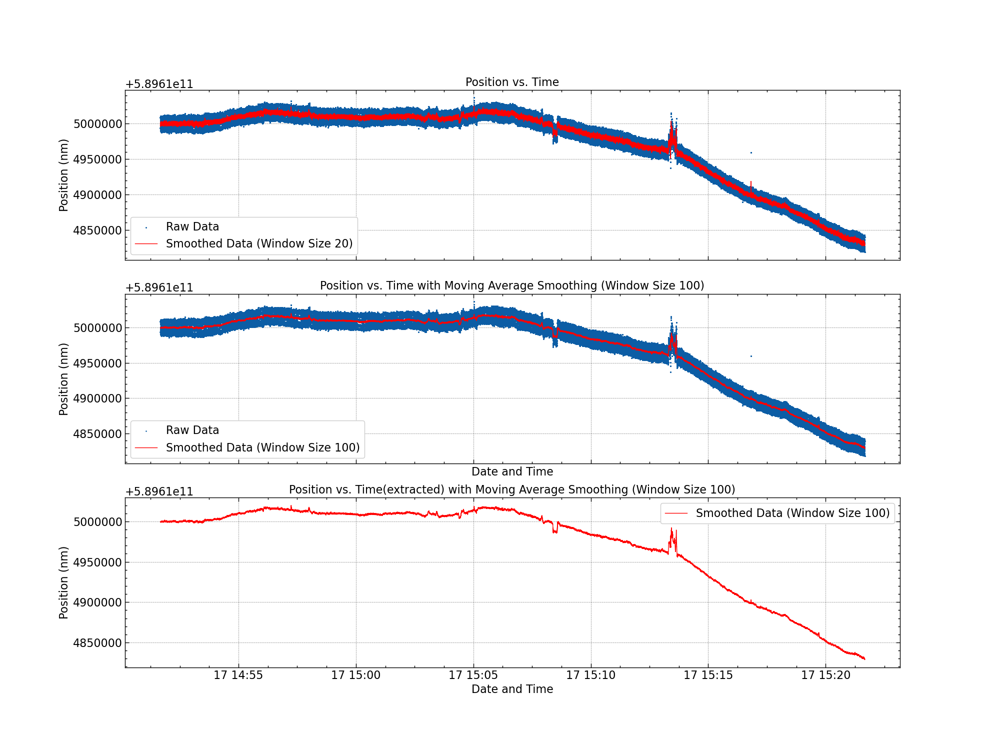

In [15]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data from the CSV file
data = pd.read_csv("pos_time_readings_job1ii.csv")

# Extract Date, Time, and Position columns
date_time = data["Date"] + " " + data["Time"]
position_cm = data["Position (cm)"]

# Convert position to nanometers
position_pm = position_cm * 1e10  # 1 cm = 1e10 pm

# Convert date and time to datetime objects
date_time = pd.to_datetime(date_time, format="%Y-%m-%d %H:%M:%S")

# Apply moving average filters with different window sizes
window_size1 = 20  # Adjust the window size as needed
window_size2 = 100
position_smoothed1 = position_pm.rolling(window=window_size1).mean()
position_smoothed2 = position_pm.rolling(window=window_size2).mean()

# Create subplots
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(20, 15), sharex=True)
 
# Plot for the first window size
ax1.scatter(date_time, position_pm, marker='.', s=5, label="Raw Data")  # Original data
ax1.plot(date_time, position_smoothed1, label=f"Smoothed Data (Window Size {window_size1})", linestyle='-', linewidth=1, color='red')
ax1.set_ylabel("Position (nm)")
ax1.set_title(f"Position vs. Time")
ax1.legend()
ax1.grid(True)

# Plot for the second window size
ax2.scatter(date_time, position_pm, marker='.', s=3, label="Raw Data")  # Original data
ax2.plot(date_time, position_smoothed2, label=f"Smoothed Data (Window Size {window_size2})", linestyle='-', linewidth=1, color='red')
ax2.set_xlabel("Date and Time")
ax2.set_ylabel("Position (nm)")
ax2.set_title(f"Position vs. Time with Moving Average Smoothing (Window Size {window_size2})")
ax2.legend()
ax2.grid(True)

# Plot for the Third window size
# ax3.scatter(date_time, position_pm, marker='.', s=3, label="Raw Data")  # Original data
ax3.plot(date_time, position_smoothed2, label=f"Smoothed Data (Window Size {window_size2})", linestyle='-', linewidth=1, color='red')
ax3.set_xlabel("Date and Time")
ax3.set_ylabel("Position (nm)")
ax3.set_title(f"Position vs. Time(extracted) with Moving Average Smoothing (Window Size {window_size2})")
ax3.legend()
ax3.grid(True)

# Save the plot as an image
# plt.savefig("smoothed_subplot_slid.png")

# Display the plot in a separate window in Jupyter Notebook
plt.show()


# Experiment 4

### Environmental Parameters plot

<IPython.core.display.Javascript object>


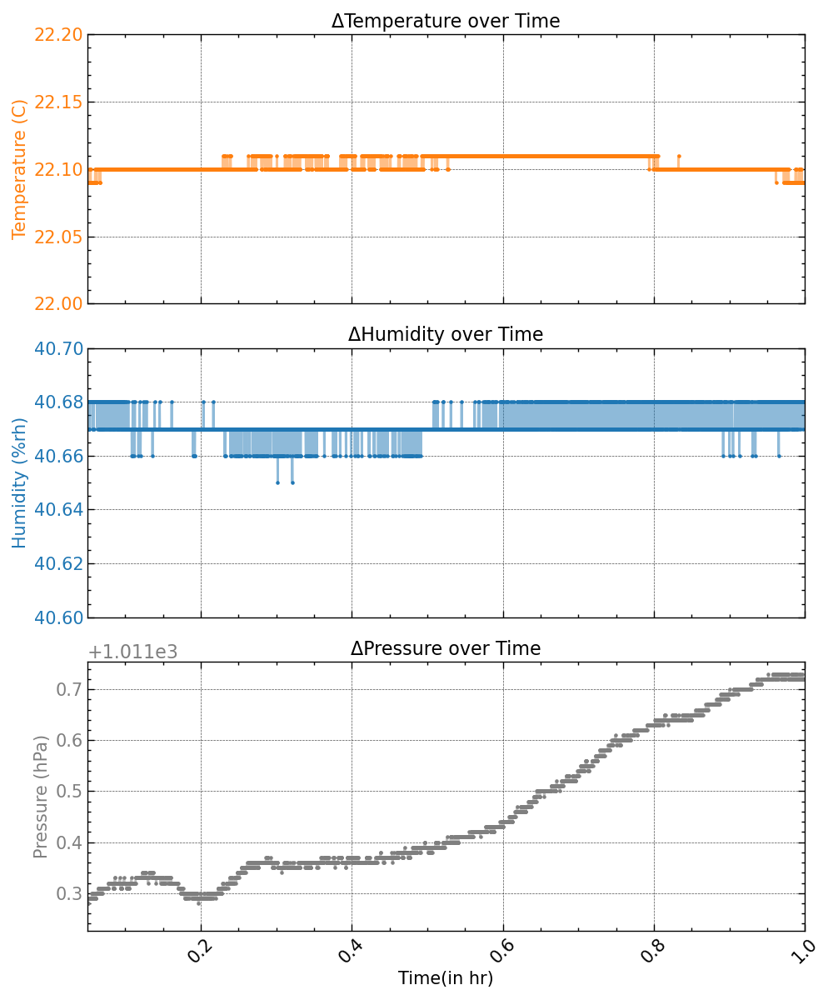

In [32]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file into a pandas DataFrame
df = pd.read_csv('Environmental_Readings_Modified_job2.csv', parse_dates=[['Date', 'Time']], dayfirst=True)

# Calculate time difference in hours from the minimum timestamp
df['Hours'] = (df['Date_Time'] - df['Date_Time'].min()).dt.total_seconds() / 3600

# Create subplots with shared x-axis
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)

# Plot Temperature on the first subplot
ax1.set_ylabel('Temperature (C)', color='tab:orange', fontsize=15)
ax1.scatter(df['Hours'], df['Temperature(C)'], color='tab:orange', label='Temperature', s=5)
ax1.plot(df['Hours'], df['Temperature(C)'], linestyle='-', color='tab:orange', alpha=0.5)
ax1.tick_params(axis='y', labelcolor='tab:orange', labelsize=15)
ax1.set_ylim(22, 22.2)
ax1.set_xlim(0.01,1)
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.tick_params(axis='x', labelrotation=45,labelsize=15)
ax1.set_title('ΔTemperature over Time')

# Plot Humidity on the second subplot
ax2.set_ylabel('Humidity (%rh)', color='tab:blue', fontsize=15)
ax2.scatter(df['Hours'], df['Humidity(%rh)'], color='tab:blue', label='Humidity', s=5)
ax2.plot(df['Hours'], df['Humidity(%rh)'], linestyle='-', color='tab:blue', alpha=0.5)
ax2.tick_params(axis='y', labelcolor='tab:blue', labelsize=15)
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.tick_params(axis='x', labelrotation=45,labelsize=15)
ax1.set_xlim(0.01,1)
ax2.set_ylim(40.6, 40.7)
ax2.set_title('ΔHumidity over Time')

# Plot Pressure on the third subplot
ax3.set_xlabel('Time(in hr)', fontsize=15)
ax3.set_ylabel('Pressure (hPa)', color='tab:grey', fontsize=15)
ax3.scatter(df['Hours'], df['Pressure(hPa)'], color='tab:grey', label='Pressure', s=5)
ax3.plot(df['Hours'], df['Pressure(hPa)'], linestyle='-', color='tab:grey', alpha=0.5)
ax3.tick_params(axis='y', labelcolor='tab:grey', labelsize=15)
ax3.grid(True, linestyle='--', alpha=0.7)
ax3.tick_params(axis='x', labelrotation=45, labelsize=15)
ax3.set_title('ΔPressure over Time')
ax1.set_xlim(0.05,1)

# Adjust layout to prevent clipping of labels
plt.tight_layout()
plt.savefig('Experiment 4 environment.png')

# Show the plot
plt.show()


### Position Plot along with smooth data

<IPython.core.display.Javascript object>


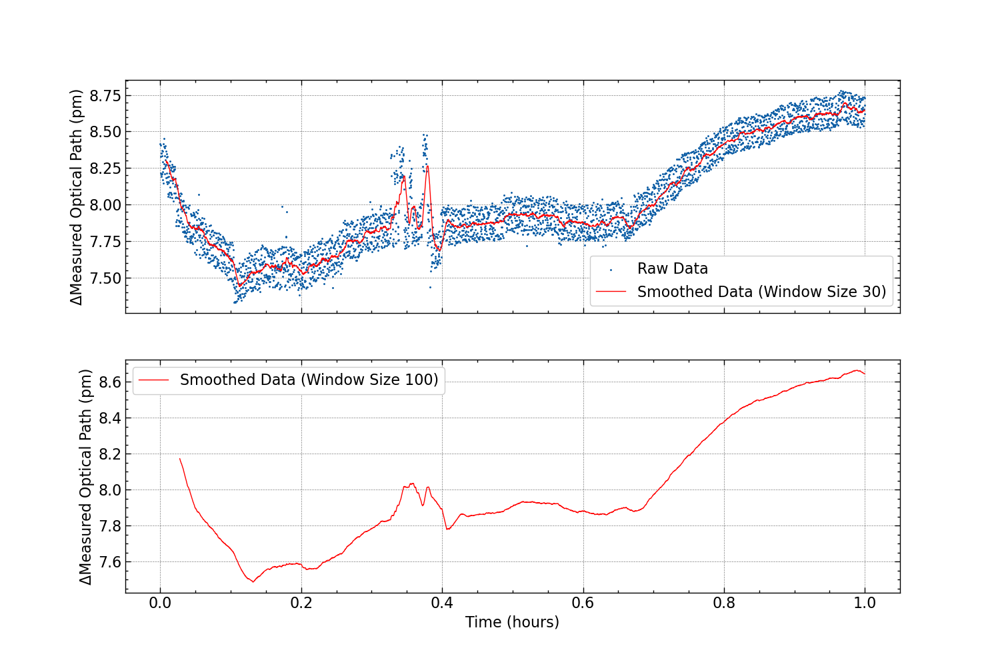

In [22]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data from the CSV file
data = pd.read_csv("pos_time_readings_job2.csv")

# Extract Date, Time, and Position columns
date_time = data["Date"] + " " + data["Time"]
position_cm = data["Position (cm)"]

# Convert position to nanometers
position_pm = position_cm * 1e10  # 1 cm = 1e10 pm

# Convert date and time to datetime objects
date_time = pd.to_datetime(date_time, format="%Y-%m-%d %H:%M:%S")

# Convert time to hours since the start
start_time = date_time.min()
date_time_hours = (date_time - start_time).dt.total_seconds() / 3600

# Apply moving average filters with different window sizes
window_size1 = 30  # Adjust the window size as needed
window_size2 = 100
position_smoothed1 = position_pm.rolling(window=window_size1).mean()
position_smoothed2 = position_pm.rolling(window=window_size2).mean()

# Create subplots
fig, (ax1, ax3) = plt.subplots(2, 1, figsize=(15, 10), sharex=True)

# Plot for the first window size
ax1.scatter(date_time_hours, (position_pm- 5.89614e11)/1e5, marker='.', s=5, label="Raw Data")  # Original data
ax1.plot(date_time_hours, (position_smoothed1 - 5.89614e11)/1e5, label=f"Smoothed Data (Window Size {window_size1})", linestyle='-', linewidth=1, color='red')
ax1.set_ylabel("ΔMeasured Optical Path (pm)")
# ax1.set_title("ΔMeasured Optical Path vs. Time")
ax1.legend()
ax1.grid(True)

# # Plot for the second window size
# ax2.scatter(date_time_hours, position_pm, marker='.', s=3, label="Raw Data")  # Original data
# ax2.plot(date_time_hours, position_smoothed2, label=f"Smoothed Data (Window Size {window_size2})", linestyle='-', linewidth=1, color='red')
# ax2.set_xlabel("Time (hours)", fontsize=15)
# ax2.set_ylabel("ΔOptical Path (pm)", fontsize=15)
# ax2.set_title(f"ΔOptical Path vs. Time with Moving Average Smoothing (Window Size {window_size2})", fontsize=15)
# ax2.legend(fontsize=15)
# ax2.grid(True)

# Plot for the Third window size
#ax3.scatter(date_time_hours, position_pm, marker='.', s=3, label="Raw Data")  # Original data
ax3.plot(date_time_hours, (position_smoothed2 - 5.89614e11)/1e5, label=f"Smoothed Data (Window Size {window_size2})", linestyle='-', linewidth=1, color='red')
ax3.set_xlabel("Time (hours)")
ax3.set_ylabel("ΔMeasured Optical Path (pm)")
# ax3.set_title(f"ΔMeasured Optical Path vs. Time(extracted) with Moving Average Smoothing (Window Size {window_size2})")
ax3.legend()
ax3.grid(True)

# Save the plot as an image
plt.savefig("experiment4_Displacement_plot_reading.png")

# Display the plot in a separate window in Jupyter Notebook
plt.show()


### Calibration result

<IPython.core.display.Javascript object>


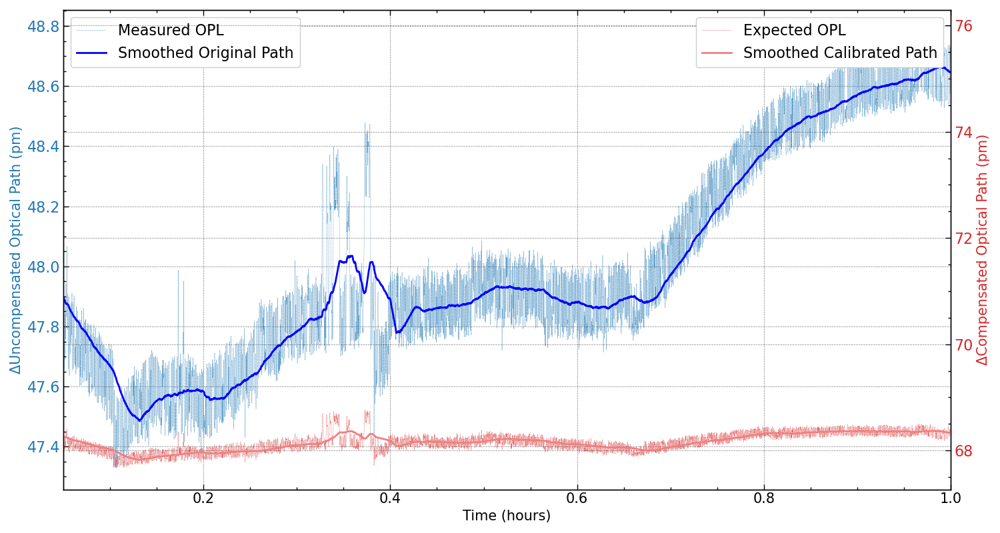

In [39]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160))  # hpa to kpa: 1hpa = 0.1kpa

def calculate_calibrated_path(original_path, refractive_index_standard, refractive_index_air):
    return original_path * refractive_index_standard / refractive_index_air

def plot_paths_with_twin_axes(time, original_path, calibrated_path, label_original="Original Path", label_calibrated="Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(15, 8))

    color = 'tab:blue'
    ax1.set_xlabel("Time (hours)", fontsize=15)
    ax1.tick_params(axis='x', labelsize=15)
    ax1.set_ylabel("ΔUncompensated Optical Path (pm)", color=color, fontsize=15)
    ax1.plot(time, (original_path-5.8961e11)/1e5, label='Measured OPL', linestyle='dotted', linewidth=0.5, color=color)
    ax1.plot(time, (original_path.rolling(window=100, min_periods=1).mean() - 5.8961e11)/1e5, label='Smoothed Original Path', linestyle='-', linewidth=2, color='blue')  # Adjust the window size as needed
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.legend(loc='upper left')
    ax1.set_xlim(0.05,1)
    
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel("ΔCompensated Optical Path (pm)", color=color, fontsize=15)
    ax2.plot(time, (calibrated_path - 5.8961e11)/1e5, label='Expected OPL', linestyle='dotted', linewidth=0.5, color=color)
    ax2.plot(time, (calibrated_path.rolling(window=100, min_periods=1).mean()- 5.8961e11)/1e5, label='Smoothed Calibrated Path', linestyle='-', linewidth=2, color='lightcoral')  # Adjust the window size as needed
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right')
    ax2.set_xlim(0.05,1)
    fig.tight_layout()
#     plt.title("Displacement vs Time", fontsize=15)
#     plt.grid(True)
    plt.savefig('Experiment4_Displacement_calibration_plot_reading.jpg')  # Save the figure
    plt.show()

# Load data
position_data = load_data("pos_time_readings_job2.csv")
environment_data = load_data('Environmental_Readings_Modified_job2.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
time_interpolated = time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Convert time to hours starting from 0
time_in_hours = (time_interpolated - time_interpolated.min()).total_seconds() / 3600


# Plot original and calibrated paths with twin axes and smoothed filter
plot_paths_with_twin_axes(time_in_hours, position_pm_interpolated, calibrated_path_interpolated)





The time constant (tau) is typically calculated using the formula for exponential decay:

y(t) = y_0 * e^{-t/tau} 

Where:
- y(t) is the value at time \( t \),
- y_0 is the initial value at \( t = 0 \),
- tau is the time constant,
-  e is the mathematical constant approximately equal to 2.71828.

C:\Users\biswa\AppData\Local\Temp\ipykernel_3500\1485561928.py:11: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  environment_data = pd.read_csv('Environmental_Readings_Modified_job2.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)


Time Constant (tau) of Refractive Index over Time: 1.0000069661694813 seconds
Average Refractive Index: 1.0002679720843224
Difference of calculated RI from Refractive Index (Standard Air): 3.4217156776872315e-06


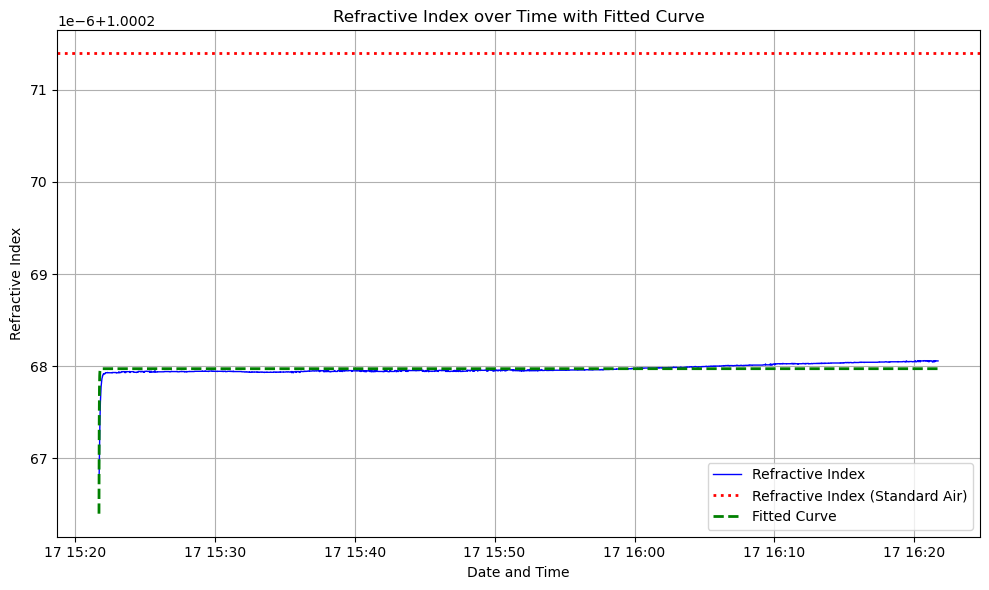

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit
from datetime import datetime

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160))  # hPa to kPa: 1 hPa = 0.1 kPa

# Load data
environment_data = pd.read_csv('Environmental_Readings_Modified_job2.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)

# Set the start time
start_time = "17/11/2023 15:22:00.734"
start_time = datetime.strptime(start_time, "%d/%m/%Y %H:%M:%S.%f")

# Calculate refractive index using environmental data
refractive_index = calculate_refractive_index(environment_data['Pressure(hPa)'],
                                               environment_data['Temperature(C)'],
                                               environment_data['Humidity(%rh)'])

# Refractive index of standard air
refractive_index_standard = 1.0002713938

# Time constant calculation (fitting exponential decay model)
def exponential_decay_model(t, A, tau, C):
    return A * np.exp(-t / tau) + C

# Extract time and refractive index data
time_data = (environment_data['Date_Time'] - start_time).dt.total_seconds().values
refractive_index_data = refractive_index.values

# Fit the model to the data
popt, _ = curve_fit(exponential_decay_model, time_data, refractive_index_data)

# Extract time constant (tau) from the fitted parameters
time_constant = popt[1]
time_constant_unit = "seconds"

# Calculate average refractive index
average_refractive_index = np.mean(refractive_index_data)

# Subtract average refractive index from the refractive index of standard air
refractive_index_difference = np.abs(average_refractive_index - refractive_index_standard)

print("Time Constant (tau) of Refractive Index over Time:", time_constant, time_constant_unit)
print("Average Refractive Index:", average_refractive_index)
print("Difference of calculated RI from Refractive Index (Standard Air):", refractive_index_difference)

# Plot the fitted curve
fitted_curve = exponential_decay_model(time_data, *popt)

plt.figure(figsize=(10, 6))
plt.plot(environment_data['Date_Time'], refractive_index, label='Refractive Index', linestyle='-', linewidth=1, color='blue')
plt.axhline(y=refractive_index_standard, color='red', linestyle='dotted', linewidth=2, label='Refractive Index (Standard Air)')
plt.plot(environment_data['Date_Time'], fitted_curve, label='Fitted Curve', linestyle='--', linewidth=2, color='green')
plt.xlabel('Date and Time')
plt.ylabel('Refractive Index')
plt.title('Refractive Index over Time with Fitted Curve')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>


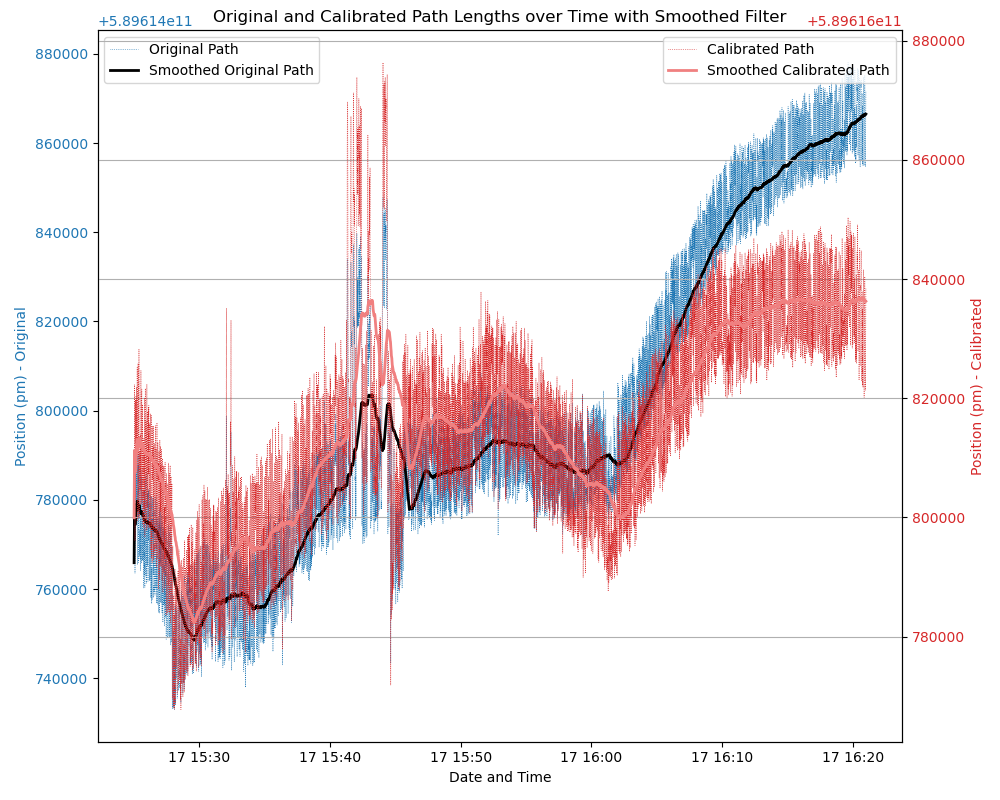

In [106]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) # hpa to kpa: 1hpa = 0.1kpa

def calculate_calibrated_path(original_path, refractive_index_standard, refractive_index_air):
    return original_path * refractive_index_standard / refractive_index_air

def plot_paths_with_twin_axes_smoothed(date_time, original_path, calibrated_path, label_original="Original Path", label_calibrated="Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(10, 8))

    color = 'tab:blue'
    ax1.set_xlabel("Date and Time")
    ax1.set_ylabel("Position (pm) - Original", color=color)
    ax1.plot(date_time, original_path, label=label_original, linestyle='dotted', linewidth=0.5, color=color)
    ax1.plot(date_time, original_path.rolling(window=100, min_periods=1).mean(), label='Smoothed Original Path', linestyle='-', linewidth=2, color='black')  # Adjust the window size as needed
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel("Position (pm) - Calibrated", color=color)
    ax2.plot(date_time, calibrated_path, label=label_calibrated, linestyle='dotted', linewidth=0.5, color=color)
    ax2.plot(date_time, calibrated_path.rolling(window=100, min_periods=1).mean(), label='Smoothed Calibrated Path', linestyle='-', linewidth=2, color='lightcoral')  # Adjust the window size as needed
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right')

    fig.tight_layout()
    plt.title("Original and Calibrated Path Lengths over Time with Smoothed Filter")
    plt.grid(True)
    plt.show()

# Load data
position_data = load_data("pos_time_readings_job2.csv")
environment_data = load_data('Environmental_Readings_Modified_job2.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Extract the data for the specified time range (from 12:56 to 1:56)
start_time = pd.to_datetime("2023-11-17 15:25:00", format="%Y-%m-%d %H:%M:%S")
end_time = pd.to_datetime("2023-11-17 16:21:00", format="%Y-%m-%d %H:%M:%S")

selected_range = (date_time_interpolated >= start_time) & (date_time_interpolated <= end_time)
date_time_selected = date_time_interpolated[selected_range]
position_pm_selected = position_pm_interpolated[selected_range]
calibrated_path_selected = calibrated_path_interpolated[selected_range]

# Plot original and calibrated paths with twin axes and smoothed filter for the specified time range
plot_paths_with_twin_axes_smoothed(date_time_selected, position_pm_selected, calibrated_path_selected)


<IPython.core.display.Javascript object>


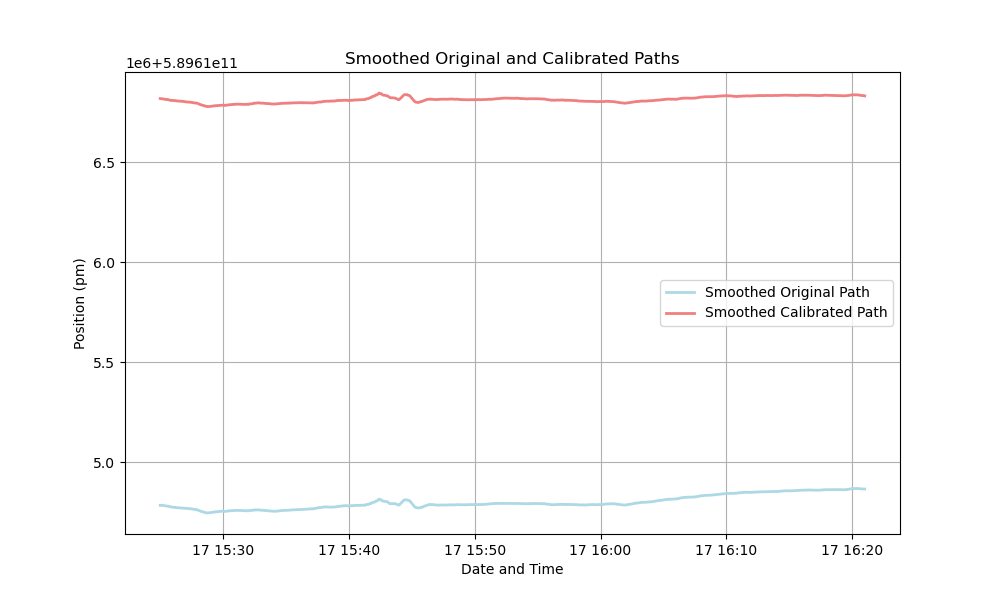

In [107]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) # hpa to kpa: 1hpa = 0.1kpa

def plot_smoothed_paths(date_time, smoothed_original_path, smoothed_calibrated_path, label_smoothed_original="Smoothed Original Path", label_smoothed_calibrated="Smoothed Calibrated Path"):
    plt.figure(figsize=(10, 6))

    plt.plot(date_time, smoothed_original_path, label=label_smoothed_original, linestyle='-', linewidth=2, color='lightblue')
    plt.plot(date_time, smoothed_calibrated_path, label=label_smoothed_calibrated, linestyle='-', linewidth=2, color='lightcoral')

    plt.xlabel("Date and Time")
    plt.ylabel("Position (pm)")
    plt.legend()
    plt.title("Smoothed Original and Calibrated Paths")
    plt.grid(True)
    plt.show()

# Load data
position_data = load_data("pos_time_readings_job2.csv")
environment_data = load_data('Environmental_Readings_Modified_job2.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Extract the data for the specified time range (from 12:56 to 1:56)
start_time = pd.to_datetime("2023-11-17 15:25:00", format="%Y-%m-%d %H:%M:%S")
end_time = pd.to_datetime("2023-11-17 16:21:00", format="%Y-%m-%d %H:%M:%S")

selected_range = (date_time_interpolated >= start_time) & (date_time_interpolated <= end_time)
date_time_selected = date_time_interpolated[selected_range]
smoothed_original_path_selected = position_pm_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]
smoothed_calibrated_path_selected = calibrated_path_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]

# Plot only the smoothed original and calibrated paths for the specified time range
plot_smoothed_paths(date_time_selected, smoothed_original_path_selected, smoothed_calibrated_path_selected)


<IPython.core.display.Javascript object>


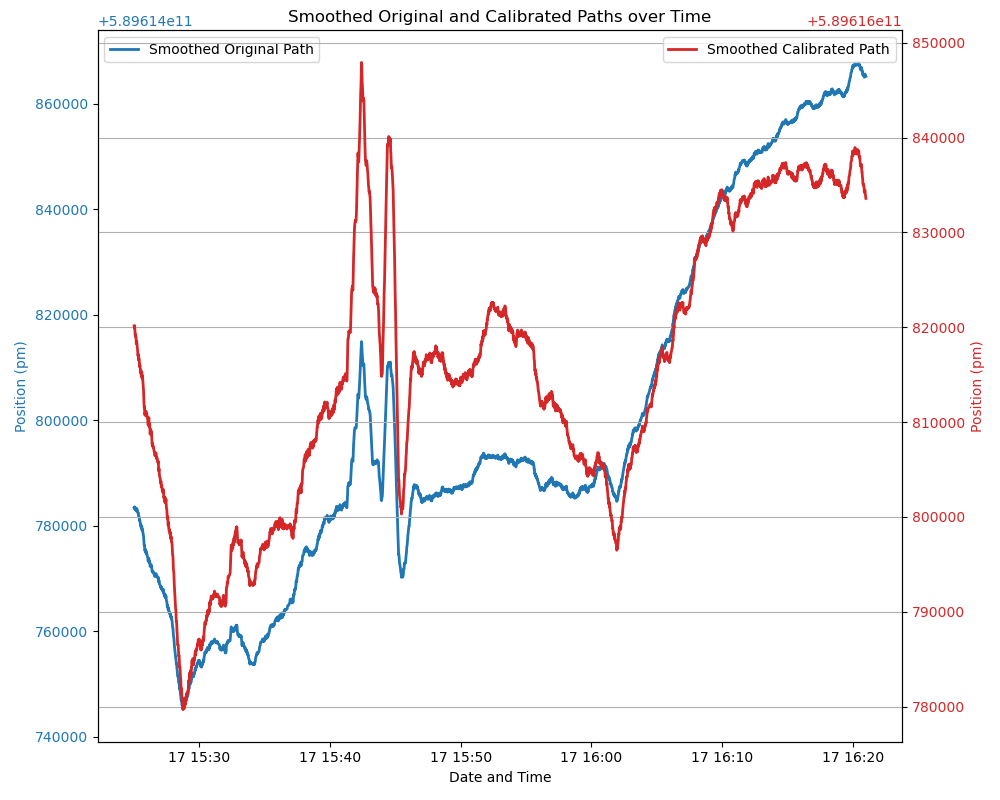

In [108]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) # hpa to kpa: 1hpa = 0.1kpa

def plot_smoothed_paths_twin_axes(date_time, smoothed_original_path, smoothed_calibrated_path, label_original="Smoothed Original Path", label_calibrated="Smoothed Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(10, 8))

    color = 'tab:blue'
    ax1.set_xlabel("Date and Time")
    ax1.set_ylabel("Position (pm)", color=color)
    ax1.plot(date_time, smoothed_original_path, label=label_original, linestyle='-', linewidth=2, color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel("Position (pm)", color=color)
    ax2.plot(date_time, smoothed_calibrated_path, label=label_calibrated, linestyle='-', linewidth=2, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right')

    fig.tight_layout()
    plt.title("Smoothed Original and Calibrated Paths over Time")
    plt.grid(True)
    plt.show()

# Load data
position_data = load_data("pos_time_readings_job2.csv")
environment_data = load_data('Environmental_Readings_Modified_job2.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Extract the data for the specified time range (from 12:56 to 1:56)
start_time = pd.to_datetime("2023-11-17 15:25:00", format="%Y-%m-%d %H:%M:%S")
end_time = pd.to_datetime("2023-11-17 16:21:00", format="%Y-%m-%d %H:%M:%S")

selected_range = (date_time_interpolated >= start_time) & (date_time_interpolated <= end_time)
date_time_selected = date_time_interpolated[selected_range]
smoothed_original_path_selected = position_pm_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]
smoothed_calibrated_path_selected = calibrated_path_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]

# Plot smoothed original and calibrated paths with twin axes for the specified time range
plot_smoothed_paths_twin_axes(date_time_selected, smoothed_original_path_selected, smoothed_calibrated_path_selected)


C:\Users\biswa\AppData\Local\Temp\ipykernel_25008\19410844.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10, 5))


<IPython.core.display.Javascript object>


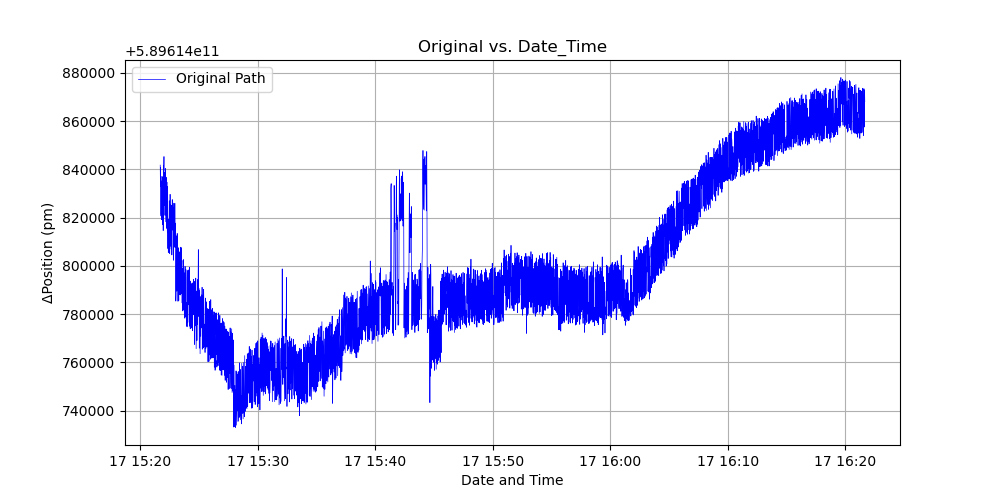

<IPython.core.display.Javascript object>


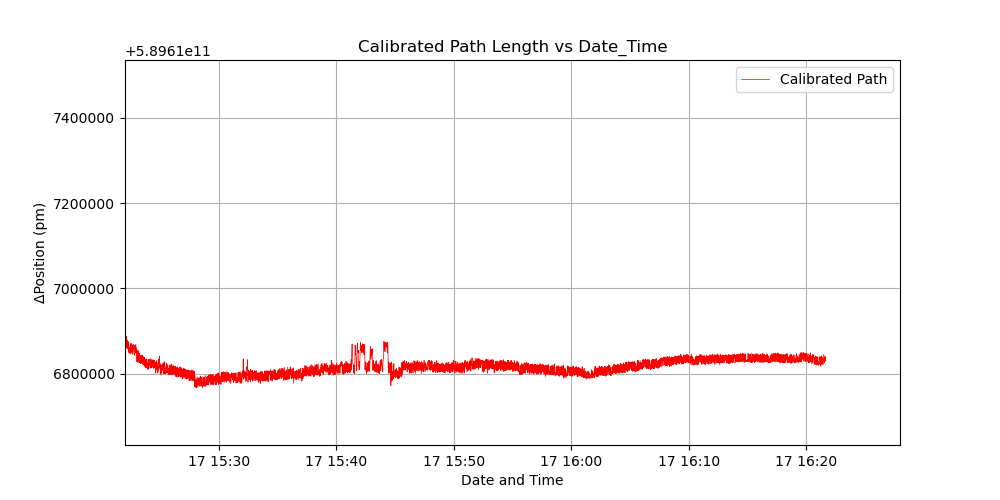

<IPython.core.display.Javascript object>


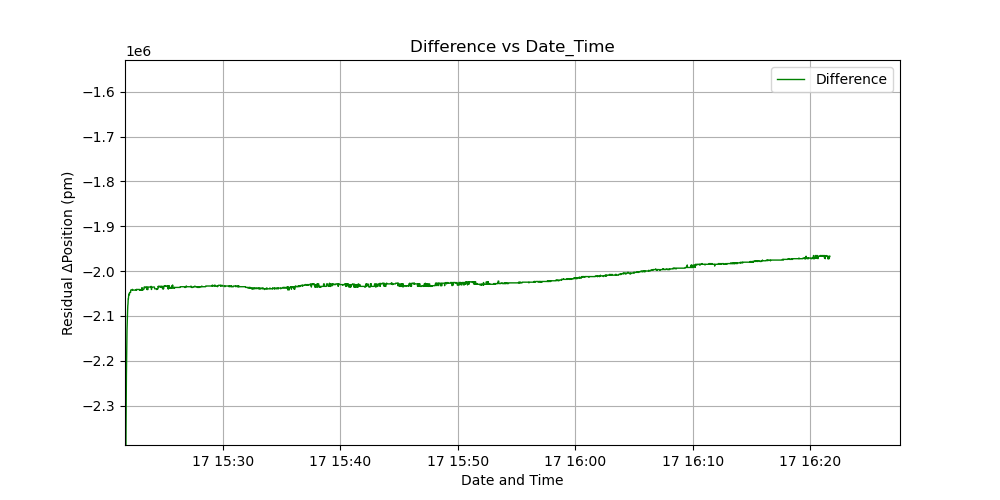

In [109]:
# Plot original and calibrated paths overlapped
plt.figure(figsize=(10, 5))
plt.plot(date_time_interpolated, position_pm_interpolated, label="Original Path", linestyle='-', linewidth=0.5, color='blue')
# plt.plot(date_time_interpolated, calibrated_path_interpolated, label="Calibrated Path", linestyle='-', linewidth=1, color='red')
plt.xlabel("Date and Time")
plt.ylabel("ΔPosition (pm)")
plt.title("Original vs. Date_Time")
plt.legend()
plt.grid(True)
plt.show()

# Plot original and calibrated paths overlapped
plt.figure(figsize=(10, 5))
# plt.plot(date_time_interpolated, position_pm_interpolated, label="Original Path", linestyle='-', linewidth=1, color='blue')
plt.plot(date_time_interpolated, calibrated_path_interpolated, label="Calibrated Path", linestyle='-', linewidth=0.5, color='red')
plt.xlabel("Date and Time")
plt.ylabel("ΔPosition (pm)")
plt.title("Calibrated Path Length vs Date_Time")
plt.legend()
plt.grid(True)
plt.show()

# Plot actual path and difference in the same plot
difference_interpolated = position_pm_interpolated - calibrated_path_interpolated
plt.figure(figsize=(10, 5))
# plt.plot(date_time_interpolated, position_pm_interpolated, label="Actual Path", linestyle='-', linewidth=1, color='blue')
plt.plot(date_time_interpolated, difference_interpolated, label="Difference", linestyle='-', linewidth=1, color='green')
plt.xlabel("Date and Time")
plt.ylabel("Residual ΔPosition (pm)")
plt.title("Difference vs Date_Time")
plt.legend()
plt.grid(True)
plt.show()


# Experiment 5

### Environmental Parameters plot

<IPython.core.display.Javascript object>


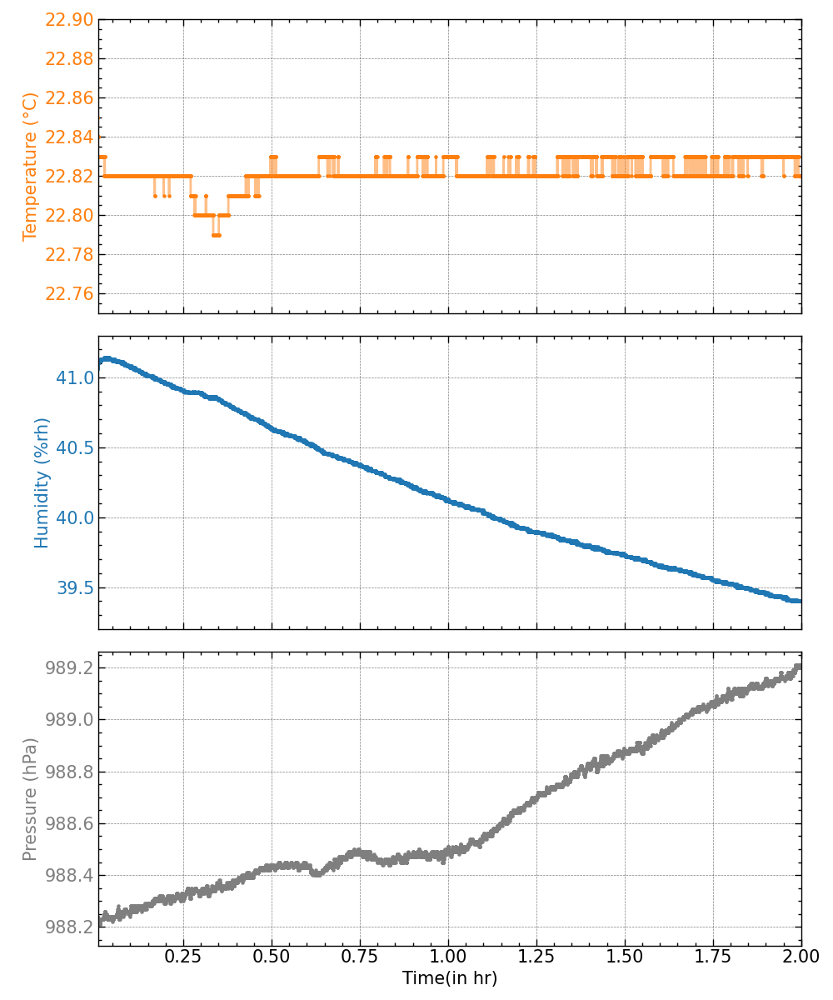

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file into a pandas DataFrame
df = pd.read_csv('Environmental_Readings_Modified_exp3.csv', parse_dates=[['Date', 'Time']], dayfirst=True)

# Calculate time difference in hours from the minimum timestamp
df['Hours'] = (df['Date_Time'] - df['Date_Time'].min()).dt.total_seconds() / 3600

# Create subplots with shared x-axis
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)

# Plot Temperature on the first subplot
ax1.set_ylabel('Temperature (°C)', color='tab:orange', fontsize=15)
ax1.scatter(df['Hours'], df['Temperature(C)'], color='tab:orange', label='Temperature', s=5)
ax1.plot(df['Hours'], df['Temperature(C)'], linestyle='-', color='tab:orange', alpha=0.5)
ax1.tick_params(axis='y', labelcolor='tab:orange', labelsize=15)
ax1.set_ylim(22.75, 22.9)
ax1.set_xlim(0.01,2)
# ax1.grid(True, linestyle='--', alpha=0.7)
ax1.tick_params(axis='x',labelsize=15)
# ax1.set_title('ΔTemperature over Time')

# Plot Humidity on the second subplot
ax2.set_ylabel('Humidity (%rh)', color='tab:blue', fontsize=15)
ax2.scatter(df['Hours'], df['Humidity(%rh)'], color='tab:blue', label='Humidity', s=5)
ax2.plot(df['Hours'], df['Humidity(%rh)'], linestyle='-', color='tab:blue', alpha=0.5)
ax2.tick_params(axis='y', labelcolor='tab:blue', labelsize=15)
# ax2.grid(True, linestyle='--', alpha=0.7)
ax2.tick_params(axis='x',labelsize=15)
ax1.set_xlim(0.01,2)
ax2.set_ylim( 39.2, 41.3)
# ax2.set_title('ΔHumidity over Time')

# Plot Pressure on the third subplot
ax3.set_xlabel('Time(in hr)', fontsize=15)
ax3.set_ylabel('Pressure (hPa)', color='tab:grey', fontsize=15)
ax3.scatter(df['Hours'], df['Pressure(hPa)'], color='tab:grey', label='Pressure', s=5)
ax3.plot(df['Hours'], df['Pressure(hPa)'], linestyle='-', color='tab:grey', alpha=0.5)
ax3.tick_params(axis='y', labelcolor='tab:grey', labelsize=15)
# ax3.grid(True, linestyle='--', alpha=0.7)
ax3.tick_params(axis='x', labelsize=15)
# ax3.set_title('ΔPressure over Time')
ax1.set_xlim(0.01,2)

# Adjust layout to prevent clipping of labels
plt.tight_layout()
plt.savefig('Experiment 5 environment.png')

# plt.grid(False)
# Show the plot
plt.show()


Temperature Sensitivity: -0.17364436089182245 mK/s


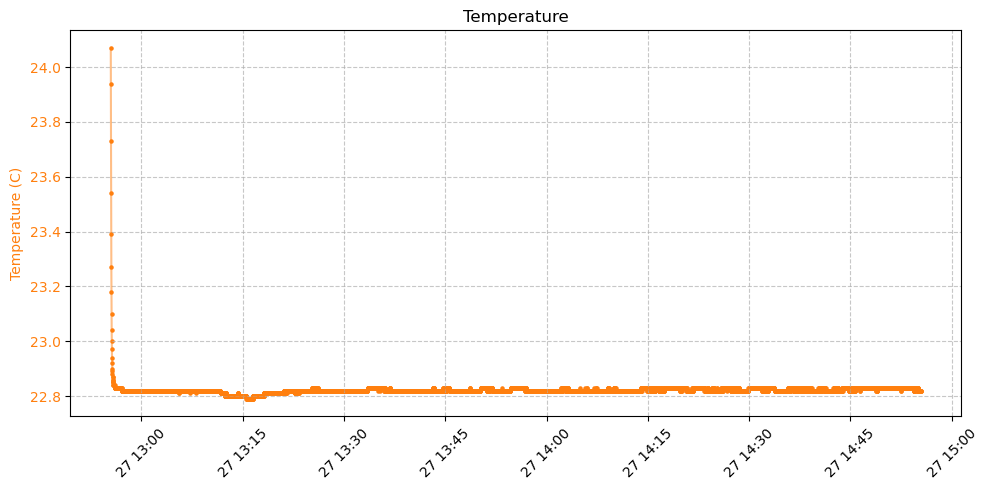

In [21]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file into a pandas DataFrame
df = pd.read_csv('Environmental_Readings_Modified_exp3.csv', parse_dates=[['Date', 'Time']], dayfirst=True)

# Plot Temperature on the first subplot
fig, ax1 = plt.subplots(figsize=(10, 5))

ax1.set_ylabel('Temperature (C)', color='tab:orange')
ax1.scatter(df['Date_Time'], df['Temperature(C)'], color='tab:orange', label='Temperature', s=5)
ax1.plot(df['Date_Time'], df['Temperature(C)'], linestyle='-', color='tab:orange', alpha=0.5)
ax1.tick_params(axis='y', labelcolor='tab:orange')
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.tick_params(axis='x', labelrotation=45)
ax1.set_title('Temperature')

# Calculate time differences and temperature differences
time_diff = df['Date_Time'].diff().dt.total_seconds()  # Calculate time differences in seconds
temp_diff = df['Temperature(C)'].diff()

# Convert temperature differences to millikelvin
temp_diff_mK = temp_diff * 1000

# Calculate temperature sensitivity (change in temperature per second) in millikelvin per second
temperature_sensitivity_mK = temp_diff_mK / time_diff

# Display the calculated temperature sensitivity in millikelvin per second
print("Temperature Sensitivity:", temperature_sensitivity_mK.mean(), "mK/s")

# Show the plot
plt.tight_layout()
plt.show()


### Position Plot along with smooth data

<IPython.core.display.Javascript object>


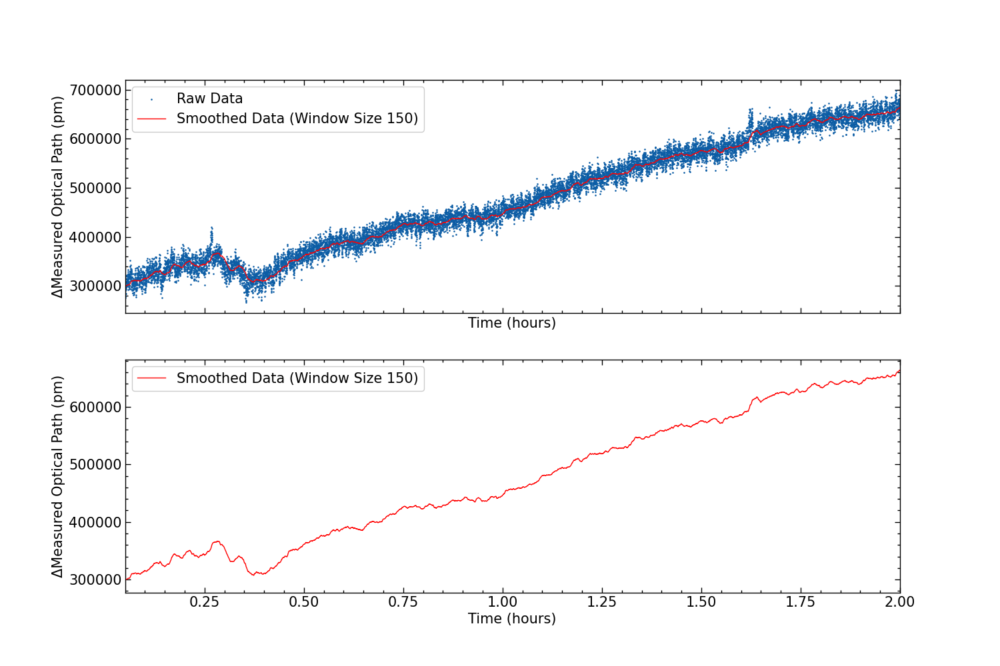

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data from the CSV file
data = pd.read_csv("pos_time_readings_exp3.csv")

# Extract Date, Time, and Position columns
date_time = data["Date"] + " " + data["Time"]
position_cm = data["Position (cm)"]

# Convert position to nanometers
position_pm = position_cm * 1e10  # 1 cm = 1e10 pm

# Convert date and time to datetime objects
date_time = pd.to_datetime(date_time, format="%Y-%m-%d %H:%M:%S")

# Calculate the time in hours starting from 0
time_hours = (date_time - date_time.min()).dt.total_seconds() / 3600

# Apply moving average filters with different window sizes
window_size1 = 20  # Adjust the window size as needed
window_size2 = 150
position_smoothed1 = position_pm.rolling(window=window_size1).mean()
position_smoothed2 = position_pm.rolling(window=window_size2).mean()

# Create subplots
fig, ( ax2, ax3) = plt.subplots(2, 1, figsize=(15, 10), sharex=True)
# # Plot for the first window size
# ax1.scatter(time_hours, position_pm, marker='.', s=5, label="Raw Data")  # Original data
# ax1.plot(time_hours, position_smoothed1, label=f"Smoothed Data (Window Size {window_size1})", linestyle='-', linewidth=1, color='red')
# ax1.set_ylabel("ΔOptical Path (pm)", fontsize=15)
# ax1.set_title("ΔOptical Path vs. Time", fontsize=20)
# ax1.tick_params(axis='y', labelsize=15)
# ax1.legend(fontsize=15)
# ax1.grid(True)

# Plot for the second window size
ax2.scatter(time_hours, position_pm - 5.89593e11, marker='.', s=3, label="Raw Data")  # Original data
ax2.plot(time_hours, position_smoothed2 - 5.89593e11, label=f"Smoothed Data (Window Size {window_size2})", linestyle='-', linewidth=1, color='red')
ax2.set_xlabel("Time (hours)", fontsize=15)
ax2.set_ylabel("ΔMeasured Optical Path (pm)", fontsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax2.set_title(f"ΔOptical Path vs. Time with Moving Average Smoothing (Window Size {window_size2})", fontsize=15)
ax2.legend(fontsize=15)
ax2.grid(False)

# Plot for the Third window size
# ax3.scatter(time_hours, position_pm, marker='.', s=3, label="Raw Data")  # Original data
ax3.plot(time_hours, position_smoothed2 - 5.89593e11 , label=f"Smoothed Data (Window Size {window_size2})", linestyle='-', linewidth=1, color='red')
ax3.set_xlabel("Time (hours)", fontsize=15)
ax3.set_ylabel("ΔMeasured Optical Path (pm)", fontsize=15)
ax3.tick_params(axis='x', labelsize=15)
ax3.tick_params(axis='y', labelsize=15)
# ax3.set_title(f"ΔOptical Path vs. Time (extracted) with Moving Average Smoothing (Window Size {window_size2})", fontsize=15)
ax3.legend(fontsize=15)
ax1.set_xlim(0.05,2)
ax3.set_xlim(0.05,2)
ax3.grid(False)

# Save the plot as an image
plt.savefig("experiment5_Displacement_plot_reading.png")

# Display the plot in a separate window in Jupyter Notebook
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data from the CSV file
data = pd.read_csv("pos_time_readings_exp3.csv")

# Extract Date, Time, and Position columns
date_time = data["Date"] + " " + data["Time"]
position_cm = data["Position (cm)"]

# Convert position to nanometers
position_pm = position_cm * 1e10  # 1 cm = 1e10 pm

# Convert date and time to datetime objects
date_time = pd.to_datetime(date_time, format="%Y-%m-%d %H:%M:%S")

# Calculate the time in hours starting from 0
time_hours = (date_time - date_time.min()).dt.total_seconds() / 3600

# Apply moving average filters with different window sizes
window_size1 = 20  # Adjust the window size as needed
window_size2 = 150
position_smoothed1 = position_pm.rolling(window=window_size1).mean()
position_smoothed2 = position_pm.rolling(window=window_size2).mean()

# Create subplots
fig, ( ax2, ax3) = plt.subplots(2, 1, figsize=(15, 10), sharex=True)
# # Plot for the first window size
# ax1.scatter(time_hours, position_pm, marker='.', s=5, label="Raw Data")  # Original data
# ax1.plot(time_hours, position_smoothed1, label=f"Smoothed Data (Window Size {window_size1})", linestyle='-', linewidth=1, color='red')
# ax1.set_ylabel("ΔOptical Path (pm)", fontsize=15)
# ax1.set_title("ΔOptical Path vs. Time", fontsize=20)
# ax1.tick_params(axis='y', labelsize=15)
# ax1.legend(fontsize=15)
# ax1.grid(True)

# Plot for the second window size
ax2.scatter(time_hours, position_pm - 5.89593e11, marker='.', s=3, label="Raw Data")  # Original data
ax2.plot(time_hours, position_smoothed2 - 5.89593e11, label=f"Smoothed Data (Window Size {window_size2})", linestyle='-', linewidth=1, color='red')
ax2.set_xlabel("Time (hours)", fontsize=15)
ax2.set_ylabel("ΔOptical Path (pm)", fontsize=15)
ax2.tick_params(axis='y', labelsize=15)
ax2.set_title(f"ΔOptical Path vs. Time with Moving Average Smoothing (Window Size {window_size2})", fontsize=15)
ax2.legend(fontsize=15)
ax2.grid(True)

# Plot for the Third window size
# ax3.scatter(time_hours, position_pm, marker='.', s=3, label="Raw Data")  # Original data
ax3.plot(time_hours, position_smoothed2 - 5.89593e11 , label=f"Smoothed Data (Window Size {window_size2})", linestyle='-', linewidth=1, color='red')
ax3.set_xlabel("Time (hours)", fontsize=15)
ax3.set_ylabel("ΔOptical Path (pm)", fontsize=15)
ax3.tick_params(axis='x', labelsize=15)
ax3.tick_params(axis='y', labelsize=15)
ax3.set_title(f"ΔOptical Path vs. Time (extracted) with Moving Average Smoothing (Window Size {window_size2})", fontsize=15)
ax3.legend(fontsize=15)
ax1.set_xlim(0.05,2)
ax3.set_xlim(0.05,2)
ax3.grid(False)

# Save the plot as an image
# plt.savefig("experiment5_Displacement_plot_reading.png")

# Display the plot in a separate window in Jupyter Notebook
plt.show()


### Calibration result

<IPython.core.display.Javascript object>


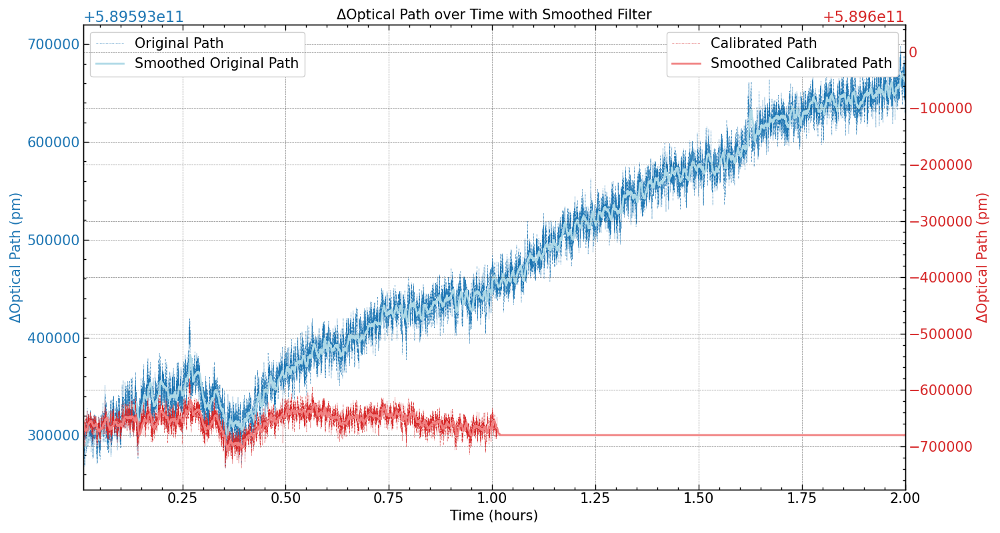

In [27]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160))  # hpa to kpa: 1hpa = 0.1kpa

def calculate_calibrated_path(original_path, refractive_index_standard, refractive_index_air):
    return original_path * refractive_index_standard / refractive_index_air

def plot_paths_with_twin_axes(date_time, original_path, calibrated_path, label_original="Original Path", label_calibrated="Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(15, 8))

    color = 'tab:blue'
    ax1.set_xlabel("Time (hours)", fontsize=15)
    ax1.tick_params(axis='x', labelsize = 15)
    ax1.set_ylabel("ΔOptical Path (pm)", color=color, fontsize=15)
    
    # Convert date_time to hours since the start
    hours = (date_time - date_time.min()).astype('timedelta64[s]') / 3600
    
    ax1.plot(hours, original_path, label=label_original, linestyle='dotted', linewidth=0.5, color=color)
    ax1.plot(hours, original_path.rolling(window=50, min_periods=1).mean(), label='Smoothed Original Path', linestyle='-', linewidth=2, color='lightblue')  # Adjust the window size as needed
    ax1.tick_params(axis='y', labelcolor=color, labelsize = 15)
    ax1.legend(loc='upper left', fontsize=15)

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel("ΔOptical Path (pm)", color=color, fontsize=15)
    ax2.plot(hours, calibrated_path, label=label_calibrated, linestyle='dotted', linewidth=0.5, color=color)
    ax2.plot(hours, calibrated_path.rolling(window=50, min_periods=1).mean(), label='Smoothed Calibrated Path', linestyle='-', linewidth=2, color='lightcoral')  # Adjust the window size as needed
    ax2.tick_params(axis='y', labelcolor=color, labelsize = 15)
    ax2.legend(loc='upper right', fontsize=15)
   

    fig.tight_layout()
    plt.title("ΔOptical Path over Time with Smoothed Filter", fontsize=15)
    plt.grid(True)
    ax1.set_xlim(0.01,2)
    plt.savefig('Experiment5_Displacement_calibrated_Plot_Reading.jpg')  # Save the figure
    plt.show()

# Load data
position_data = load_data("pos_time_readings_exp3.csv")
environment_data = load_data('Environmental_Readings_Modified_exp3.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Plot original and calibrated paths with twin axes and smoothed filter
plot_paths_with_twin_axes(date_time_interpolated, position_pm_interpolated, calibrated_path_interpolated)


Above plot is the result of not sampled data, hence interpolation needed in this case

Time Constant (tau) of Refractive Index over Time: 1.0 seconds
Average Refractive Index: 1.0002612651394336
Difference of calculated RI from Refractive Index (Standard Air): 1.0128660566488534e-05


C:\Users\biswa\AppData\Local\Temp\ipykernel_25008\3576977880.py:11: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  environment_data = pd.read_csv('Environmental_Readings_Modified_exp3.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)
C:\Users\biswa\anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


<IPython.core.display.Javascript object>


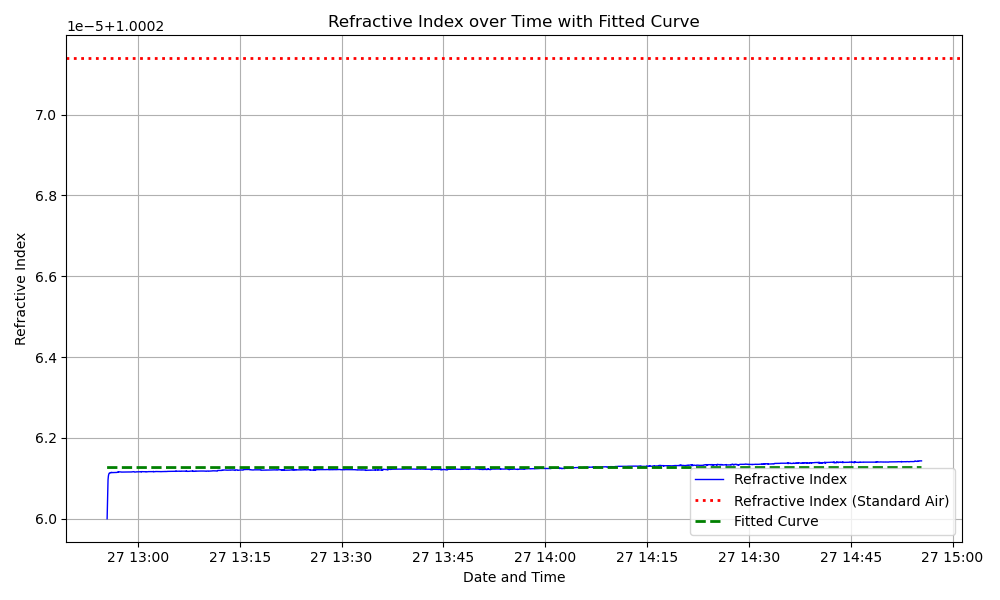

In [116]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit
from datetime import datetime

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160))  # hPa to kPa: 1 hPa = 0.1 kPa

# Load data
environment_data = pd.read_csv('Environmental_Readings_Modified_exp3.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)

# Set the start time
start_time = "17/11/2023 15:22:00.734"
start_time = datetime.strptime(start_time, "%d/%m/%Y %H:%M:%S.%f")

# Calculate refractive index using environmental data
refractive_index = calculate_refractive_index(environment_data['Pressure(hPa)'],
                                               environment_data['Temperature(C)'],
                                               environment_data['Humidity(%rh)'])

# Refractive index of standard air
refractive_index_standard = 1.0002713938

# Time constant calculation (fitting exponential decay model)
def exponential_decay_model(t, A, tau, C):
    return A * np.exp(-t / tau) + C

# Extract time and refractive index data
time_data = (environment_data['Date_Time'] - start_time).dt.total_seconds().values
refractive_index_data = refractive_index.values

# Fit the model to the data
popt, _ = curve_fit(exponential_decay_model, time_data, refractive_index_data)

# Extract time constant (tau) from the fitted parameters
time_constant = popt[1]
time_constant_unit = "seconds"

# Calculate average refractive index
average_refractive_index = np.mean(refractive_index_data)

# Subtract average refractive index from the refractive index of standard air
refractive_index_difference = np.abs(average_refractive_index - refractive_index_standard)

print("Time Constant (tau) of Refractive Index over Time:", time_constant, time_constant_unit)
print("Average Refractive Index:", average_refractive_index)
print("Difference of calculated RI from Refractive Index (Standard Air):", refractive_index_difference)

# Plot the fitted curve
fitted_curve = exponential_decay_model(time_data, *popt)

plt.figure(figsize=(10, 6))
plt.plot(environment_data['Date_Time'], refractive_index, label='Refractive Index', linestyle='-', linewidth=1, color='blue')
plt.axhline(y=refractive_index_standard, color='red', linestyle='dotted', linewidth=2, label='Refractive Index (Standard Air)')
plt.plot(environment_data['Date_Time'], fitted_curve, label='Fitted Curve', linestyle='--', linewidth=2, color='green')
plt.xlabel('Date and Time')
plt.ylabel('Refractive Index')
plt.title('Refractive Index over Time with Fitted Curve')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>


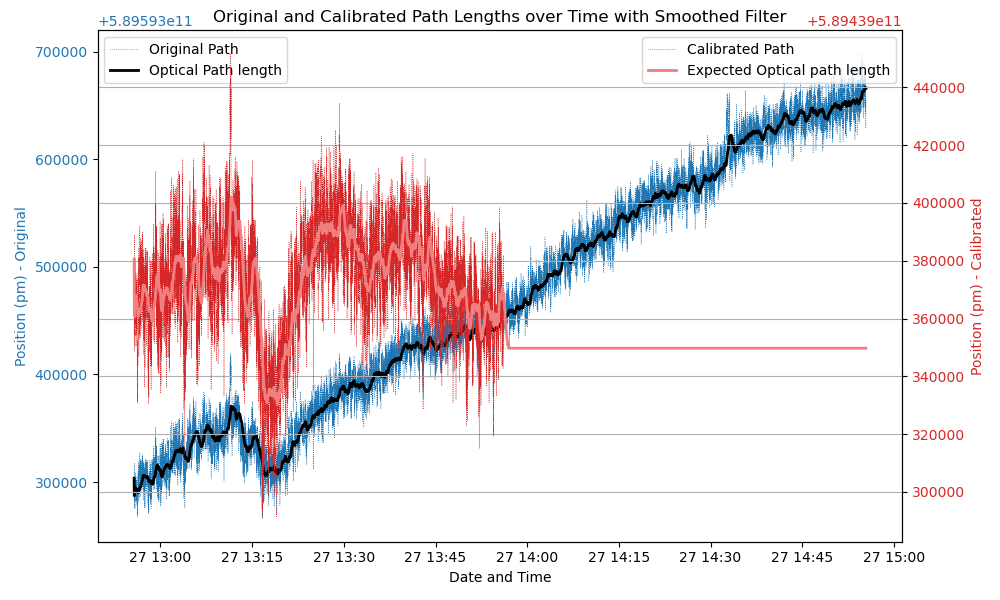

In [84]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) # hpa to kpa: 1hpa = 0.1kpa

def calculate_calibrated_path(original_path, refractive_index_standard, refractive_index_air):
    return original_path * refractive_index_standard / refractive_index_air

def plot_paths_with_twin_axes_smoothed(date_time, original_path, calibrated_path, label_original="Original Path", label_calibrated="Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(10,6))

    color = 'tab:blue'
    ax1.set_xlabel("Date and Time")
    ax1.set_ylabel("Position (pm) - Original", color=color)
    ax1.plot(date_time, original_path, label=label_original, linestyle='dotted', linewidth=0.5, color=color)
    ax1.plot(date_time, original_path.rolling(window=100, min_periods=1).mean(), label='Optical Path length', linestyle='-', linewidth=2, color='black')  # Adjust the window size as needed
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel("Position (pm) - Calibrated", color=color)
    ax2.plot(date_time, calibrated_path, label=label_calibrated, linestyle='dotted', linewidth=0.5, color=color)
    ax2.plot(date_time, calibrated_path.rolling(window=100, min_periods=1).mean(), label='Expected Optical path length', linestyle='-', linewidth=2, color='lightcoral')  # Adjust the window size as needed
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right')

    fig.tight_layout()
    plt.title("Original and Calibrated Path Lengths over Time with Smoothed Filter")
    plt.grid(True)
    plt.show()

# Load data
position_data = load_data("pos_time_readings_exp3.csv")
environment_data = load_data('Environmental_Readings_Modified_exp3.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Extract the data for the specified time range (from 12:56 to 1:56)
start_time = pd.to_datetime("2023-11-27 12:55:41.038", format="%Y-%m-%d %H:%M:%S")
end_time = pd.to_datetime("2023-11-27 14:55:25.363", format="%Y-%m-%d %H:%M:%S")

selected_range = (date_time_interpolated >= start_time) & (date_time_interpolated <= end_time)
date_time_selected = date_time_interpolated[selected_range]
position_pm_selected = position_pm_interpolated[selected_range]
calibrated_path_selected = calibrated_path_interpolated[selected_range]

# Plot original and calibrated paths with twin axes and smoothed filter for the specified time range
plot_paths_with_twin_axes_smoothed(date_time_selected, position_pm_selected, calibrated_path_selected)

plt.savefig('Experiment 3.jpeg')


<IPython.core.display.Javascript object>


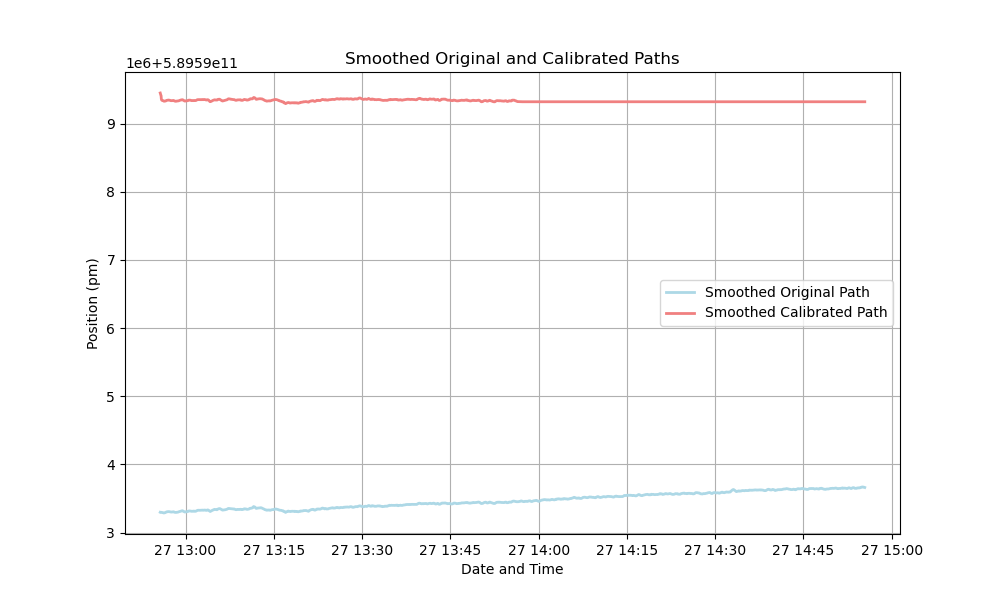

In [85]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) # hpa to kpa: 1hpa = 0.1kpa

def plot_smoothed_paths(date_time, smoothed_original_path, smoothed_calibrated_path, label_smoothed_original="Smoothed Original Path", label_smoothed_calibrated="Smoothed Calibrated Path"):
    plt.figure(figsize=(10, 6))

    plt.plot(date_time, smoothed_original_path, label=label_smoothed_original, linestyle='-', linewidth=2, color='lightblue')
    plt.plot(date_time, smoothed_calibrated_path, label=label_smoothed_calibrated, linestyle='-', linewidth=2, color='lightcoral')

    plt.xlabel("Date and Time")
    plt.ylabel("Position (pm)")
    plt.legend()
    plt.title("Smoothed Original and Calibrated Paths")
    plt.grid(True)
    plt.show()

# Load data
position_data = load_data("pos_time_readings_exp3.csv")
environment_data = load_data('Environmental_Readings_Modified_exp3.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Extract the data for the specified time range (from 12:56 to 1:56)
start_time = pd.to_datetime("2023-11-27 12:55:41.038", format="%Y-%m-%d %H:%M:%S")
end_time = pd.to_datetime("2023-11-27 14:55:25.363", format="%Y-%m-%d %H:%M:%S")

selected_range = (date_time_interpolated >= start_time) & (date_time_interpolated <= end_time)
date_time_selected = date_time_interpolated[selected_range]
smoothed_original_path_selected = position_pm_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]
smoothed_calibrated_path_selected = calibrated_path_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]

# Plot only the smoothed original and calibrated paths for the specified time range
plot_smoothed_paths(date_time_selected, smoothed_original_path_selected, smoothed_calibrated_path_selected)


<IPython.core.display.Javascript object>


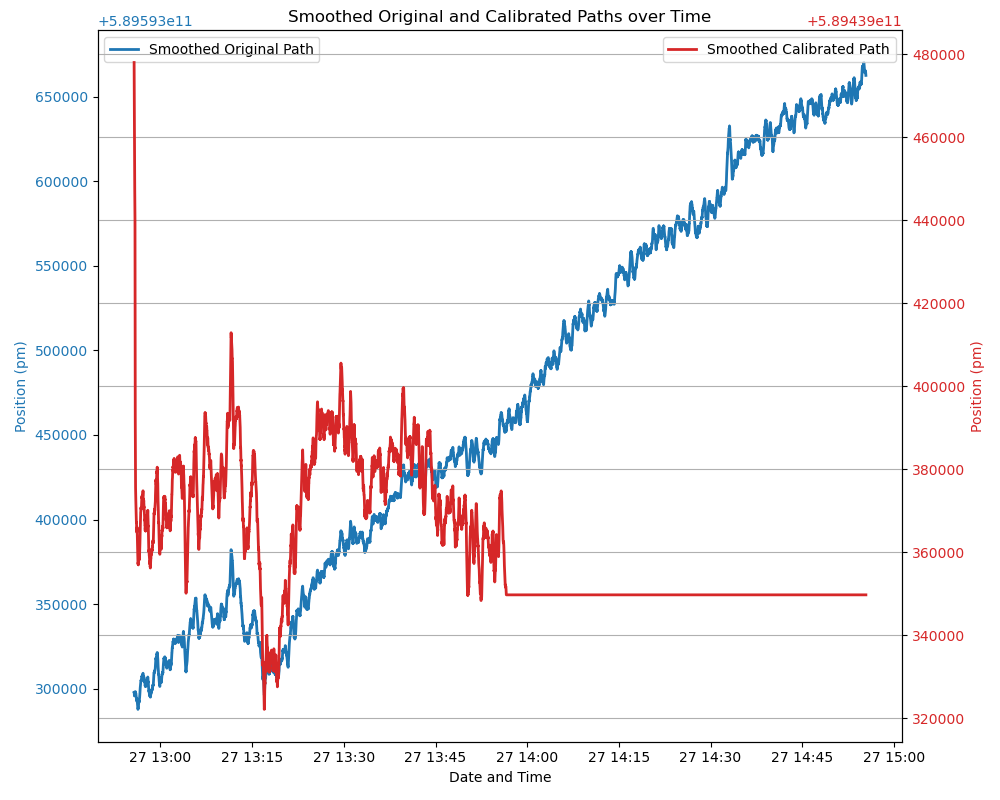

In [86]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) # hpa to kpa: 1hpa = 0.1kpa

def plot_smoothed_paths_twin_axes(date_time, smoothed_original_path, smoothed_calibrated_path, label_original="Smoothed Original Path", label_calibrated="Smoothed Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(10, 8))

    color = 'tab:blue'
    ax1.set_xlabel("Date and Time")
    ax1.set_ylabel("Position (pm)", color=color)
    ax1.plot(date_time, smoothed_original_path, label=label_original, linestyle='-', linewidth=2, color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel("Position (pm)", color=color)
    ax2.plot(date_time, smoothed_calibrated_path, label=label_calibrated, linestyle='-', linewidth=2, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right')

    fig.tight_layout()
    plt.title("Smoothed Original and Calibrated Paths over Time")
    plt.grid(True)
    plt.show()

# Load data
position_data = load_data("pos_time_readings_exp3.csv")
environment_data = load_data('Environmental_Readings_Modified_exp3.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Extract the data for the specified time range (from 12:56 to 1:56)
start_time = pd.to_datetime("2023-11-27 12:55:41.038", format="%Y-%m-%d %H:%M:%S")
end_time = pd.to_datetime("2023-11-27 14:55:25.363", format="%Y-%m-%d %H:%M:%S")

selected_range = (date_time_interpolated >= start_time) & (date_time_interpolated <= end_time)
date_time_selected = date_time_interpolated[selected_range]
smoothed_original_path_selected = position_pm_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]
smoothed_calibrated_path_selected = calibrated_path_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]

# Plot smoothed original and calibrated paths with twin axes for the specified time range
plot_smoothed_paths_twin_axes(date_time_selected, smoothed_original_path_selected, smoothed_calibrated_path_selected)


<IPython.core.display.Javascript object>


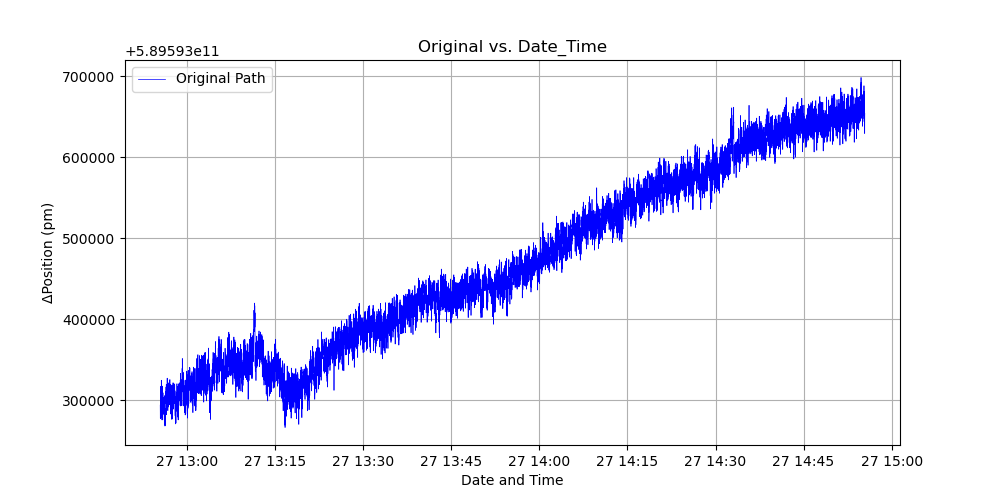

<IPython.core.display.Javascript object>


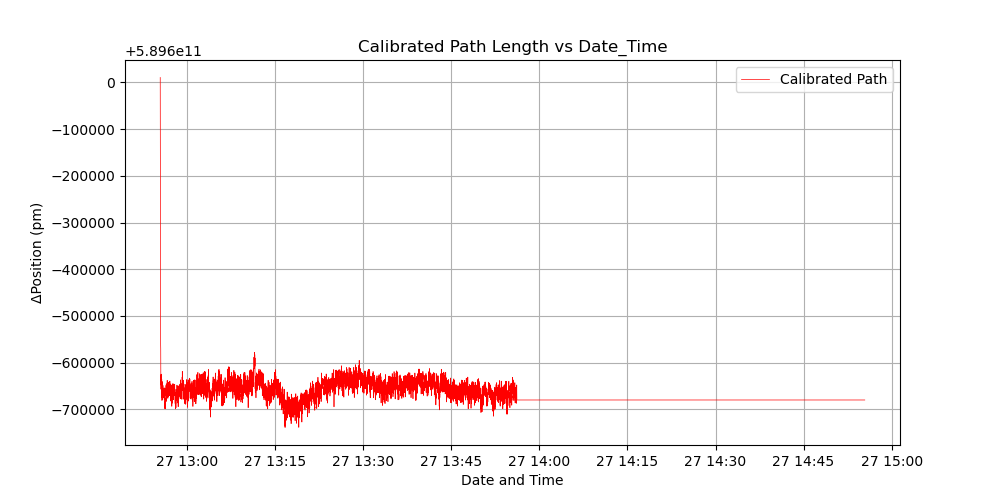

<IPython.core.display.Javascript object>


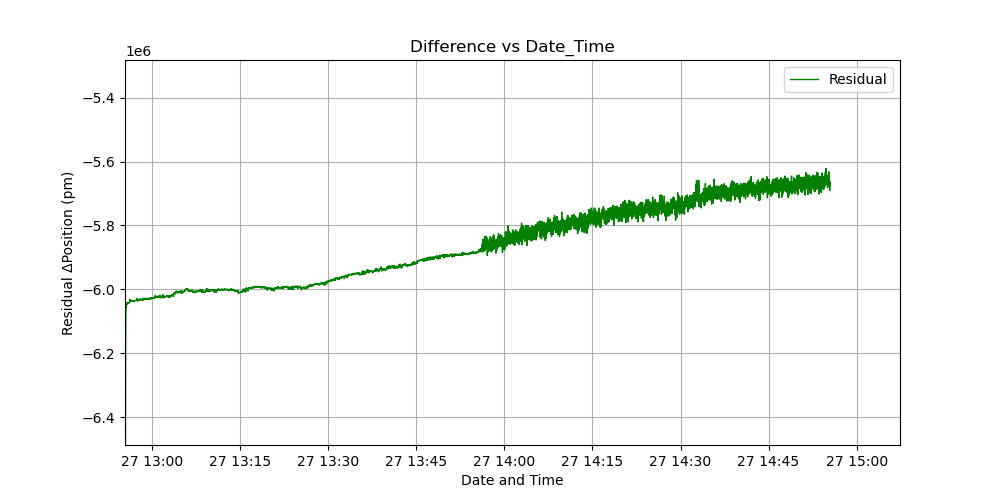

In [124]:
# Plot original and calibrated paths overlapped
plt.figure(figsize=(10, 5))
plt.plot(date_time_interpolated, position_pm_interpolated, label="Original Path", linestyle='-', linewidth=0.5, color='blue')
# plt.plot(date_time_interpolated, calibrated_path_interpolated, label="Calibrated Path", linestyle='-', linewidth=1, color='red')
plt.xlabel("Date and Time")
plt.ylabel("ΔPosition (pm)")
plt.title("Original vs. Date_Time")
plt.legend()
plt.grid(True)
plt.show()

# Plot original and calibrated paths overlapped
plt.figure(figsize=(10, 5))
# plt.plot(date_time_interpolated, position_pm_interpolated, label="Original Path", linestyle='-', linewidth=1, color='blue')
plt.plot(date_time_interpolated, calibrated_path_interpolated, label="Calibrated Path", linestyle='-', linewidth=0.5, color='red')
plt.xlabel("Date and Time")
plt.ylabel("ΔPosition (pm)")
plt.title("Calibrated Path Length vs Date_Time")
plt.legend()
plt.grid(True)
plt.show()

# Plot actual path and difference in the same plot
difference_interpolated = position_pm_interpolated - calibrated_path_interpolated
plt.figure(figsize=(10, 5))
# plt.plot(date_time_interpolated, position_pm_interpolated, label="Actual Path", linestyle='-', linewidth=1, color='blue')
plt.plot(date_time_interpolated, difference_interpolated, label="Residual", linestyle='-', linewidth=1, color='green')
plt.xlabel("Date and Time")
plt.ylabel("Residual ΔPosition (pm)")
plt.title("Difference vs Date_Time")
plt.legend()
plt.grid(True)
plt.show()


# Experiment 6: Using Double slip mm/μm

### Environmental Parameters plot

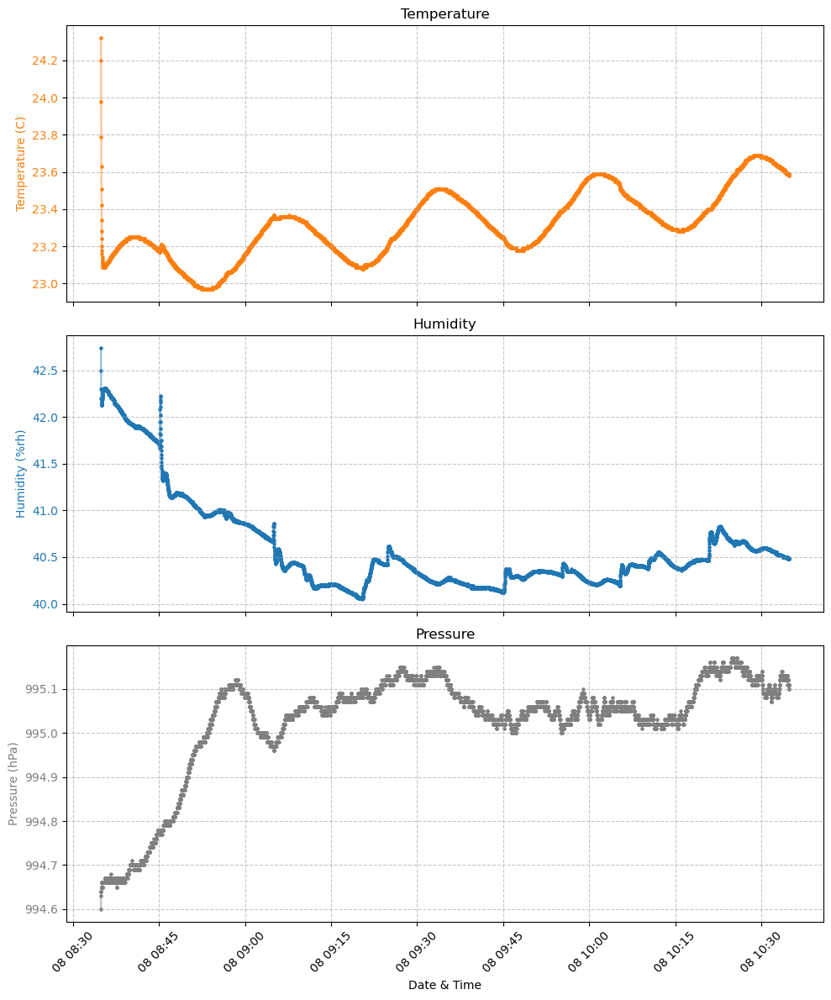

In [42]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file into a pandas DataFrame
df = pd.read_csv('Environmental_Readings_slid_experiment_Modified.csv', parse_dates=[['Date', 'Time']], dayfirst=True)

# Create subplots with shared x-axis
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)

# Plot Temperature on the first subplot
ax1.set_ylabel('Temperature (C)', color='tab:orange')
ax1.scatter(df['Date_Time'], df['Temperature(C)'], color='tab:orange', label='Temperature', s=5)
ax1.plot(df['Date_Time'], df['Temperature(C)'], linestyle='-', color='tab:orange', alpha=0.5)
ax1.tick_params(axis='y', labelcolor='tab:orange')
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.tick_params(axis='x', labelrotation=45)
ax1.set_title('Temperature')

# Plot Humidity on the second subplot
ax2.set_ylabel('Humidity (%rh)', color='tab:blue')
ax2.scatter(df['Date_Time'], df['Humidity(%rh)'], color='tab:blue', label='Humidity', s=5)
ax2.plot(df['Date_Time'], df['Humidity(%rh)'], linestyle='-', color='tab:blue', alpha=0.5)
ax2.tick_params(axis='y', labelcolor='tab:blue')
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.tick_params(axis='x', labelrotation=45)
ax2.set_title('Humidity')

# Plot Pressure on the third subplot
ax3.set_xlabel('Date & Time')
ax3.set_ylabel('Pressure (hPa)', color='tab:grey')
ax3.scatter(df['Date_Time'], df['Pressure(hPa)'], color='tab:grey', label='Pressure', s=5)
ax3.plot(df['Date_Time'], df['Pressure(hPa)'], linestyle='-', color='tab:grey', alpha=0.5)
ax3.tick_params(axis='y', labelcolor='tab:grey')
ax3.grid(True, linestyle='--', alpha=0.7)
ax3.tick_params(axis='x', labelrotation=45)
ax3.set_title('Pressure')

# Adjust layout to prevent clipping of labels
plt.tight_layout()

# Show the plot
plt.show()


### Position Plot along with smooth data

<IPython.core.display.Javascript object>


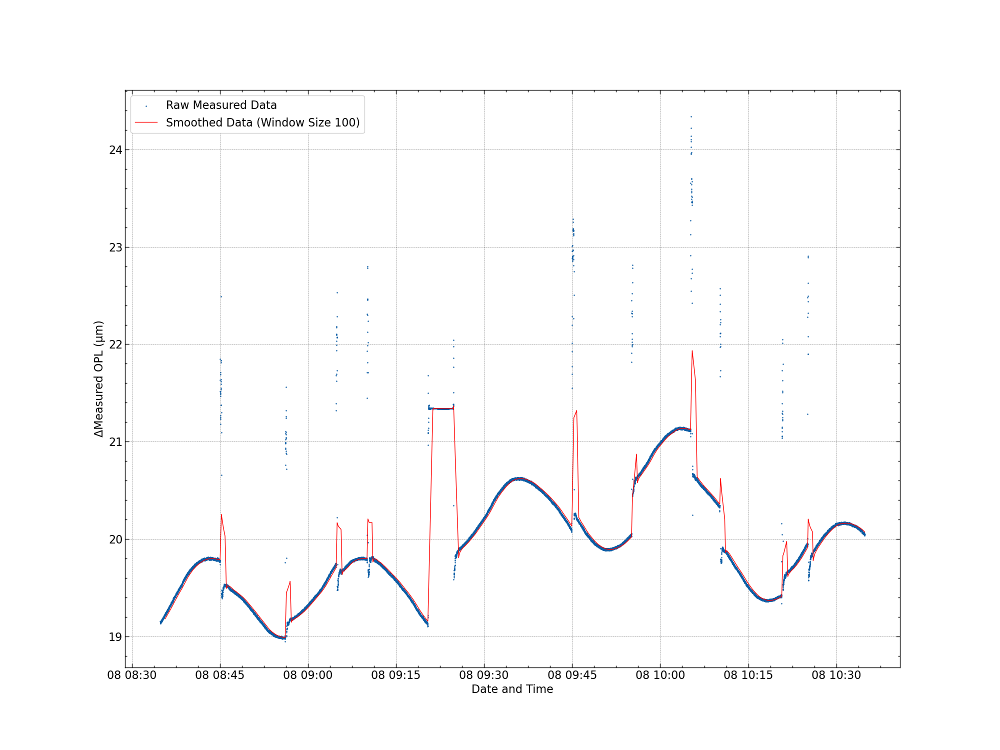

In [27]:

import pandas as pd
import matplotlib.pyplot as plt

# Load data from the CSV file
data = pd.read_csv("pos_time_readings_slid_experiment.csv")

# Extract Date, Time, and Position columns
date_time = data["Date"] + " " + data["Time"]
position_cm = data["Position (cm)"]

# Convert position to nanometers
position_pm = position_cm * 1e10  # 1 cm = 1e10 pm

# Convert date and time to datetime objects
date_time = pd.to_datetime(date_time, format="%Y-%m-%d %H:%M:%S")

# Apply moving average filters with different window sizes
window_size1 = 20  # Adjust the window size as needed
window_size2 = 100
position_smoothed1 = position_pm.rolling(window=window_size1).mean()
position_smoothed2 = position_pm.rolling(window=window_size2).mean()

# Create subplots
fig, ( ax2) = plt.subplots(1, 1, figsize=(20, 15), sharex=True)

# # Plot for the first window size
# ax1.scatter(date_time, position_pm, marker='.', s=5, label="Raw Data")  # Original data
# ax1.plot(date_time, position_smoothed1, label=f"Smoothed Data (Window Size {window_size1})", linestyle='-', linewidth=1, color='red')
# ax1.set_ylabel("Position (nm)")
# ax1.set_title(f"Position vs. Time")
# ax1.legend()
# ax1.grid(True)

# Plot for the second window size
ax2.scatter(date_time, (position_pm - 5.896e11)/1e6, marker='.', s=3, label="Raw Measured Data")  # Original data
ax2.plot(date_time, (position_smoothed2-5.896e11)/1e6, label=f"Smoothed Data (Window Size {window_size2})", linestyle='-', linewidth=1, color='red')
ax2.set_xlabel("Date and Time")
ax2.set_ylabel("ΔMeasured OPL (μm)")
# ax2.set_title(f"Position vs. Time with Moving Average Smoothing (Window Size {window_size2})")
ax2.legend()
ax2.grid(True)

# # Plot for the Third window size
# # ax3.scatter(date_time, position_pm, marker='.', s=3, label="Raw Data")  # Original data
# ax3.plot(date_time, position_smoothed2, label=f"Smoothed Data (Window Size {window_size2})", linestyle='-', linewidth=1, color='red')
# ax3.set_xlabel("Date and Time")
# ax3.set_ylabel("Position (nm)")
# ax3.set_title(f"Position vs. Time(extracted) with Moving Average Smoothing (Window Size {window_size2})")
# ax3.legend()
# ax3.grid(True)

# Save the plot as an image
plt.savefig("smoothed_subplot_slid.png")

# Display the plot in a separate window in Jupyter Notebook
plt.show()


### Calibration result

<IPython.core.display.Javascript object>


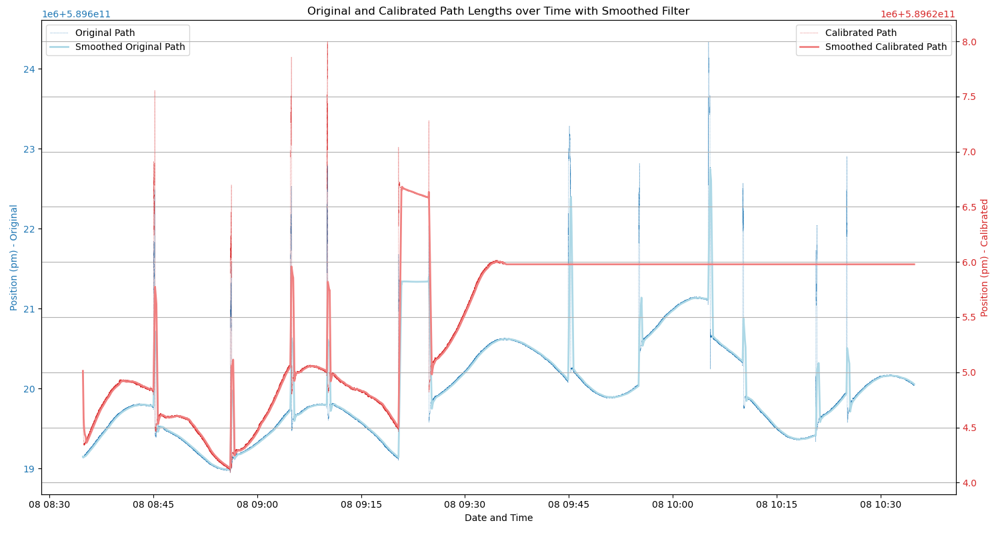

<IPython.core.display.Javascript object>


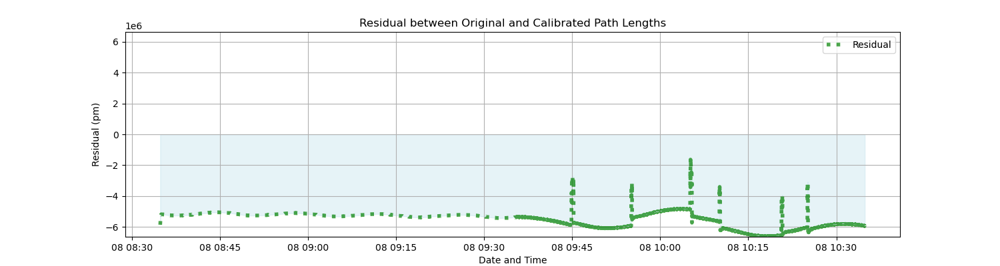

In [125]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) #hpa to kpa: 1hpa = 0.1kpa

def calculate_calibrated_path(original_path, refractive_index_standard, refractive_index_air):
    return original_path * refractive_index_standard / refractive_index_air

def plot_paths_with_twin_axes(date_time, original_path, calibrated_path, label_original="Original Path", label_calibrated="Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(15, 8))

    color = 'tab:blue'
    ax1.set_xlabel("Date and Time")
    ax1.set_ylabel("Position (pm) - Original", color=color)
    ax1.plot(date_time, original_path, label=label_original, linestyle='dotted', linewidth=0.5, color=color)
    ax1.plot(date_time, original_path.rolling(window=50, min_periods=1).mean(), label='Smoothed Original Path', linestyle='-', linewidth=2, color='lightblue')  # Adjust the window size as needed
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel("Position (pm) - Calibrated", color=color)
    ax2.plot(date_time, calibrated_path, label=label_calibrated, linestyle='dotted', linewidth=0.5, color=color)
    ax2.plot(date_time, calibrated_path.rolling(window=50, min_periods=1).mean(), label='Smoothed Calibrated Path', linestyle='-', linewidth=2, color='lightcoral')  # Adjust the window size as needed
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right')

    fig.tight_layout()
    plt.title("Original and Calibrated Path Lengths over Time with Smoothed Filter")
    plt.grid(True)
    plt.show()
    plt.savefig('Experiment_6_Path_analysis_result.jpg')

def plot_residual(date_time, residual, label="Residual"):
    plt.figure(figsize=(15, 4))
    plt.plot(date_time, residual, label=label, linestyle='dotted', linewidth=4, color='green', alpha=0.7)
    
    # Calculate the maximum absolute value in the residual
    max_abs_residual = max(abs(residual))
    
    # Set y-axis limits symmetrically around 0
    plt.ylim([-max_abs_residual, max_abs_residual])
    
    plt.fill_between(date_time, 0, residual, where=(residual > 0), interpolate=True, color='lightcoral', alpha=0.3)
    plt.fill_between(date_time, 0, residual, where=(residual < 0), interpolate=True, color='lightblue', alpha=0.3)
    
    plt.xlabel("Date and Time")
    plt.ylabel("Residual (pm)")
    plt.title("Residual between Original and Calibrated Path Lengths")
    plt.legend()
    plt.grid(True)
    plt.savefig('Experiment_6_Residual_analysis_result.jpg')  # Save the figure
    plt.show()

# Load data
position_data = load_data("pos_time_readings_slid_experiment.csv")
environment_data = load_data('Environmental_Readings_slid_experiment_Modified.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Calculate the residual between actual and calibrated paths
residual_interpolated = position_pm_interpolated - calibrated_path_interpolated

# Plot original and calibrated paths with twin axes and smoothed filter
plot_paths_with_twin_axes(date_time_interpolated, position_pm_interpolated, calibrated_path_interpolated)

# Plot the residual between original and calibrated paths
plot_residual(date_time_interpolated, residual_interpolated)


C:\Users\biswa\AppData\Local\Temp\ipykernel_25008\2636457577.py:11: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  environment_data = pd.read_csv('Environmental_Readings_slid_experiment_Modified.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)


Time Constant (tau) of Refractive Index over Time: 1.0 seconds
Average Refractive Index: 1.0002624997123353
Difference of calculated RI from Refractive Index (Standard Air): 8.894087664801376e-06


C:\Users\biswa\anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


<IPython.core.display.Javascript object>


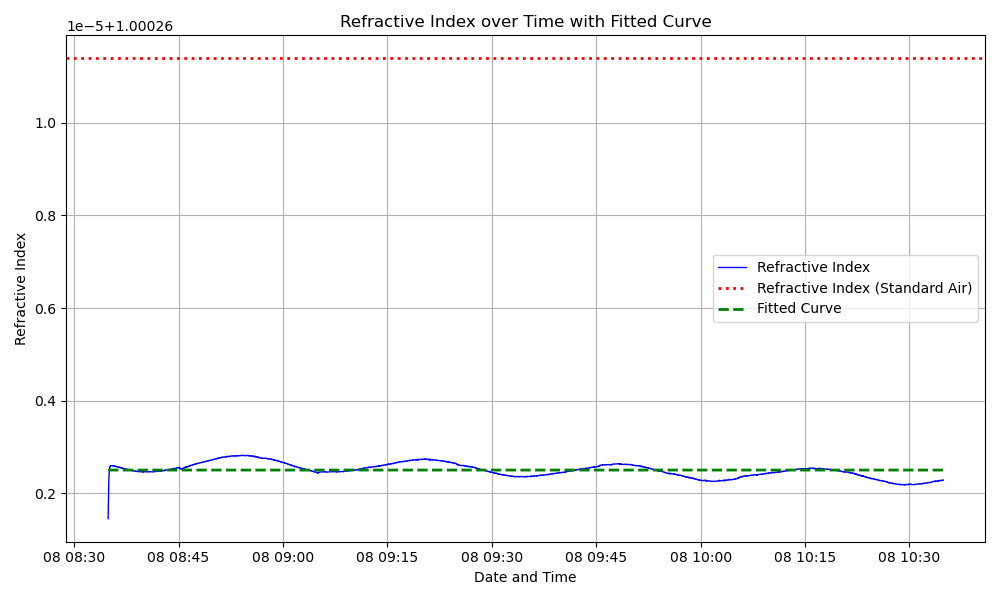

In [126]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit
from datetime import datetime

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160))  # hPa to kPa: 1 hPa = 0.1 kPa

# Load data
environment_data = pd.read_csv('Environmental_Readings_slid_experiment_Modified.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)

# Set the start time
start_time = "17/11/2023 15:22:00.734"
start_time = datetime.strptime(start_time, "%d/%m/%Y %H:%M:%S.%f")

# Calculate refractive index using environmental data
refractive_index = calculate_refractive_index(environment_data['Pressure(hPa)'],
                                               environment_data['Temperature(C)'],
                                               environment_data['Humidity(%rh)'])

# Refractive index of standard air
refractive_index_standard = 1.0002713938

# Time constant calculation (fitting exponential decay model)
def exponential_decay_model(t, A, tau, C):
    return A * np.exp(-t / tau) + C

# Extract time and refractive index data
time_data = (environment_data['Date_Time'] - start_time).dt.total_seconds().values
refractive_index_data = refractive_index.values

# Fit the model to the data
popt, _ = curve_fit(exponential_decay_model, time_data, refractive_index_data)

# Extract time constant (tau) from the fitted parameters
time_constant = popt[1]
time_constant_unit = "seconds"

# Calculate average refractive index
average_refractive_index = np.mean(refractive_index_data)

# Subtract average refractive index from the refractive index of standard air
refractive_index_difference = np.abs(average_refractive_index - refractive_index_standard)

print("Time Constant (tau) of Refractive Index over Time:", time_constant, time_constant_unit)
print("Average Refractive Index:", average_refractive_index)
print("Difference of calculated RI from Refractive Index (Standard Air):", refractive_index_difference)

# Plot the fitted curve
fitted_curve = exponential_decay_model(time_data, *popt)

plt.figure(figsize=(10, 6))
plt.plot(environment_data['Date_Time'], refractive_index, label='Refractive Index', linestyle='-', linewidth=1, color='blue')
plt.axhline(y=refractive_index_standard, color='red', linestyle='dotted', linewidth=2, label='Refractive Index (Standard Air)')
plt.plot(environment_data['Date_Time'], fitted_curve, label='Fitted Curve', linestyle='--', linewidth=2, color='green')
plt.xlabel('Date and Time')
plt.ylabel('Refractive Index')
plt.title('Refractive Index over Time with Fitted Curve')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>


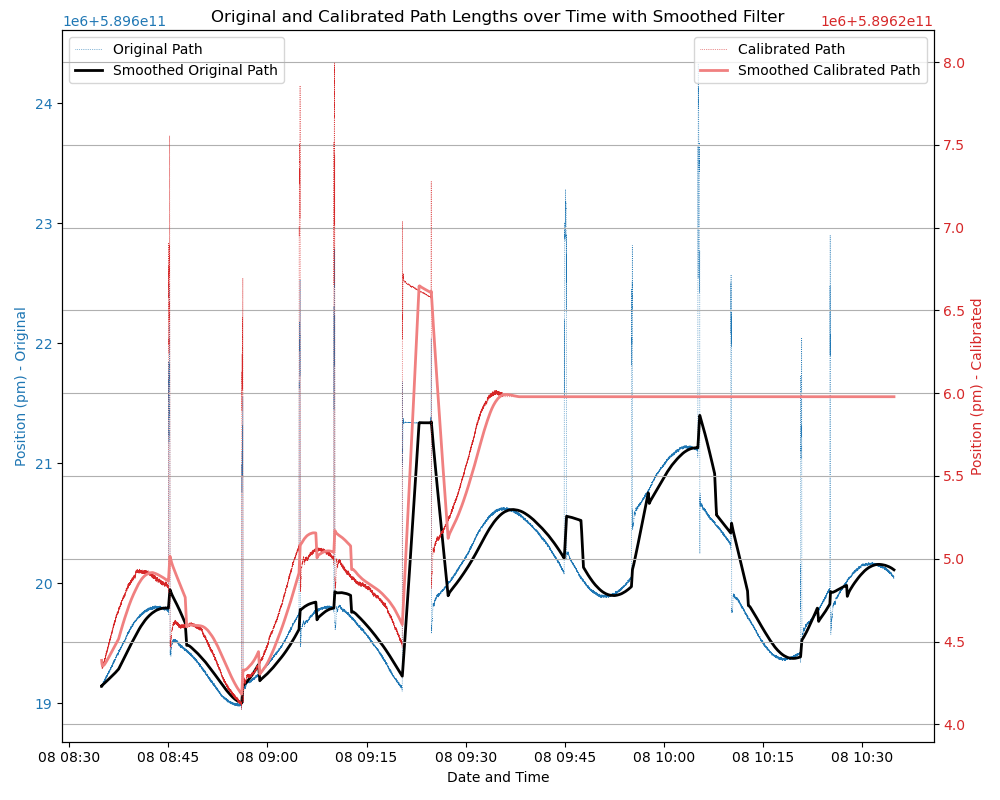

In [132]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) # hpa to kpa: 1hpa = 0.1kpa

def calculate_calibrated_path(original_path, refractive_index_standard, refractive_index_air):
    return original_path * refractive_index_standard / refractive_index_air

def plot_paths_with_twin_axes_smoothed(date_time, original_path, calibrated_path, label_original="Original Path", label_calibrated="Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(10, 8))

    color = 'tab:blue'
    ax1.set_xlabel("Date and Time")
    ax1.set_ylabel("Position (pm) - Original", color=color)
    ax1.plot(date_time, original_path, label=label_original, linestyle='dotted', linewidth=0.5, color=color)
    ax1.plot(date_time, original_path.rolling(window=300, min_periods=1).mean(), label='Smoothed Original Path', linestyle='-', linewidth=2, color='black')  # Adjust the window size as needed
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel("Position (pm) - Calibrated", color=color)
    ax2.plot(date_time, calibrated_path, label=label_calibrated, linestyle='dotted', linewidth=0.5, color=color)
    ax2.plot(date_time, calibrated_path.rolling(window=300, min_periods=1).mean(), label='Smoothed Calibrated Path', linestyle='-', linewidth=2, color='lightcoral')  # Adjust the window size as needed
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right')

    fig.tight_layout()
    plt.title("Original and Calibrated Path Lengths over Time with Smoothed Filter")
    plt.grid(True)
    plt.show()

# Load data
position_data = load_data("pos_time_readings_slid_experiment.csv")
environment_data = load_data('Environmental_Readings_slid_experiment_Modified.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Extract the data for the specified time range (from 12:56 to 1:56)
start_time = pd.to_datetime("2023-12-08 08:34:55.596", format="%Y-%m-%d %H:%M:%S")
end_time = pd.to_datetime("2023-12-08 10:34:45.969", format="%Y-%m-%d %H:%M:%S")

selected_range = (date_time_interpolated >= start_time) & (date_time_interpolated <= end_time)
date_time_selected = date_time_interpolated[selected_range]
position_pm_selected = position_pm_interpolated[selected_range]
calibrated_path_selected = calibrated_path_interpolated[selected_range]

# Plot original and calibrated paths with twin axes and smoothed filter for the specified time range
plot_paths_with_twin_axes_smoothed(date_time_selected, position_pm_selected, calibrated_path_selected)


<IPython.core.display.Javascript object>


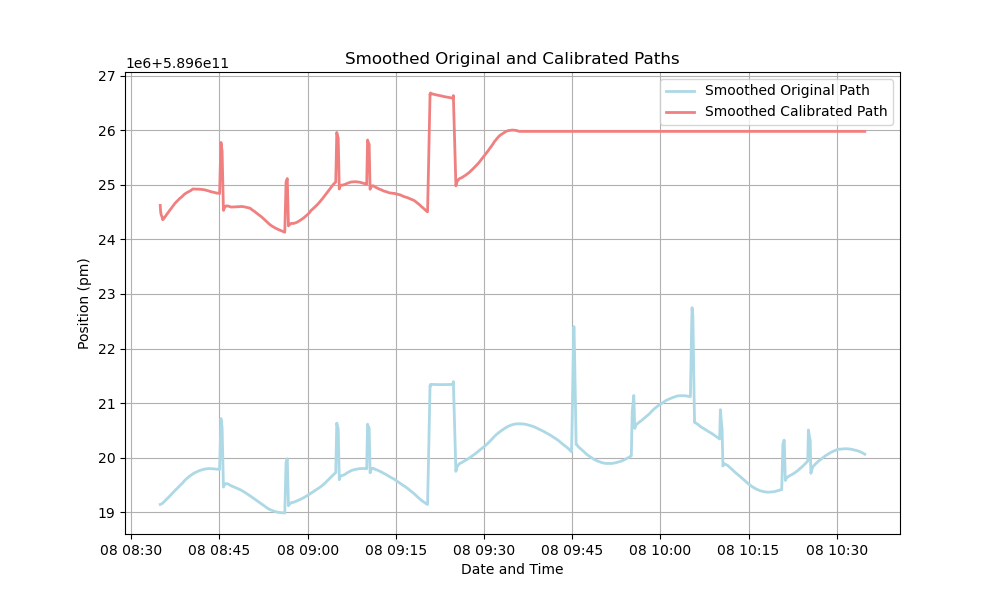

In [133]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) # hpa to kpa: 1hpa = 0.1kpa

def plot_smoothed_paths(date_time, smoothed_original_path, smoothed_calibrated_path, label_smoothed_original="Smoothed Original Path", label_smoothed_calibrated="Smoothed Calibrated Path"):
    plt.figure(figsize=(10, 6))

    plt.plot(date_time, smoothed_original_path, label=label_smoothed_original, linestyle='-', linewidth=2, color='lightblue')
    plt.plot(date_time, smoothed_calibrated_path, label=label_smoothed_calibrated, linestyle='-', linewidth=2, color='lightcoral')

    plt.xlabel("Date and Time")
    plt.ylabel("Position (pm)")
    plt.legend()
    plt.title("Smoothed Original and Calibrated Paths")
    plt.grid(True)
    plt.show()

# Load data
position_data = load_data("pos_time_readings_slid_experiment.csv")
environment_data = load_data('Environmental_Readings_slid_experiment_Modified.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Extract the data for the specified time range (from 12:56 to 1:56)
start_time = pd.to_datetime("2023-12-08 08:34:55.596", format="%Y-%m-%d %H:%M:%S")
end_time = pd.to_datetime("2023-12-08 10:34:45.969", format="%Y-%m-%d %H:%M:%S")

selected_range = (date_time_interpolated >= start_time) & (date_time_interpolated <= end_time)
date_time_selected = date_time_interpolated[selected_range]
smoothed_original_path_selected = position_pm_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]
smoothed_calibrated_path_selected = calibrated_path_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]

# Plot only the smoothed original and calibrated paths for the specified time range
plot_smoothed_paths(date_time_selected, smoothed_original_path_selected, smoothed_calibrated_path_selected)


<IPython.core.display.Javascript object>


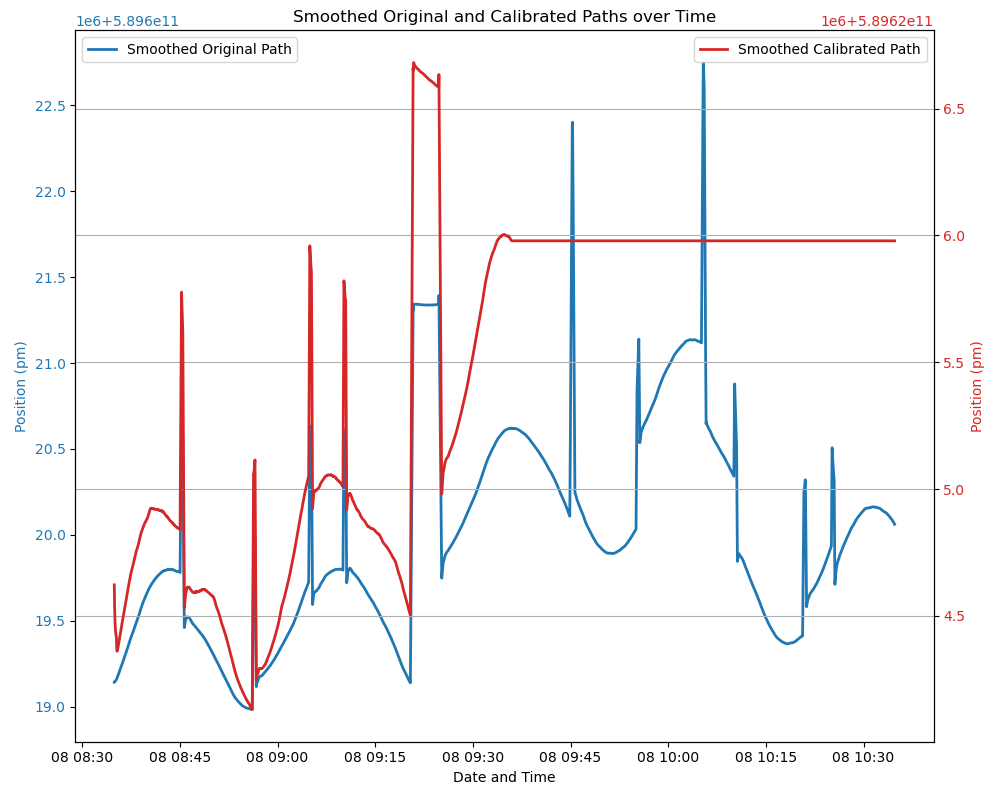

In [134]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) # hpa to kpa: 1hpa = 0.1kpa

def plot_smoothed_paths_twin_axes(date_time, smoothed_original_path, smoothed_calibrated_path, label_original="Smoothed Original Path", label_calibrated="Smoothed Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(10, 8))

    color = 'tab:blue'
    ax1.set_xlabel("Date and Time")
    ax1.set_ylabel("Position (pm)", color=color)
    ax1.plot(date_time, smoothed_original_path, label=label_original, linestyle='-', linewidth=2, color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel("Position (pm)", color=color)
    ax2.plot(date_time, smoothed_calibrated_path, label=label_calibrated, linestyle='-', linewidth=2, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right')

    fig.tight_layout()
    plt.title("Smoothed Original and Calibrated Paths over Time")
    plt.grid(True)
    plt.show()

# Load data
position_data = load_data("pos_time_readings_slid_experiment.csv")
environment_data = load_data('Environmental_Readings_slid_experiment_Modified.csv')


# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Extract the data for the specified time range (from 12:56 to 1:56)
start_time = pd.to_datetime("2023-12-08 08:34:55.596", format="%Y-%m-%d %H:%M:%S")
end_time = pd.to_datetime("2023-12-08 10:34:45.969", format="%Y-%m-%d %H:%M:%S")

selected_range = (date_time_interpolated >= start_time) & (date_time_interpolated <= end_time)
date_time_selected = date_time_interpolated[selected_range]
smoothed_original_path_selected = position_pm_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]
smoothed_calibrated_path_selected = calibrated_path_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]

# Plot smoothed original and calibrated paths with twin axes for the specified time range
plot_smoothed_paths_twin_axes(date_time_selected, smoothed_original_path_selected, smoothed_calibrated_path_selected)


<IPython.core.display.Javascript object>


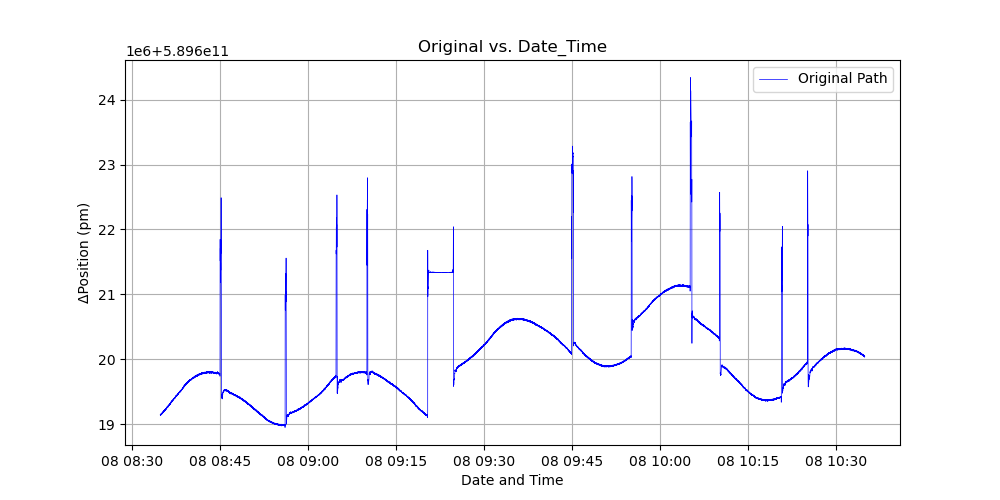

<IPython.core.display.Javascript object>


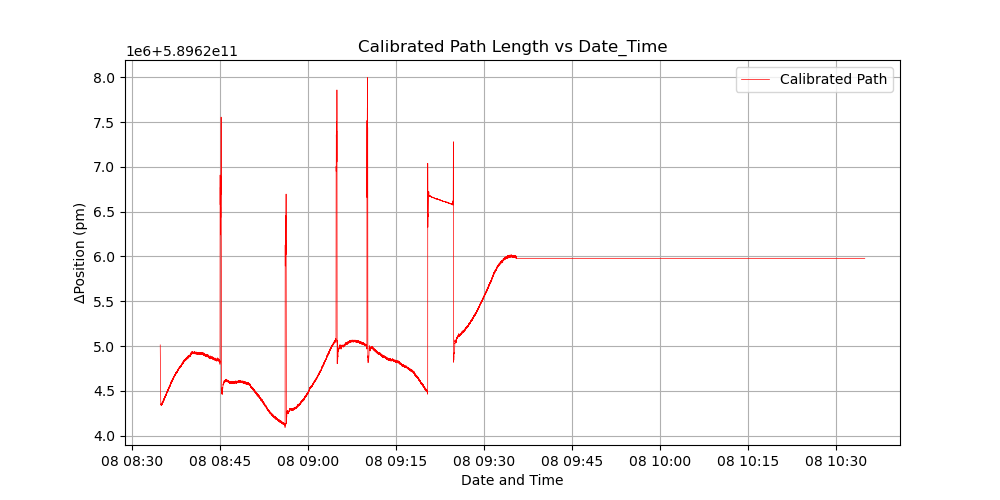

<IPython.core.display.Javascript object>


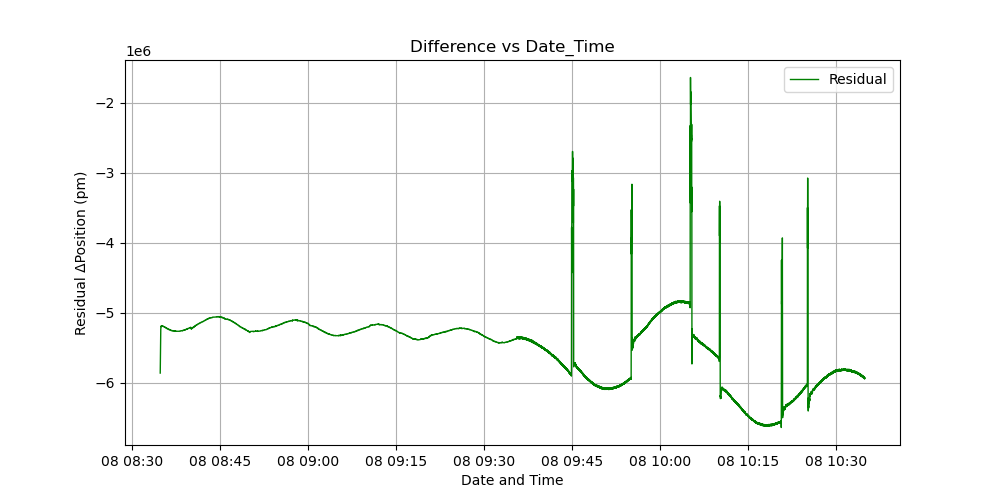

In [135]:
# Plot original and calibrated paths overlapped
plt.figure(figsize=(10, 5))
plt.plot(date_time_interpolated, position_pm_interpolated, label="Original Path", linestyle='-', linewidth=0.5, color='blue')
# plt.plot(date_time_interpolated, calibrated_path_interpolated, label="Calibrated Path", linestyle='-', linewidth=1, color='red')
plt.xlabel("Date and Time")
plt.ylabel("ΔPosition (pm)")
plt.title("Original vs. Date_Time")
plt.legend()
plt.grid(True)
plt.show()

# Plot original and calibrated paths overlapped
plt.figure(figsize=(10, 5))
# plt.plot(date_time_interpolated, position_pm_interpolated, label="Original Path", linestyle='-', linewidth=1, color='blue')
plt.plot(date_time_interpolated, calibrated_path_interpolated, label="Calibrated Path", linestyle='-', linewidth=0.5, color='red')
plt.xlabel("Date and Time")
plt.ylabel("ΔPosition (pm)")
plt.title("Calibrated Path Length vs Date_Time")
plt.legend()
plt.grid(True)
plt.show()

# Plot actual path and difference in the same plot
difference_interpolated = position_pm_interpolated - calibrated_path_interpolated
plt.figure(figsize=(10, 5))
# plt.plot(date_time_interpolated, position_pm_interpolated, label="Actual Path", linestyle='-', linewidth=1, color='blue')
plt.plot(date_time_interpolated, difference_interpolated, label="Residual", linestyle='-', linewidth=1, color='green')
plt.xlabel("Date and Time")
plt.ylabel("Residual ΔPosition (pm)")
plt.title("Difference vs Date_Time")
plt.legend()
plt.grid(True)
plt.show()


# Experiment 7(i): Before Christmas experiment -> IDS in outerbox

### Environmental Parameters plot

C:\Users\biswa\AppData\Local\Temp\ipykernel_25008\3017921685.py:5: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  df = pd.read_csv('Experiment_outer_18_12_23_IDS+BME680_environment_Modified.csv',parse_dates=[['Date', 'Time']],dayfirst=True,
b'Skipping line 75710: expected 5 fields, saw 6\n'


<IPython.core.display.Javascript object>


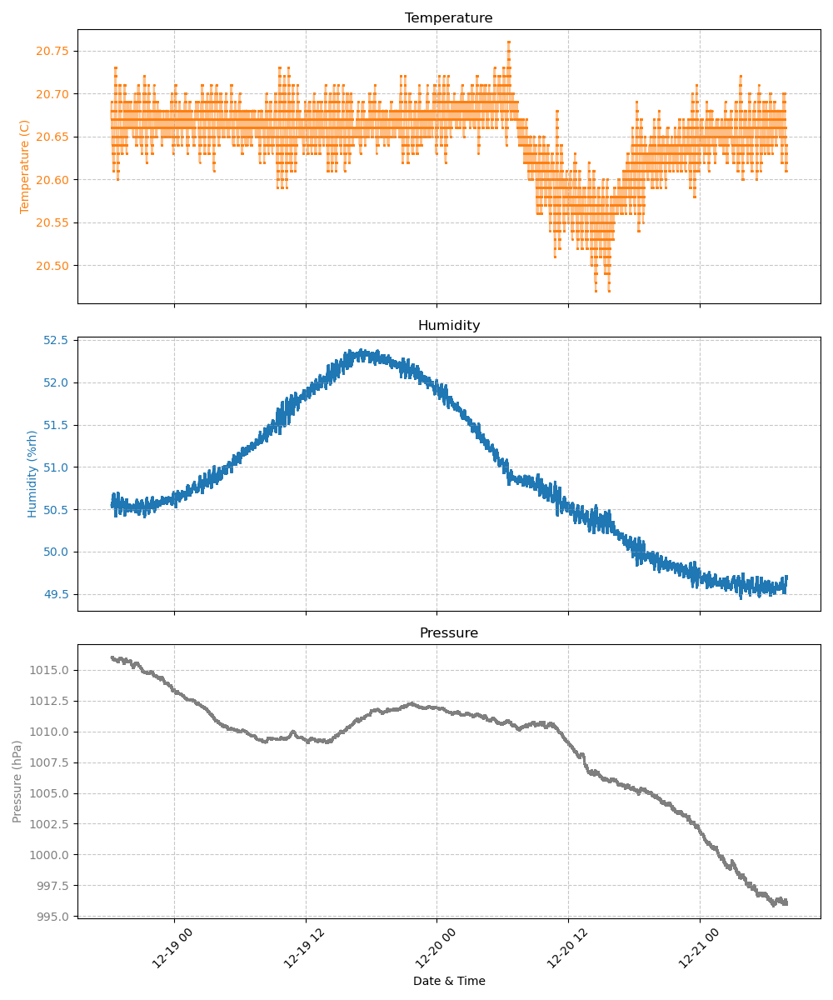

In [137]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file into a pandas DataFrame, skipping lines with errors
df = pd.read_csv('Experiment_outer_18_12_23_IDS+BME680_environment_Modified.csv',parse_dates=[['Date', 'Time']],dayfirst=True,
                 error_bad_lines=False)

# Set the desired start time
start_time = pd.to_datetime('18/12/2023 18:16:54.868', format='%d/%m/%Y %H:%M:%S.%f')

# Filter the DataFrame based on the start time
df = df[df['Date_Time'] >= start_time]

# Create subplots with shared x-axis
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)

# Plot Temperature on the first subplot
ax1.set_ylabel('Temperature (C)', color='tab:orange')
ax1.scatter(df['Date_Time'], df['Temperature(C)'], color='tab:orange', label='Temperature', s=1)
ax1.plot(df['Date_Time'], df['Temperature(C)'], linestyle='-', color='tab:orange', alpha=0.5)
ax1.tick_params(axis='y', labelcolor='tab:orange')
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.tick_params(axis='x', labelrotation=45)
ax1.set_title('Temperature')

# Plot Humidity on the second subplot
ax2.set_ylabel('Humidity (%rh)', color='tab:blue')
ax2.scatter(df['Date_Time'], df['Humidity(%rh)'], color='tab:blue', label='Humidity', s=1)
ax2.plot(df['Date_Time'], df['Humidity(%rh)'], linestyle='-', color='tab:blue', alpha=0.5)
ax2.tick_params(axis='y', labelcolor='tab:blue')
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.tick_params(axis='x', labelrotation=45)
ax2.set_title('Humidity')

# Plot Pressure on the third subplot
ax3.set_xlabel('Date & Time')
ax3.set_ylabel('Pressure (hPa)', color='tab:grey')
ax3.scatter(df['Date_Time'], df['Pressure(hPa)'], color='tab:grey', label='Pressure', s=1)
ax3.plot(df['Date_Time'], df['Pressure(hPa)'], linestyle='-', color='tab:grey', alpha=0.5)
ax3.tick_params(axis='y', labelcolor='tab:grey')
ax3.grid(True, linestyle='--', alpha=0.7)
ax3.tick_params(axis='x', labelrotation=45)
ax3.set_title('Pressure')

# Adjust layout to prevent clipping of labels
plt.tight_layout()

# Show the plot
plt.show()


### Position Plot along with smooth data

<IPython.core.display.Javascript object>


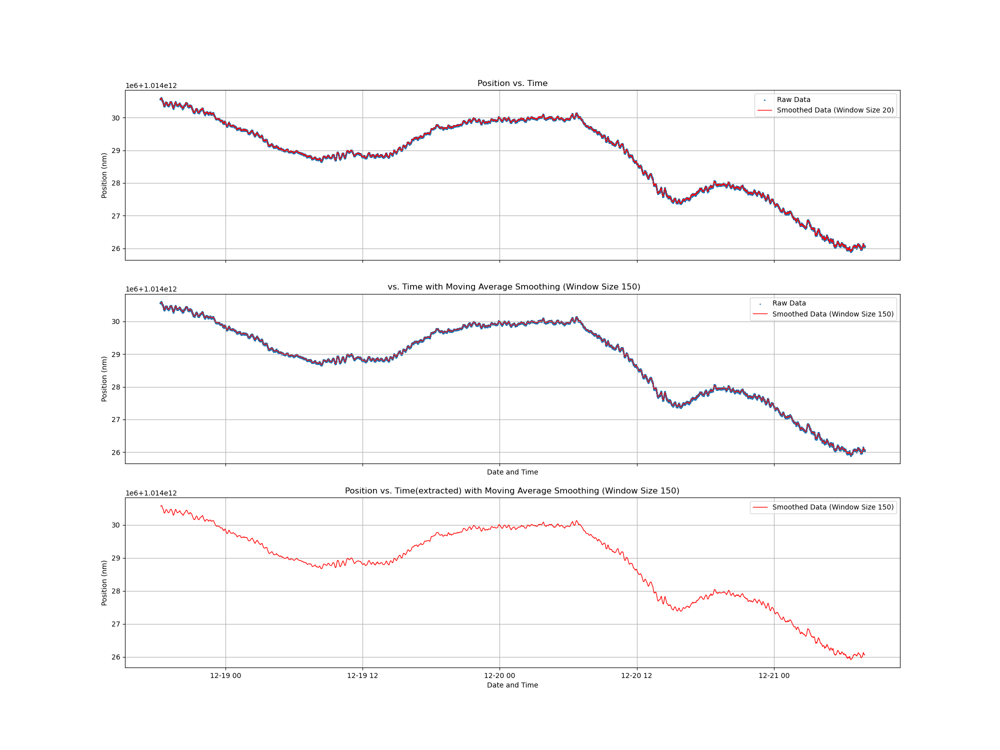

In [139]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data from the CSV file
data = pd.read_csv("Experiment_outer_18_12_23_IDS+BME680_position.csv")

# Convert "Date" and "Time" columns to a combined datetime column
data['Date_Time'] = pd.to_datetime(data["Date"] + " " + data["Time"], format="%Y-%m-%d %H:%M:%S.%f")

# Set the start time
start_time = pd.to_datetime("18/12/2023 18:16:54.868", format="%d/%m/%Y %H:%M:%S.%f")

# Filter data based on the start time
data = data[data['Date_Time'] >= start_time]

# Extract Date, Time, and Position columns
date_time = data["Date_Time"]
position_cm = data["Position (cm)"]

# Convert position to nanometers
position_pm = position_cm * 1e10  # 1 cm = 1e10 pm

# Apply moving average filters with different window sizes
window_size1 = 20  # Adjust the window size as needed
window_size2 = 150
position_smoothed1 = position_pm.rolling(window=window_size1).mean()
position_smoothed2 = position_pm.rolling(window=window_size2).mean()

# Create subplots
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(20, 15), sharex=True)

# Plot for the first window size
ax1.scatter(date_time, position_pm, marker='.', s=5, label="Raw Data")  # Original data
ax1.plot(date_time, position_smoothed1, label=f"Smoothed Data (Window Size {window_size1})", linestyle='-', linewidth=1, color='red')
ax1.set_ylabel("Position (nm)")
ax1.set_title(f"Position vs. Time")
ax1.legend()
ax1.grid(True)

# Plot for the second window size
ax2.scatter(date_time, position_pm, marker='.', s=3, label="Raw Data")  # Original data
ax2.plot(date_time, position_smoothed2, label=f"Smoothed Data (Window Size {window_size2})", linestyle='-', linewidth=1, color='red')
ax2.set_xlabel("Date and Time")
ax2.set_ylabel("Position (nm)")
ax2.set_title(f" vs. Time with Moving Average Smoothing (Window Size {window_size2})")
ax2.legend()
ax2.grid(True)

# Plot for the Third window size
# ax3.scatter(date_time, position_pm, marker='.', s=3, label="Raw Data")  # Original data
ax3.plot(date_time, position_smoothed2, label=f"Smoothed Data (Window Size {window_size2})", linestyle='-', linewidth=1, color='red')
ax3.set_xlabel("Date and Time")
ax3.set_ylabel("Position (nm)")
ax3.set_title(f"Position vs. Time(extracted) with Moving Average Smoothing (Window Size {window_size2})")
ax3.legend()
ax3.grid(True)

# Save the plot as an image
# plt.savefig("smoothed_subplot_slid.png")

# Display the plot in a separate window in Jupyter Notebook
plt.show()


Work in progress: Tkinter Version

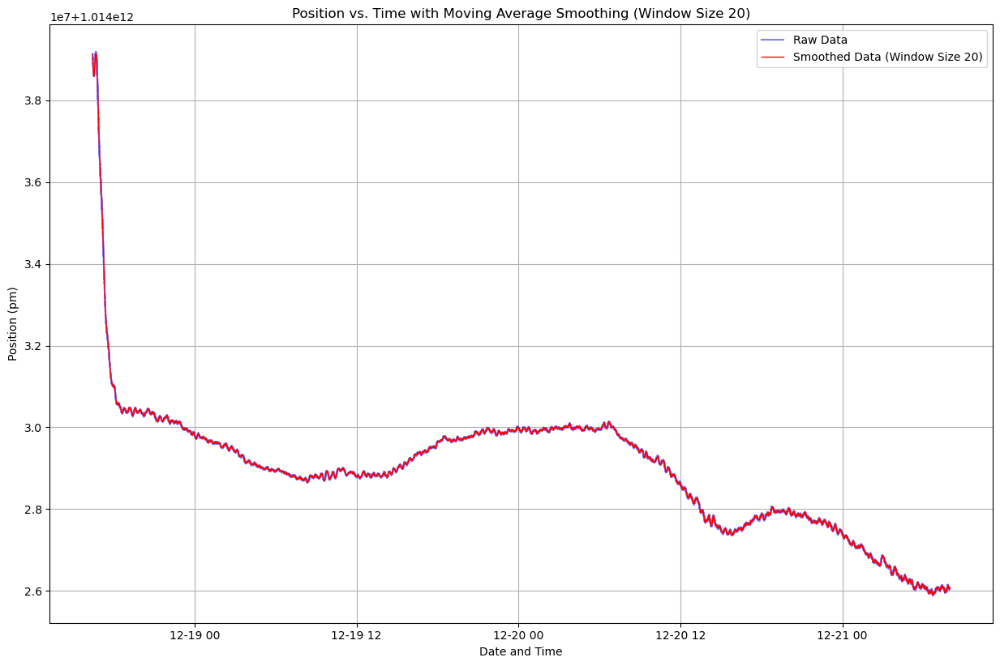

In [23]:
import tkinter as tk
from tkinter import ttk
from matplotlib.figure import Figure
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg, NavigationToolbar2Tk
import pandas as pd
import matplotlib.pyplot as plt

# Function to update the plot with selected window size
def update_plot():
    window_size = int(window_size_var.get())
    position_smoothed = position_pm.rolling(window=window_size).mean()

    ax.clear()
    if display_mode.get() == "plot":
        ax.plot(date_time, position_pm, label="Raw Data", linestyle='-', color='blue', alpha=0.5)
    elif display_mode.get() == "scatter":
        ax.scatter(date_time, position_pm, label="Raw Data", marker='.', s=5, color='blue', alpha=0.5)

    ax.plot(date_time, position_smoothed, label=f"Smoothed Data (Window Size {window_size})", linestyle='-', linewidth=1, color='red')
    ax.set_xlabel("Date and Time")
    ax.set_ylabel("Position (pm)")
    ax.set_title(f"Position vs. Time with Moving Average Smoothing (Window Size {window_size})")
    ax.legend()
    ax.grid(True)

    # Draw the updated plot on the canvas
    canvas.draw()

# Function to toggle zoom mode
def toggle_zoom_mode():
    if toolbar.mode == "":
        toolbar.zoom()

# Function to toggle pan mode
def toggle_pan_mode():
    if toolbar.mode == "":
        toolbar.pan()

# Function to toggle display mode (plot/scatter)
def toggle_display_mode():
    update_plot()

# Function to toggle raw data display (plot/scatter)
def toggle_raw_data_display():
    update_plot()

# Load data from the CSV file
data = pd.read_csv("Experiment_outer_18_12_23_IDS+BME680_position.csv")

# Extract Date, Time, and Position columns
date_time = pd.to_datetime(data["Date"] + " " + data["Time"], format="%Y-%m-%d %H:%M:%S")
position_cm = data["Position (cm)"]
position_pm = position_cm * 1e10  # Convert position to nanometers

# Create the main Tkinter window
root = tk.Tk()
root.title("Smoothed Position vs. Time")

# Create a frame using pack
frame = ttk.Frame(root)
frame.pack(expand=True, fill='both')

# Create a Matplotlib figure and axes
fig, ax = plt.subplots(figsize=(15, 10))
canvas = FigureCanvasTkAgg(fig, master=frame)
canvas_widget = canvas.get_tk_widget()

# Create a Navigation Toolbar
toolbar = NavigationToolbar2Tk(canvas, frame)
toolbar.update()

# Create a Combobox to select the window size
window_size_var = tk.StringVar()
window_size_var.set("0")  # Initial window size
window_size_label = ttk.Label(frame, text="Select Window Size:")
window_size_combobox = ttk.Combobox(frame, textvariable=window_size_var, values=["0", "5", "10", "20", "50", "100", "150"])
window_size_combobox.bind("<<ComboboxSelected>>", lambda event: update_plot())

# Create buttons to toggle zoom and pan modes
zoom_button = ttk.Button(frame, text="Toggle Zoom", command=toggle_zoom_mode)
pan_button = ttk.Button(frame, text="Toggle Pan", command=toggle_pan_mode)

# Create a Combobox to select the display mode (plot/scatter)
display_mode = tk.StringVar()
display_mode.set("plot")  # Initial display mode
display_mode_label = ttk.Label(frame, text="Select Display Mode:")
display_mode_combobox = ttk.Combobox(frame, textvariable=display_mode, values=["plot", "scatter"])
display_mode_combobox.bind("<<ComboboxSelected>>", lambda event: toggle_display_mode())

# Create a button to toggle raw data display (plot/scatter)
raw_data_display_button = ttk.Button(frame, text="Toggle Raw Data Display", command=toggle_raw_data_display)

# Place widgets in the frame using pack
window_size_label.pack(pady=5)
window_size_combobox.pack(pady=5)
canvas_widget.pack(expand=True, fill='both')
toolbar.pack()
zoom_button.pack(pady=5)
pan_button.pack(pady=5)
display_mode_label.pack(pady=5)
display_mode_combobox.pack(pady=5)
raw_data_display_button.pack(pady=5)

# Initial plot
update_plot()

# Start the Tkinter event loop
root.mainloop()


### Calibration result

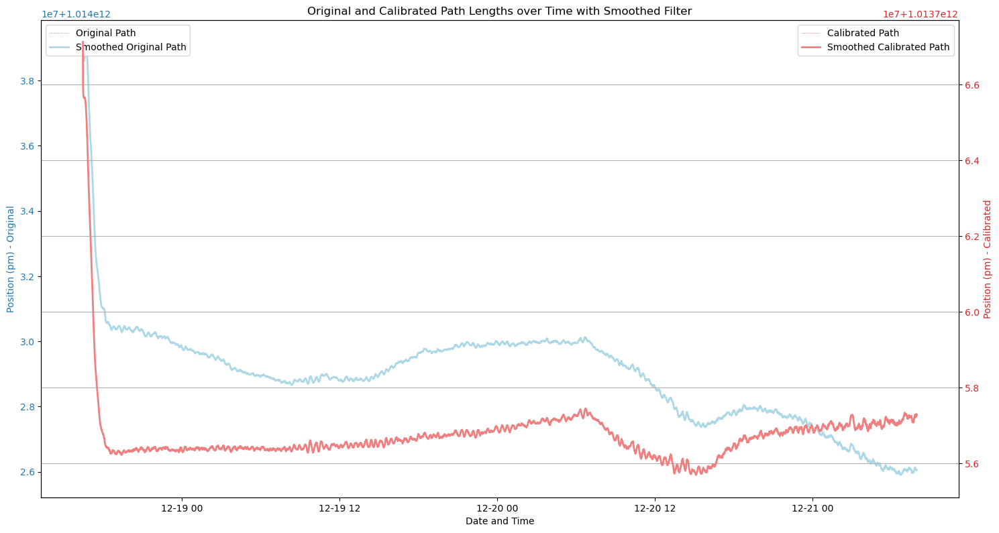

<Figure size 640x480 with 0 Axes>

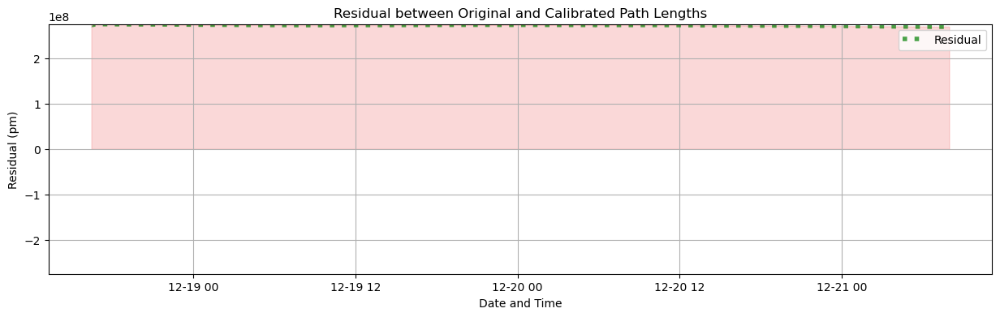

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) #hpa to kpa: 1hpa = 0.1kpa

def calculate_calibrated_path(original_path, refractive_index_standard, refractive_index_air):
    return original_path * refractive_index_standard / refractive_index_air

def plot_paths_with_twin_axes(date_time, original_path, calibrated_path, label_original="Original Path", label_calibrated="Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(15, 8))

    color = 'tab:blue'
    ax1.set_xlabel("Date and Time")
    ax1.set_ylabel("Position (pm) - Original", color=color)
    ax1.plot(date_time, original_path, label=label_original, linestyle='dotted', linewidth=0.5, color=color)
    ax1.plot(date_time, original_path.rolling(window=50, min_periods=1).mean(), label='Smoothed Original Path', linestyle='-', linewidth=2, color='lightblue')  # Adjust the window size as needed
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel("Position (pm) - Calibrated", color=color)
    ax2.plot(date_time, calibrated_path, label=label_calibrated, linestyle='dotted', linewidth=0.5, color=color)
    ax2.plot(date_time, calibrated_path.rolling(window=50, min_periods=1).mean(), label='Smoothed Calibrated Path', linestyle='-', linewidth=2, color='lightcoral')  # Adjust the window size as needed
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right')

    fig.tight_layout()
    plt.title("Original and Calibrated Path Lengths over Time with Smoothed Filter")
    plt.grid(True)
    plt.show()
    plt.savefig('Experiment_7i_Path_analysis_result.jpg')

def plot_residual(date_time, residual, label="Residual"):
    plt.figure(figsize=(15, 4))
    plt.plot(date_time, residual, label=label, linestyle='dotted', linewidth=4, color='green', alpha=0.7)
    
    # Calculate the maximum absolute value in the residual
    max_abs_residual = max(abs(residual))
    
    # Set y-axis limits symmetrically around 0
    plt.ylim([-max_abs_residual, max_abs_residual])
    
    plt.fill_between(date_time, 0, residual, where=(residual > 0), interpolate=True, color='lightcoral', alpha=0.3)
    plt.fill_between(date_time, 0, residual, where=(residual < 0), interpolate=True, color='lightblue', alpha=0.3)
    
    plt.xlabel("Date and Time")
    plt.ylabel("Residual (pm)")
    plt.title("Residual between Original and Calibrated Path Lengths")
    plt.legend()
    plt.grid(True)
    plt.savefig('Experiment_7i_Residual_analysis_result.jpg')  # Save the figure
    plt.show()

# Load data
position_data = load_data("Experiment_outer_18_12_23_IDS+BME680_position.csv")
environment_data = load_data('Experiment_outer_18_12_23_IDS+BME680_environment_Modified.csv')


# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Calculate the residual between actual and calibrated paths
residual_interpolated = position_pm_interpolated - calibrated_path_interpolated

# Plot original and calibrated paths with twin axes and smoothed filter
plot_paths_with_twin_axes(date_time_interpolated, position_pm_interpolated, calibrated_path_interpolated)

# Plot the residual between original and calibrated paths
plot_residual(date_time_interpolated, residual_interpolated)


In [175]:
# Given values
initial_path_length = 1.01375730e+12  # in pm
final_path_length = 1.01375583e+12  # in pm
initial_temperature_celsius = 20.7  # in °C
final_temperature_celsius = 20.5  # in °C

# Convert temperatures to Kelvin
initial_temperature_kelvin = initial_temperature_celsius + 273.15
final_temperature_kelvin = final_temperature_celsius + 273.15

# Calculate the thermal coefficient
thermal_coefficient = (final_path_length - initial_path_length) / (initial_path_length * (final_temperature_kelvin - initial_temperature_kelvin))

# Display the result
print("Thermal contraction Coefficient:", thermal_coefficient)


Thermal contraction Coefficient: 7.25025605241059e-06


In [169]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit
from datetime import datetime

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160))  # hPa to kPa: 1 hPa = 0.1 kPa

# Load data
environment_data = pd.read_csv('Experiment_outer_18_12_23_IDS+BME680_environment_Modified.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)

# # Set the start time
# start_time = "18/12/2023 18:20:24.748"
# start_time = datetime.strptime(start_time, "%d/%m/%Y %H:%M:%S.%f")

# Calculate refractive index using environmental data
refractive_index = calculate_refractive_index(environment_data['Pressure(hPa)'],
                                               environment_data['Temperature(C)'],
                                               environment_data['Humidity(%rh)'])

# Refractive index of standard air
refractive_index_standard = 1.0002713938

# Time constant calculation (fitting exponential decay model)
def exponential_decay_model(t, A, tau, C):
    return A * np.exp(-t / tau) + C

# Extract time and refractive index data
time_data = (environment_data['Date_Time'] - start_time).dt.total_seconds().values
refractive_index_data = refractive_index.values

# Fit the model to the data
popt, _ = curve_fit(exponential_decay_model, time_data, refractive_index_data)

# Extract time constant (tau) from the fitted parameters
time_constant = popt[1]
time_constant_unit = "seconds"

# Calculate average refractive index
average_refractive_index = np.mean(refractive_index_data)

# Subtract average refractive index from the refractive index of standard air
refractive_index_difference = np.abs(average_refractive_index - refractive_index_standard)

print("Time Constant (tau) of Refractive Index over Time:", time_constant, time_constant_unit)
print("Average Refractive Index:", average_refractive_index)
print("Difference of calculated RI from Refractive Index (Standard Air):", refractive_index_difference)

# Plot the fitted curve
fitted_curve = exponential_decay_model(time_data, *popt)

plt.figure(figsize=(10, 6))
plt.plot(environment_data['Date_Time'], refractive_index, label='Refractive Index', linestyle='-', linewidth=1, color='blue')
plt.axhline(y=refractive_index_standard, color='red', linestyle='dotted', linewidth=2, label='Refractive Index (Standard Air)')
plt.plot(environment_data['Date_Time'], fitted_curve, label='Fitted Curve', linestyle='--', linewidth=2, color='green')
plt.xlabel('Date and Time')
plt.ylabel('Refractive Index')
plt.title('Refractive Index over Time with Fitted Curve')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


C:\Users\biswa\AppData\Local\Temp\ipykernel_3500\1444884171.py:11: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  environment_data = pd.read_csv('Experiment_outer_18_12_23_IDS+BME680_environment_Modified.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)
C:\Users\biswa\AppData\Local\Temp\ipykernel_3500\1444884171.py:27: RuntimeWarning: overflow encountered in exp
  return A * np.exp(-t / tau) + C


RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 800.

In [152]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit
from datetime import datetime

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160))  # hPa to kPa: 1 hPa = 0.1 kPa

# Load data
environment_data = pd.read_csv('Experiment_outer_18_12_23_IDS+BME680_environment_Modified.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)

# Set the start time
start_time = "18/12/2023 18:20:24.748"
start_time = datetime.strptime(start_time, "%d/%m/%Y %H:%M:%S.%f")

# Calculate refractive index using environmental data
refractive_index = calculate_refractive_index(environment_data['Pressure(hPa)'],
                                               environment_data['Temperature(C)'],
                                               environment_data['Humidity(%rh)'])

# Refractive index of standard air
refractive_index_standard = 1.0002713938

# Time constant calculation (fitting exponential decay model)
def exponential_decay_model(t, A, tau, C):
    return A * np.exp(-t / tau) + C

# Extract time and refractive index data
time_data = (environment_data['Date_Time'] - start_time).dt.total_seconds().values
refractive_index_data = refractive_index.values

# Fit the model to the data
popt, _ = curve_fit(exponential_decay_model, time_data, refractive_index_data)

# Extract time constant (tau) from the fitted parameters
time_constant = popt[1]
time_constant_unit = "seconds"

# Calculate average refractive index
average_refractive_index = np.mean(refractive_index_data)

# Subtract average refractive index from the refractive index of standard air
refractive_index_difference = np.abs(average_refractive_index - refractive_index_standard)

print("Time Constant (tau) of Refractive Index over Time:", time_constant, time_constant_unit)
print("Average Refractive Index:", average_refractive_index)
print("Difference of calculated RI from Refractive Index (Standard Air):", refractive_index_difference)

# Plot the fitted curve
fitted_curve = exponential_decay_model(time_data, *popt)

plt.figure(figsize=(10, 6))
plt.plot(environment_data['Date_Time'], refractive_index, label='Refractive Index', linestyle='-', linewidth=1, color='blue')
plt.axhline(y=refractive_index_standard, color='red', linestyle='dotted', linewidth=2, label='Refractive Index (Standard Air)')
plt.plot(environment_data['Date_Time'], fitted_curve, label='Fitted Curve', linestyle='--', linewidth=2, color='green')
plt.xlabel('Date and Time')
plt.ylabel('Refractive Index')
plt.title('Refractive Index over Time with Fitted Curve')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


C:\Users\biswa\AppData\Local\Temp\ipykernel_25008\1779018485.py:11: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  environment_data = pd.read_csv('Experiment_outer_18_12_23_IDS+BME680_environment_Modified.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)
C:\Users\biswa\AppData\Local\Temp\ipykernel_25008\1779018485.py:27: RuntimeWarning: overflow encountered in exp
  return A * np.exp(-t / tau) + C


RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 800.

<IPython.core.display.Javascript object>


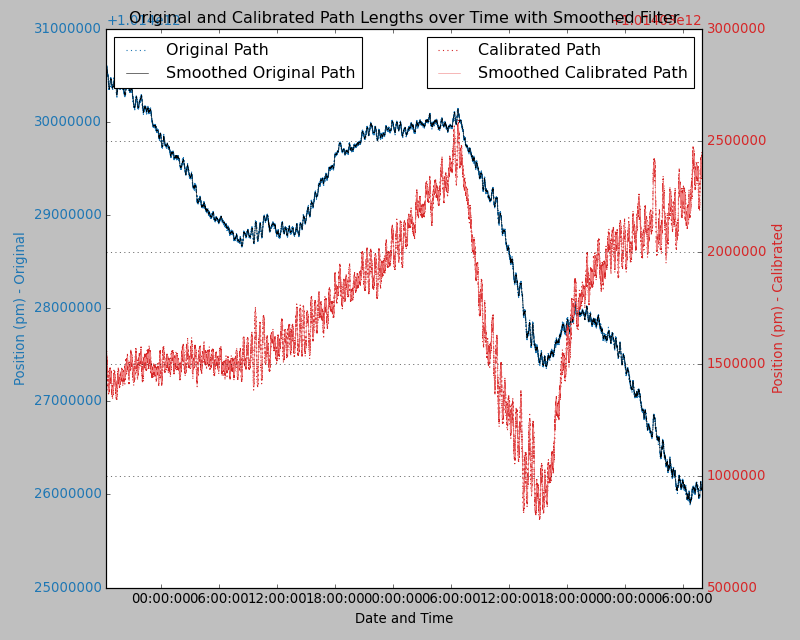

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) # hpa to kpa: 1hpa = 0.1kpa

def calculate_calibrated_path(original_path, refractive_index_standard, refractive_index_air):
    return original_path * refractive_index_standard / refractive_index_air

def plot_paths_with_twin_axes_smoothed(date_time, original_path, calibrated_path, label_original="Original Path", label_calibrated="Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(10, 8))

    color = 'tab:blue'
    ax1.set_xlabel("Date and Time")
    ax1.set_ylabel("Position (pm) - Original", color=color)
    ax1.plot(date_time, original_path, label=label_original, linestyle='dotted', linewidth=1, color=color)
    ax1.plot(date_time, original_path.rolling(window=50, min_periods=1).mean(), label='Smoothed Original Path', linestyle='-', linewidth=0.5, color='black')  # Adjust the window size as needed
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel("Position (pm) - Calibrated", color=color)
    ax2.plot(date_time, calibrated_path, label=label_calibrated, linestyle='dotted', linewidth=1, color=color)
    ax2.plot(date_time, calibrated_path.rolling(window=50, min_periods=1).mean(), label='Smoothed Calibrated Path', linestyle='-', linewidth=0.5, color='lightcoral')  # Adjust the window size as needed
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right')

    fig.tight_layout()
    plt.title("Original and Calibrated Path Lengths over Time with Smoothed Filter")
    plt.grid(True)
    plt.show()

# Load data
position_data = load_data("Experiment_outer_18_12_23_IDS+BME680_position.csv")
environment_data = load_data('Experiment_outer_18_12_23_IDS+BME680_environment_Modified.csv')


# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Extract the data for the specified time range (from 12:56 to 1:56)
start_time = pd.to_datetime("2023-12-18 18:20:24.748", format="%Y-%m-%d %H:%M:%S")
end_time = pd.to_datetime("2023-12-21 07:57:15.361", format="%Y-%m-%d %H:%M:%S")

selected_range = (date_time_interpolated >= start_time) & (date_time_interpolated <= end_time)
date_time_selected = date_time_interpolated[selected_range]
position_pm_selected = position_pm_interpolated[selected_range]
calibrated_path_selected = calibrated_path_interpolated[selected_range]

# Plot original and calibrated paths with twin axes and smoothed filter for the specified time range
plot_paths_with_twin_axes_smoothed(date_time_selected, position_pm_selected, calibrated_path_selected)


<IPython.core.display.Javascript object>


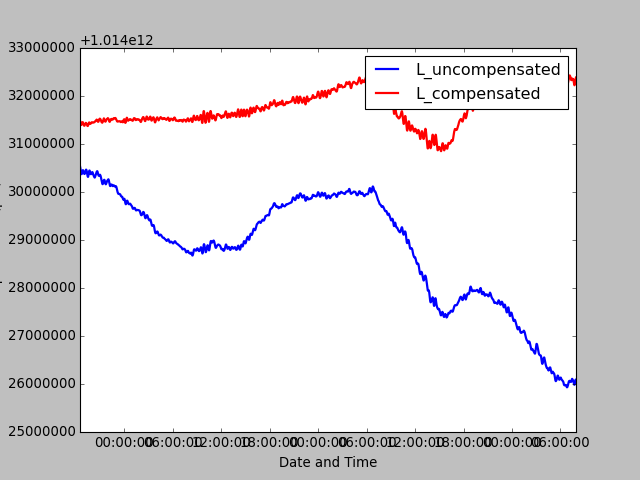

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib notebook
plt.style.use('classic')

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) # hpa to kpa: 1hpa = 0.1kpa

def calculate_calibrated_path(original_path, refractive_index_standard, refractive_index_air):
    return original_path * refractive_index_standard / refractive_index_air

def plot_smoothed_paths(date_time, smoothed_original_path, smoothed_calibrated_path, label_smoothed_original="L_uncompensated", label_smoothed_calibrated="L_compensated"):
    plt.figure(figsize=(8, 6))

    plt.plot(date_time, smoothed_original_path, label=label_smoothed_original, linestyle='-', linewidth=2)
    plt.plot(date_time, smoothed_calibrated_path, label=label_smoothed_calibrated, linestyle='-', linewidth=2, color='red')
    
    plt.xlabel("Date and Time")
    plt.ylabel("Displacement(pm)")
    plt.legend()
#     plt.title("Smoothed Original and Calibrated Paths")
#     plt.grid(True)
    plt.show()

# Load data
position_data = load_data("Experiment_outer_18_12_23_IDS+BME680_position.csv")
environment_data = load_data('Experiment_outer_18_12_23_IDS+BME680_environment_Modified.csv')


# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Extract the data for the specified time range (from 12:56 to 1:56)
start_time = pd.to_datetime("2023-12-18 18:30:24.748", format="%Y-%m-%d %H:%M:%S")
end_time = pd.to_datetime("2023-12-21 07:55:15.361", format="%Y-%m-%d %H:%M:%S")

selected_range = (date_time_interpolated >= start_time) & (date_time_interpolated <= end_time)
date_time_selected = date_time_interpolated[selected_range]
smoothed_original_path_selected = position_pm_interpolated.rolling(window=500, min_periods=1).mean()[selected_range]
smoothed_calibrated_path_selected = calibrated_path_interpolated.rolling(window=500, min_periods=1).mean()[selected_range]

# Plot only the smoothed original and calibrated paths for the specified time range
plot_smoothed_paths(date_time_selected, smoothed_original_path_selected, smoothed_calibrated_path_selected)

plt.savefig("Seminar.pdf")



<IPython.core.display.Javascript object>


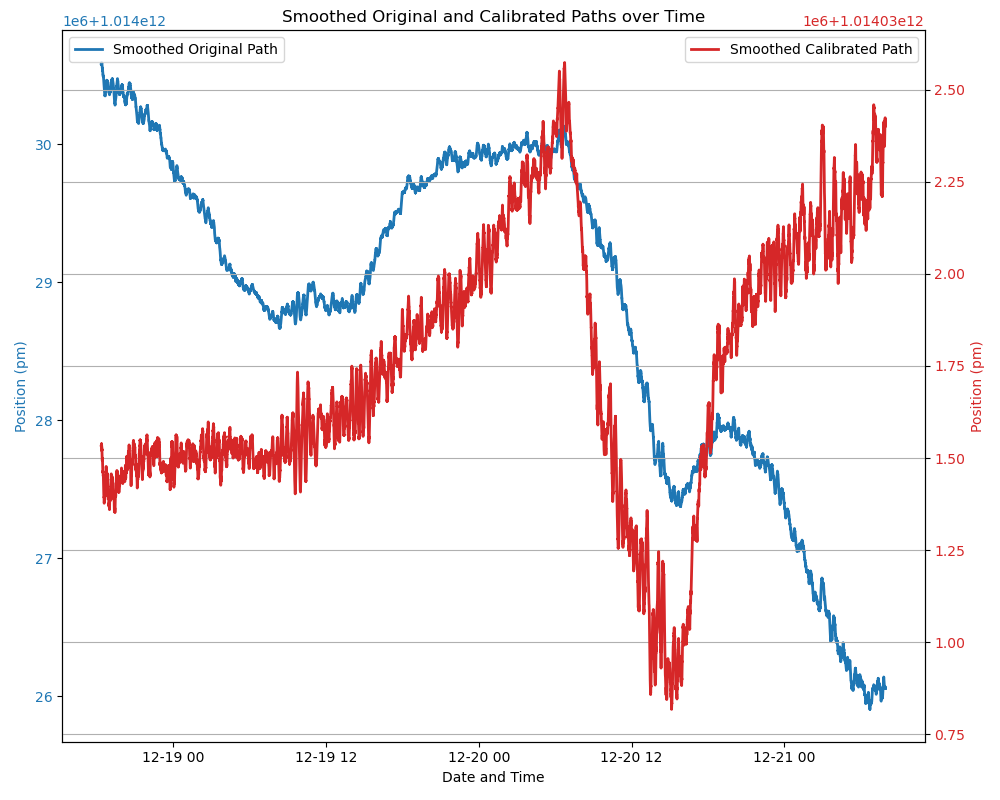

In [179]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) # hpa to kpa: 1hpa = 0.1kpa

def plot_smoothed_paths_twin_axes(date_time, smoothed_original_path, smoothed_calibrated_path, label_original="Smoothed Original Path", label_calibrated="Smoothed Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(10, 8))

    color = 'tab:blue'
    ax1.set_xlabel("Date and Time")
    ax1.set_ylabel("Position (pm)", color=color)
    ax1.plot(date_time, smoothed_original_path, label=label_original, linestyle='-', linewidth=2, color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel("Position (pm)", color=color)
    ax2.plot(date_time, smoothed_calibrated_path, label=label_calibrated, linestyle='-', linewidth=2, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right')

    fig.tight_layout()
    plt.title("Smoothed Original and Calibrated Paths over Time")
    plt.grid(True)
    plt.show()

# Load data
position_data = load_data("Experiment_outer_18_12_23_IDS+BME680_position.csv")
environment_data = load_data('Experiment_outer_18_12_23_IDS+BME680_environment_Modified.csv')


# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Extract the data for the specified time range (from 12:56 to 1:56)
start_time = pd.to_datetime("2023-12-18 18:20:24.748", format="%Y-%m-%d %H:%M:%S")
end_time = pd.to_datetime("2023-12-21 07:57:15.361", format="%Y-%m-%d %H:%M:%S")

selected_range = (date_time_interpolated >= start_time) & (date_time_interpolated <= end_time)
date_time_selected = date_time_interpolated[selected_range]
smoothed_original_path_selected = position_pm_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]
smoothed_calibrated_path_selected = calibrated_path_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]

# Plot smoothed original and calibrated paths with twin axes for the specified time range
plot_smoothed_paths_twin_axes(date_time_selected, smoothed_original_path_selected, smoothed_calibrated_path_selected)


<IPython.core.display.Javascript object>


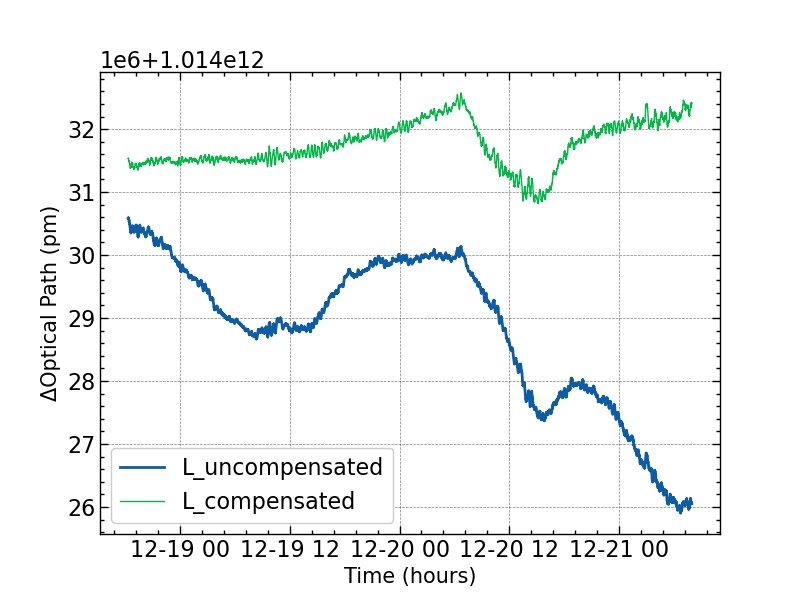

In [58]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) # hpa to kpa: 1hpa = 0.1kpa

def plot_smoothed_paths(date_time, smoothed_original_path, smoothed_calibrated_path, label_smoothed_original="L_uncompensated", label_smoothed_calibrated="L_compensated"):
    plt.figure(figsize=(8, 6))

    plt.plot(date_time, smoothed_original_path, label=label_smoothed_original, linestyle='-', linewidth=2)
    plt.plot(date_time, smoothed_calibrated_path, label=label_smoothed_calibrated, linestyle='-', linewidth=1)

    plt.xlabel("Time (hours)", fontsize=15)
    plt.ylabel("ΔOptical Path (pm)", fontsize=15)
    plt.legend()
#     plt.title("Smoothed Original and Calibrated Paths", fontsize=15)
    plt.grid(True)
    plt.savefig("experiment2_Displacement_plot_reading.png")  # Save the figure
    plt.show()

# Load data
position_data = load_data("Experiment_outer_18_12_23_IDS+BME680_position.csv")
environment_data = load_data('Experiment_outer_18_12_23_IDS+BME680_environment_Modified.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Extract the data for the specified time range (from 12:56 to 1:56)
start_time = pd.to_datetime("2023-12-18 18:20:24.748", format="%Y-%m-%d %H:%M:%S")
end_time = pd.to_datetime("2023-12-21 07:57:15.361", format="%Y-%m-%d %H:%M:%S")

selected_range = (date_time_interpolated >= start_time) & (date_time_interpolated <= end_time)
date_time_selected = date_time_interpolated[selected_range]
smoothed_original_path_selected = position_pm_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]
smoothed_calibrated_path_selected = calibrated_path_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]

# Plot only the smoothed original and calibrated paths for the specified time range
plot_smoothed_paths(date_time_selected, smoothed_original_path_selected, smoothed_calibrated_path_selected)


<IPython.core.display.Javascript object>


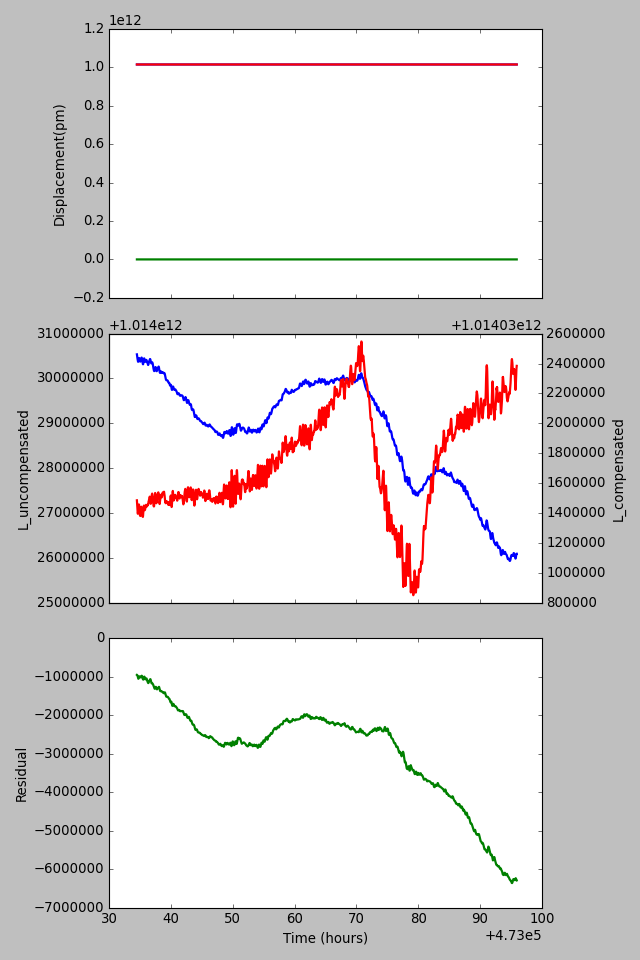

In [63]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
%matplotlib notebook
plt.style.use('classic')

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_calibrated_path(original_path, refractive_index_standard, refractive_index_air):
    return original_path * refractive_index_standard / refractive_index_air

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) # hpa to kpa: 1hpa = 0.1kpa

def plot_smoothed_paths(date_time, smoothed_original_path, smoothed_calibrated_path, residual):
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(8, 12), sharex=True)

    # Convert date_time to hours
    hours = mdates.date2num(date_time) * 24

    # Plot all three in the same plot (overplot)
    ax1.plot(hours, smoothed_original_path, linestyle='-', linewidth=2)
    ax1.plot(hours, smoothed_calibrated_path, linestyle='-', linewidth=2, color='red')
    ax1.plot(hours, residual, linestyle='-', linewidth=2, color='green')
    ax1.set_ylabel("Displacement(pm)")

    # Plot L_compensated in Y left axis, L_uncompensated in the right y-axis
    ax2.plot(hours, smoothed_original_path, linestyle='-', linewidth=2)
    ax2.set_ylabel("L_uncompensated")
    ax2b = ax2.twinx()
    ax2b.plot(hours, smoothed_calibrated_path, linestyle='-', linewidth=2, color='red')
    ax2b.set_ylabel("L_compensated")

    # Plot residual in the top x-axis
    ax3.plot(hours, residual, linestyle='-', linewidth=2, color='green')
    ax3.set_xlabel("Time (hours)")
    ax3.set_ylabel("Residual")

    plt.tight_layout()
    plt.show()

# Load data
position_data = load_data("Experiment_outer_18_12_23_IDS+BME680_position.csv")
environment_data = load_data('Experiment_outer_18_12_23_IDS+BME680_environment_Modified.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

# Calculate residual
residual = position_pm - calibrated_path

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')
residual_interpolated = residual.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated), len(residual_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]
residual_interpolated = residual_interpolated[:min_length]

# Calculate standard deviation
std_dev_original = position_pm_interpolated.std()
std_dev_calibrated = calibrated_path_interpolated.std()
std_dev_residual = residual_interpolated.std()

# Extract the data for the specified time range (from 12:56 to 1:56)
start_time = pd.to_datetime("2023-12-18 18:30:24.748", format="%Y-%m-%d %H:%M:%S")
end_time = pd.to_datetime("2023-12-21 07:55:15.361", format="%Y-%m-%d %H:%M:%S")

selected_range = (date_time_interpolated >= start_time) & (date_time_interpolated <= end_time)
date_time_selected = date_time_interpolated[selected_range]
smoothed_original_path_selected = position_pm_interpolated.rolling(window=500, min_periods=1).mean()[selected_range]
smoothed_calibrated_path_selected = calibrated_path_interpolated.rolling(window=500, min_periods=1).mean()[selected_range]
residual_selected = residual_interpolated.rolling(window=500, min_periods=1).mean()[selected_range]

# Plot only the smoothed original and calibrated paths for the specified time range
plot_smoothed_paths(date_time_selected, smoothed_original_path_selected, smoothed_calibrated_path_selected, residual_selected)


#plt.savefig("Seminar.pdf")


# Experiment 7(ii): Before Christmas experiment

### Environmental Parameters plot

C:\Users\biswa\AppData\Local\Temp\ipykernel_15644\3639553129.py:7: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  df = pd.read_csv('Experiment_outer_21_12_23_IDS+BME680_environment_Modified.csv',parse_dates=[['Date', 'Time']],dayfirst=True,


<IPython.core.display.Javascript object>


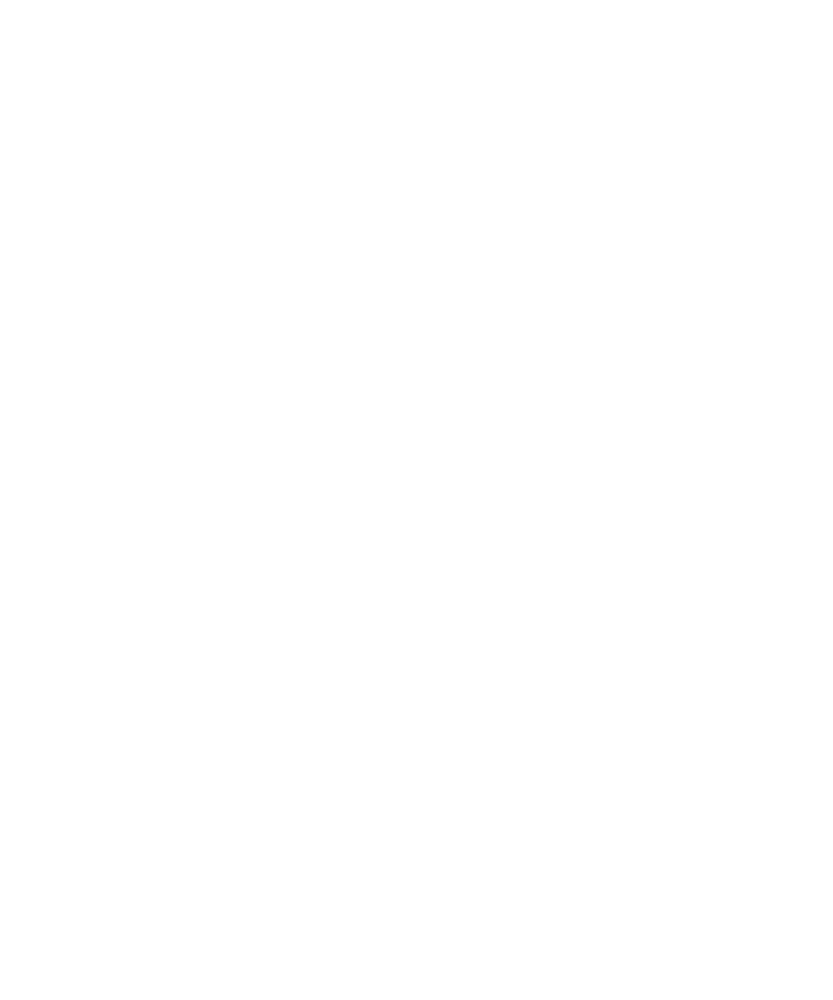

In [33]:
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib notebook

# Read the CSV file into a pandas DataFrame, skipping lines with errors
df = pd.read_csv('Experiment_outer_21_12_23_IDS+BME680_environment_Modified.csv',parse_dates=[['Date', 'Time']],dayfirst=True,
                 error_bad_lines=False)

# Create subplots with shared x-axis
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)

# Plot Temperature on the first subplot
ax1.set_ylabel('Temperature (C)', color='tab:orange')
ax1.scatter(df['Date_Time'], df['Temperature(C)'], color='tab:orange', label='Temperature', s=5)
ax1.plot(df['Date_Time'], df['Temperature(C)'], linestyle='-', color='tab:orange', alpha=0.5)
ax1.tick_params(axis='y', labelcolor='tab:orange')
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.tick_params(axis='x', labelrotation=45)
ax1.set_title('Temperature')

# Plot Humidity on the second subplot
ax2.set_ylabel('Humidity (%rh)', color='tab:blue')
ax2.scatter(df['Date_Time'], df['Humidity(%rh)'], color='tab:blue', label='Humidity', s=5)
ax2.plot(df['Date_Time'], df['Humidity(%rh)'], linestyle='-', color='tab:blue', alpha=0.5)
ax2.tick_params(axis='y', labelcolor='tab:blue')
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.tick_params(axis='x', labelrotation=45)
ax2.set_title('Humidity')

# Plot Pressure on the third subplot
ax3.set_xlabel('Date & Time')
ax3.set_ylabel('Pressure (hPa)', color='tab:grey')
ax3.scatter(df['Date_Time'], df['Pressure(hPa)'], color='tab:grey', label='Pressure', s=5)
ax3.plot(df['Date_Time'], df['Pressure(hPa)'], linestyle='-', color='tab:grey', alpha=0.5)
ax3.tick_params(axis='y', labelcolor='tab:grey')
ax3.grid(True, linestyle='--', alpha=0.7)
ax3.tick_params(axis='x', labelrotation=45)
ax3.set_title('Pressure')

# Adjust layout to prevent clipping of labels
plt.tight_layout()

# Show the plot
plt.show()


### Position Plot along with smooth data

<IPython.core.display.Javascript object>


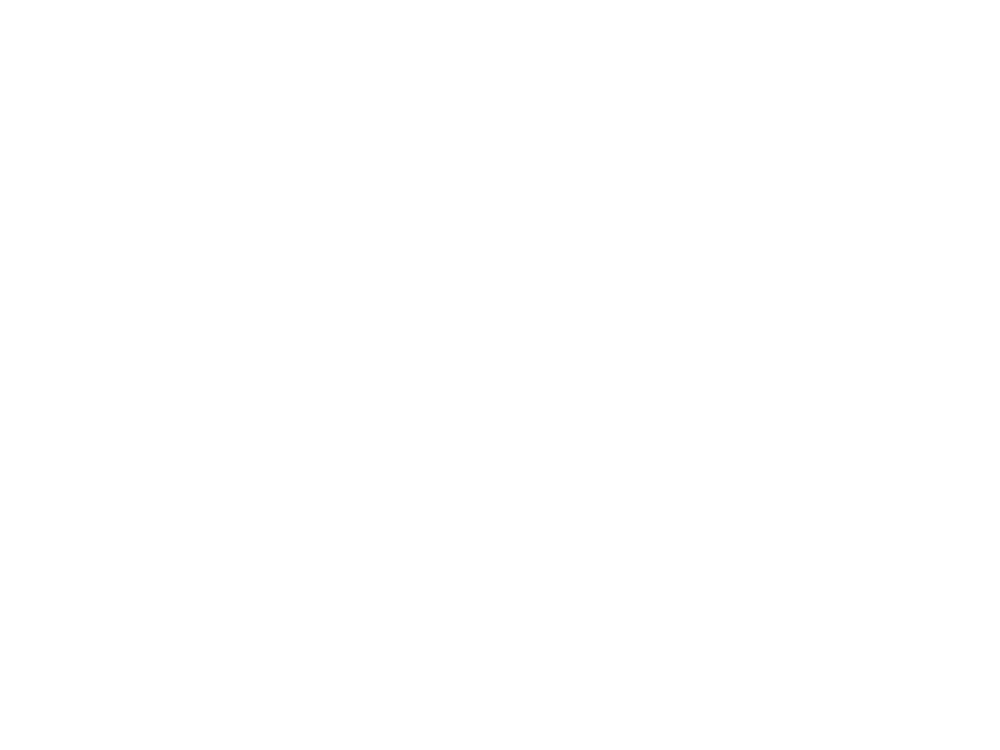

In [34]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data from the CSV file
data = pd.read_csv("Experiment_outer_21_12_23_IDS+BME680_position.csv")

# Extract Date, Time, and Position columns
date_time = data["Date"] + " " + data["Time"]
position_cm = data["Position (cm)"]

# Convert position to nanometers
position_pm = position_cm * 1e10  # 1 cm = 1e10 pm

# Convert date and time to datetime objects
date_time = pd.to_datetime(date_time, format="%Y-%m-%d %H:%M:%S")

# Apply moving average filters with different window sizes
window_size1 = 20  # Adjust the window size as needed
window_size2 = 150
position_smoothed1 = position_pm.rolling(window=window_size1).mean()
position_smoothed2 = position_pm.rolling(window=window_size2).mean()

# Create subplots
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(20, 15), sharex=True)

# Plot for the first window size
ax1.scatter(date_time, position_pm, marker='.', s=5, label="Raw Data")  # Original data
ax1.plot(date_time, position_smoothed1, label=f"Smoothed Data (Window Size {window_size1})", linestyle='-', linewidth=1, color='red')
ax1.set_ylabel("Position (nm)")
ax1.set_title(f"Position vs. Time")
ax1.legend()
ax1.grid(True)

# Plot for the second window size
ax2.scatter(date_time, position_pm, marker='.', s=3, label="Raw Data")  # Original data
ax2.plot(date_time, position_smoothed2, label=f"Smoothed Data (Window Size {window_size2})", linestyle='-', linewidth=1, color='red')
ax2.set_xlabel("Date and Time")
ax2.set_ylabel("Position (nm)")
ax2.set_title(f" vs. Time with Moving Average Smoothing (Window Size {window_size2})")
ax2.legend()
ax2.grid(True)

# Plot for the Third window size
# ax3.scatter(date_time, position_pm, marker='.', s=3, label="Raw Data")  # Original data
ax3.plot(date_time, position_smoothed2, label=f"Smoothed Data (Window Size {window_size2})", linestyle='-', linewidth=1, color='red')
ax3.set_xlabel("Date and Time")
ax3.set_ylabel("Position (nm)")
ax3.set_title(f"Position vs. Time(extracted) with Moving Average Smoothing (Window Size {window_size2})")
ax3.legend()
ax3.grid(True)

# Save the plot as an image
# plt.savefig("smoothed_subplot_slid.png")

# Display the plot in a separate window in Jupyter Notebook
plt.show()


<IPython.core.display.Javascript object>


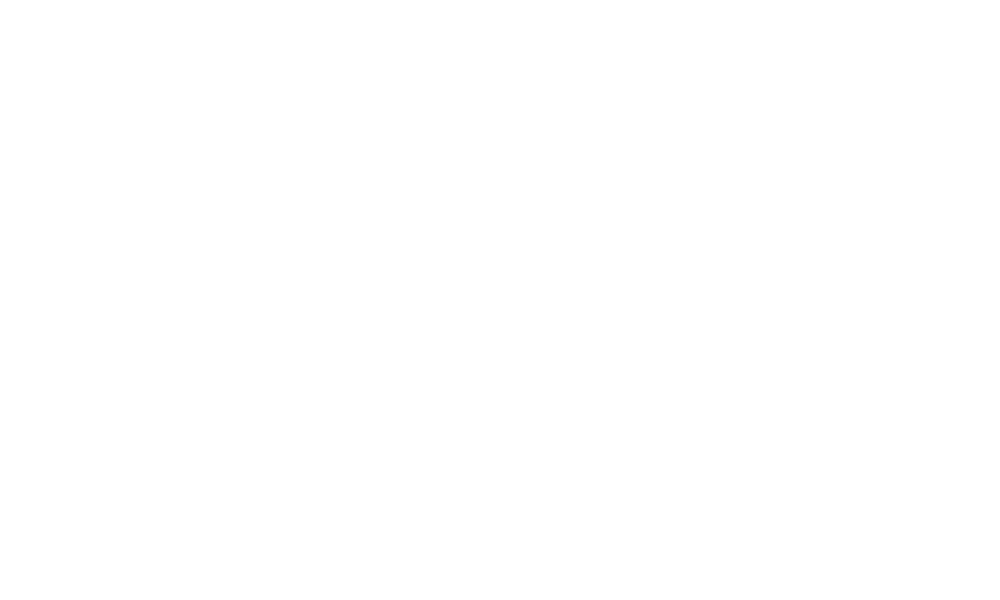

In [35]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    correction_term = 0.0
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) + correction_term

def calculate_calibrated_path(original_path, refractive_index_standard, refractive_index_air):
    return original_path / refractive_index_air

def plot_smoothed_paths(date_time, smoothed_original_path, smoothed_calibrated_path, label_smoothed_original="Smoothed Original Path", label_smoothed_calibrated="Smoothed Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(10, 6))

    color = 'tab:blue'
    ax1.set_xlabel('Date and Time')
    ax1.set_ylabel('Smoothed Original Path', color=color)
    ax1.plot(date_time, smoothed_original_path, label=label_smoothed_original, linestyle='-', linewidth=2, color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color = 'tab:red'
    ax2.set_ylabel('Smoothed Calibrated Path', color=color)  # we already handled the x-label with ax1
    ax2.plot(date_time, smoothed_calibrated_path, label=label_smoothed_calibrated, linestyle='-', linewidth=2, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right')

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.title("Smoothed Original and Calibrated Paths")
    plt.grid(True)
    plt.show()

# Load data
position_data = load_data("Experiment_outer_21_12_23_IDS+BME680_position.csv")
environment_data = load_data('Experiment_outer_21_12_23_IDS+BME680_environment_Modified.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data with correction
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Extract the data for the specified time range (from 12:56 to 1:56)
start_time = pd.to_datetime("2023-12-21 14:13:50", format="%Y-%m-%d %H:%M:%S")
end_time = pd.to_datetime("2023-12-22 07:43:22", format="%Y-%m-%d %H:%M:%S")

selected_range = (date_time_interpolated >= start_time) & (date_time_interpolated <= end_time)
date_time_selected = date_time_interpolated[selected_range]
smoothed_original_path_selected = position_pm_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]
smoothed_calibrated_path_selected = calibrated_path_interpolated.rolling(window=50, min_periods=1).mean()[selected_range]

# Plot only the smoothed original and calibrated paths for the specified time range
plot_smoothed_paths(date_time_selected, smoothed_original_path_selected, smoothed_calibrated_path_selected)


# Miscellaneous Calibration

Testing in experiment 4

<IPython.core.display.Javascript object>


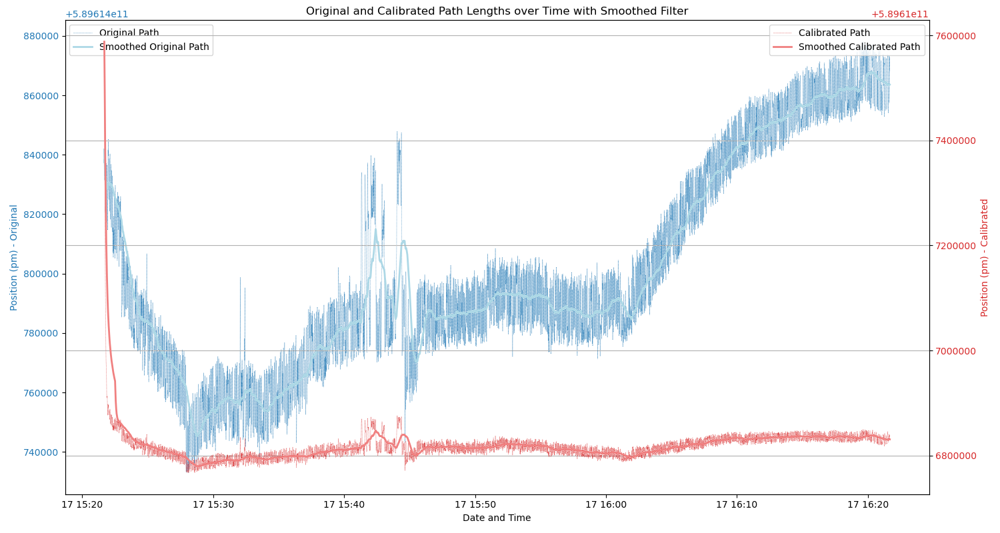

<IPython.core.display.Javascript object>


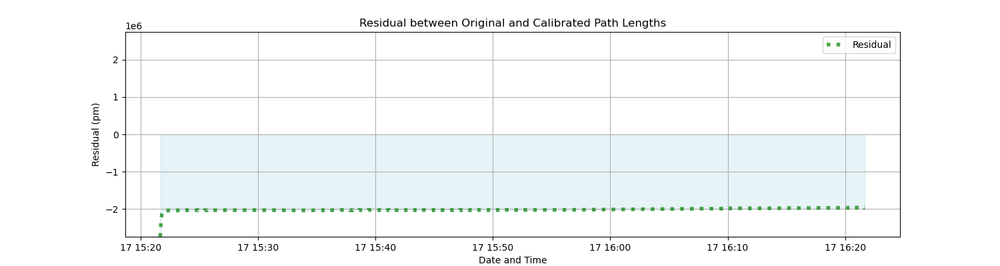

In [60]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) #hpa to kpa: 1hpa = 0.1kpa

def calculate_calibrated_path(original_path, refractive_index_standard, refractive_index_air):
    return original_path * refractive_index_standard / refractive_index_air

def plot_paths_with_twin_axes(date_time, original_path, calibrated_path, label_original="Original Path", label_calibrated="Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(15, 8))

    color = 'tab:blue'
    ax1.set_xlabel("Date and Time")
    ax1.set_ylabel("Position (pm) - Original", color=color)
    ax1.plot(date_time, original_path, label=label_original, linestyle='dotted', linewidth=0.5, color=color)
    ax1.plot(date_time, original_path.rolling(window=50, min_periods=1).mean(), label='Smoothed Original Path', linestyle='-', linewidth=2, color='lightblue')  # Adjust the window size as needed
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel("Position (pm) - Calibrated", color=color)
    ax2.plot(date_time, calibrated_path, label=label_calibrated, linestyle='dotted', linewidth=0.5, color=color)
    ax2.plot(date_time, calibrated_path.rolling(window=50, min_periods=1).mean(), label='Smoothed Calibrated Path', linestyle='-', linewidth=2, color='lightcoral')  # Adjust the window size as needed
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right')

    fig.tight_layout()
    plt.title("Original and Calibrated Path Lengths over Time with Smoothed Filter")
    plt.grid(True)
    plt.show()
    plt.savefig('Experiment_4_Path_analysis_result.jpg')

def plot_residual(date_time, residual, label="Residual"):
    plt.figure(figsize=(15, 4))
    plt.plot(date_time, residual, label=label, linestyle='dotted', linewidth=4, color='green', alpha=0.7)
    
    # Calculate the maximum absolute value in the residual
    max_abs_residual = max(abs(residual))
    
    # Set y-axis limits symmetrically around 0
    plt.ylim([-max_abs_residual, max_abs_residual])
    
    plt.fill_between(date_time, 0, residual, where=(residual > 0), interpolate=True, color='lightcoral', alpha=0.3)
    plt.fill_between(date_time, 0, residual, where=(residual < 0), interpolate=True, color='lightblue', alpha=0.3)
    
    plt.xlabel("Date and Time")
    plt.ylabel("Residual (pm)")
    plt.title("Residual between Original and Calibrated Path Lengths")
    plt.legend()
    plt.grid(True)
    plt.savefig('Experiment_4_Residual_analysis_result.jpg')  # Save the figure
    plt.show()

# Load data
position_data = load_data("pos_time_readings_job2.csv")
environment_data = load_data('Environmental_Readings_Modified_job2.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Calculate the residual between actual and calibrated paths
residual_interpolated = position_pm_interpolated - calibrated_path_interpolated

# Plot original and calibrated paths with twin axes and smoothed filter
plot_paths_with_twin_axes(date_time_interpolated, position_pm_interpolated, calibrated_path_interpolated)

# Plot the residual between original and calibrated paths
plot_residual(date_time_interpolated, residual_interpolated)


The time constant (tau) is typically calculated using the formula for exponential decay:

y(t) = y_0 * e^{-t/tau} 

Where:
- y(t) is the value at time \( t \),
- y_0 is the initial value at \( t = 0 \),
- tau is the time constant,
-  e is the mathematical constant approximately equal to 2.71828.

C:\Users\biswa\AppData\Local\Temp\ipykernel_25008\2324624162.py:10: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  environment_data = pd.read_csv('Environmental_Readings_Modified_job2.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)


Time Constant (tau) of Refractive Index over Time: 5.137447233973358


<IPython.core.display.Javascript object>


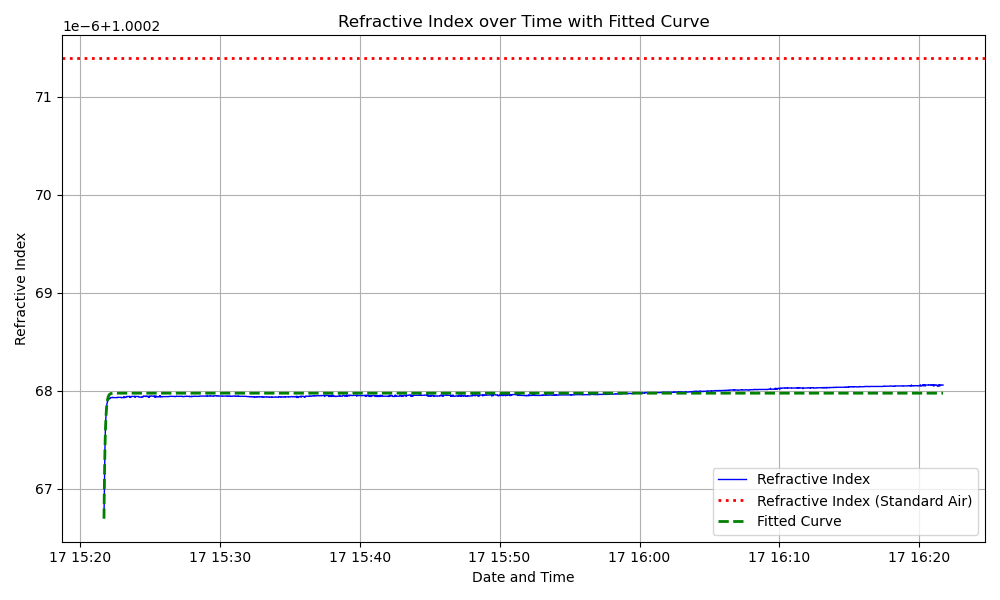

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160))  # hpa to kpa: 1hpa = 0.1kpa

# Load data
environment_data = pd.read_csv('Environmental_Readings_Modified_job2.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)

# Calculate refractive index using environmental data
refractive_index = calculate_refractive_index(environment_data['Pressure(hPa)'],
                                               environment_data['Temperature(C)'],
                                               environment_data['Humidity(%rh)'])

# Refractive index of standard air
refractive_index_standard = 1.0002713938

# Time constant calculation (fitting exponential decay model)
def exponential_decay_model(t, A, tau, C):
    return A * np.exp(-t / tau) + C

# Extract time and refractive index data
time_data = np.arange(len(environment_data))
refractive_index_data = refractive_index.values

# Fit the model to the data
popt, _ = curve_fit(exponential_decay_model, time_data, refractive_index_data)

# Extract time constant (tau) from the fitted parameters
time_constant = popt[1]
print("Time Constant (tau) of Refractive Index over Time:", time_constant)

# Plot the fitted curve
fitted_curve = exponential_decay_model(time_data, *popt)

plt.figure(figsize=(10, 6))
plt.plot(environment_data['Date_Time'], refractive_index, label='Refractive Index', linestyle='-', linewidth=1, color='blue')
plt.axhline(y=refractive_index_standard, color='red', linestyle='dotted', linewidth=2, label='Refractive Index (Standard Air)')
plt.plot(environment_data['Date_Time'], fitted_curve, label='Fitted Curve', linestyle='--', linewidth=2, color='green')
plt.xlabel('Date and Time')
plt.ylabel('Refractive Index')
plt.title('Refractive Index over Time with Fitted Curve')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>


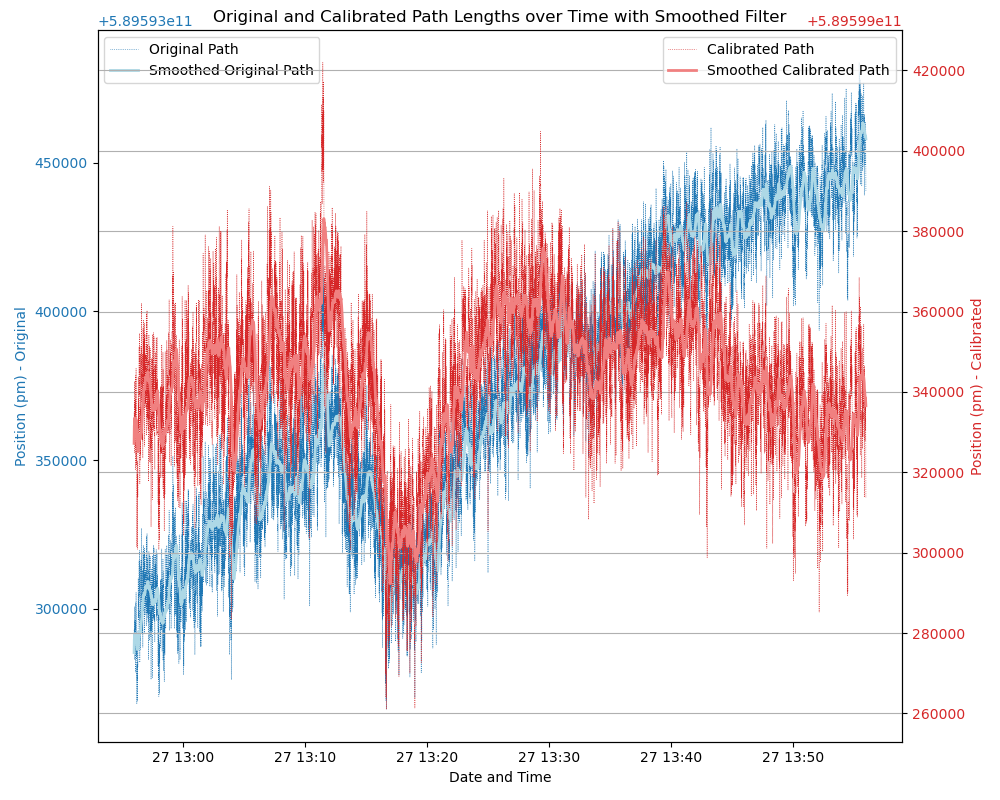

In [53]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) # hpa to kpa: 1hpa = 0.1kpa

def calculate_calibrated_path(original_path, refractive_index_standard, refractive_index_air):
    return original_path * refractive_index_standard / refractive_index_air

def plot_paths_with_twin_axes_smoothed(date_time, original_path, calibrated_path, label_original="Original Path", label_calibrated="Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(10, 8))

    color = 'tab:blue'
    ax1.set_xlabel("Date and Time")
    ax1.set_ylabel("Position (pm) - Original", color=color)
    ax1.plot(date_time, original_path, label=label_original, linestyle='dotted', linewidth=0.5, color=color)
    ax1.plot(date_time, original_path.rolling(window=50, min_periods=1).mean(), label='Smoothed Original Path', linestyle='-', linewidth=2, color='lightblue')  # Adjust the window size as needed
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel("Position (pm) - Calibrated", color=color)
    ax2.plot(date_time, calibrated_path, label=label_calibrated, linestyle='dotted', linewidth=0.5, color=color)
    ax2.plot(date_time, calibrated_path.rolling(window=50, min_periods=1).mean(), label='Smoothed Calibrated Path', linestyle='-', linewidth=2, color='lightcoral')  # Adjust the window size as needed
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right')

    fig.tight_layout()
    plt.title("Original and Calibrated Path Lengths over Time with Smoothed Filter")
    plt.grid(True)
    plt.show()

# Load data
position_data = load_data("pos_time_readings_exp3.csv")
environment_data = load_data('Environmental_Readings_Modified_exp3.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Extract the data for the specified time range (from 12:56 to 1:56)
start_time = pd.to_datetime("2023-11-27 12:56:00", format="%Y-%m-%d %H:%M:%S")
end_time = pd.to_datetime("2023-11-27 13:56:00", format="%Y-%m-%d %H:%M:%S")

selected_range = (date_time_interpolated >= start_time) & (date_time_interpolated <= end_time)
date_time_selected = date_time_interpolated[selected_range]
position_pm_selected = position_pm_interpolated[selected_range]
calibrated_path_selected = calibrated_path_interpolated[selected_range]

# Plot original and calibrated paths with twin axes and smoothed filter for the specified time range
plot_paths_with_twin_axes_smoothed(date_time_selected, position_pm_selected, calibrated_path_selected)


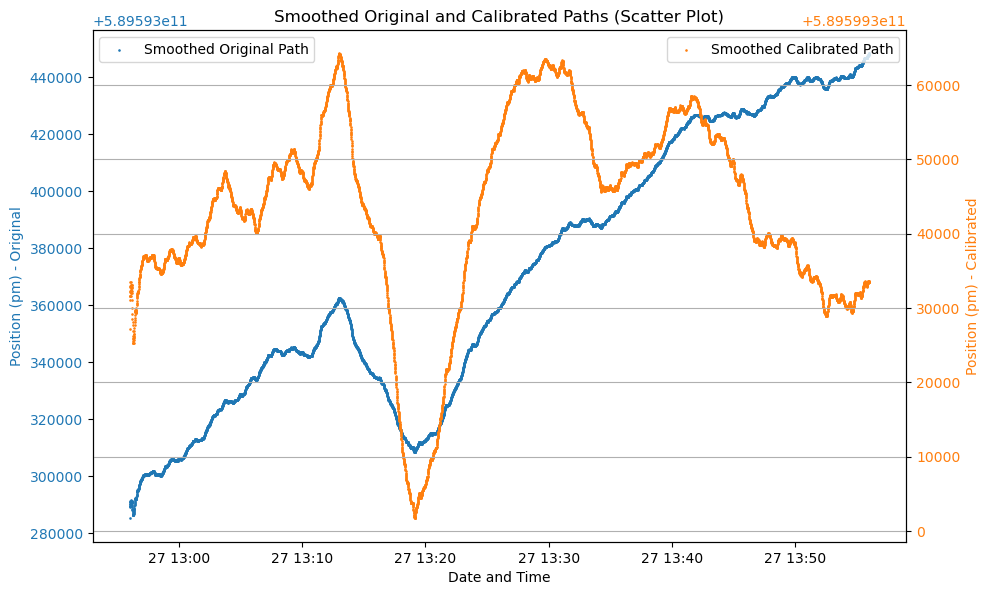

In [24]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160))  # hpa to kpa: 1hpa = 0.1kpa

def calculate_calibrated_path(original_path, refractive_index_standard, refractive_index_air):
    return original_path * refractive_index_standard / refractive_index_air

def scatter_smoothed_paths(date_time, original_path, calibrated_path, label_original="Original Path", label_calibrated="Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(10, 6))

    color = 'tab:blue'
    ax1.set_xlabel("Date and Time")
    ax1.set_ylabel("Position (pm) - Original", color=color)
    ax1.scatter(date_time, original_path.rolling(window=300, min_periods=1).mean(), label='Smoothed Original Path', color=color, s=0.75)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    color = 'tab:orange'
    ax2.set_ylabel("Position (pm) - Calibrated", color=color)
    ax2.scatter(date_time, calibrated_path.rolling(window=300, min_periods=1).mean(), label='Smoothed Calibrated Path', color=color, s=0.75)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right')
    
    fig.tight_layout()
    plt.title("Smoothed Original and Calibrated Paths (Scatter Plot)")
    plt.grid(True)
    plt.show()

# Load data
position_data = load_data("pos_time_readings_exp3.csv")
environment_data = load_data('Environmental_Readings_Modified_exp3.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal  
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal 
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]

# Extract the data for the specified time range (from 12:56 to 1:56)
start_time = pd.to_datetime("2023-11-27 12:56:00", format="%Y-%m-%d %H:%M:%S")
end_time = pd.to_datetime("2023-11-27 13:56:00", format="%Y-%m-%d %H:%M:%S")

selected_range = (date_time_interpolated >= start_time) & (date_time_interpolated <= end_time)
date_time_selected = date_time_interpolated[selected_range]
position_pm_selected = position_pm_interpolated[selected_range]
calibrated_path_selected = calibrated_path_interpolated[selected_range]

# Plot smoothed original and calibrated paths for the specified time range (Scatter Plot)
scatter_smoothed_paths(date_time_selected, position_pm_selected, calibrated_path_selected)


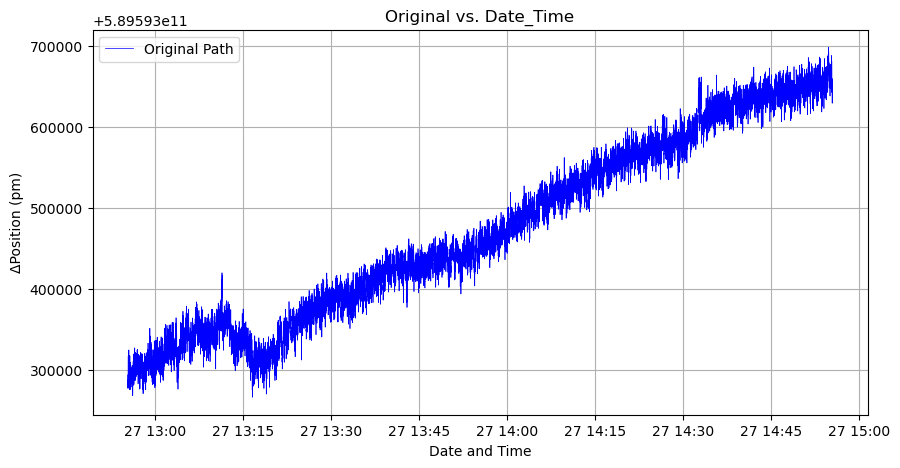

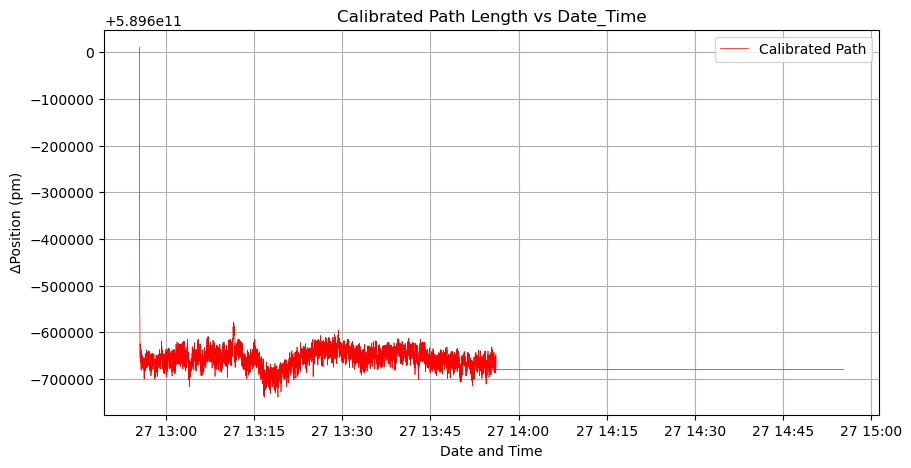

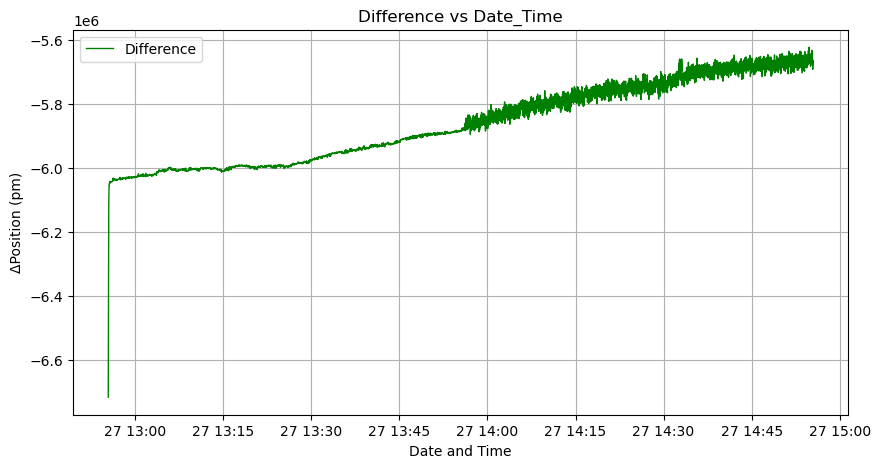

In [25]:
# Plot original and calibrated paths overlapped
plt.figure(figsize=(10, 5))
plt.plot(date_time_interpolated, position_pm_interpolated, label="Original Path", linestyle='-', linewidth=0.5, color='blue')
# plt.plot(date_time_interpolated, calibrated_path_interpolated, label="Calibrated Path", linestyle='-', linewidth=1, color='red')
plt.xlabel("Date and Time")
plt.ylabel("ΔPosition (pm)")
plt.title("Original vs. Date_Time")
plt.legend()
plt.grid(True)
plt.show()

# Plot original and calibrated paths overlapped
plt.figure(figsize=(10, 5))
# plt.plot(date_time_interpolated, position_pm_interpolated, label="Original Path", linestyle='-', linewidth=1, color='blue')
plt.plot(date_time_interpolated, calibrated_path_interpolated, label="Calibrated Path", linestyle='-', linewidth=0.5, color='red')
plt.xlabel("Date and Time")
plt.ylabel("ΔPosition (pm)")
plt.title("Calibrated Path Length vs Date_Time")
plt.legend()
plt.grid(True)
plt.show()

# Plot actual path and difference in the same plot
difference_interpolated = position_pm_interpolated - calibrated_path_interpolated
plt.figure(figsize=(10, 5))
# plt.plot(date_time_interpolated, position_pm_interpolated, label="Actual Path", linestyle='-', linewidth=1, color='blue')
plt.plot(date_time_interpolated, difference_interpolated, label="Difference", linestyle='-', linewidth=1, color='green')
plt.xlabel("Date and Time")
plt.ylabel("ΔPosition (pm)")
plt.title("Difference vs Date_Time")
plt.legend()
plt.grid(True)
plt.show()


In [182]:
print("Length of position_pm:", len(position_pm))
print("Length of calibrated_path:", len(calibrated_path))


Length of position_pm: 14167
Length of calibrated_path: 14167


Testing in 7(ii) experiment

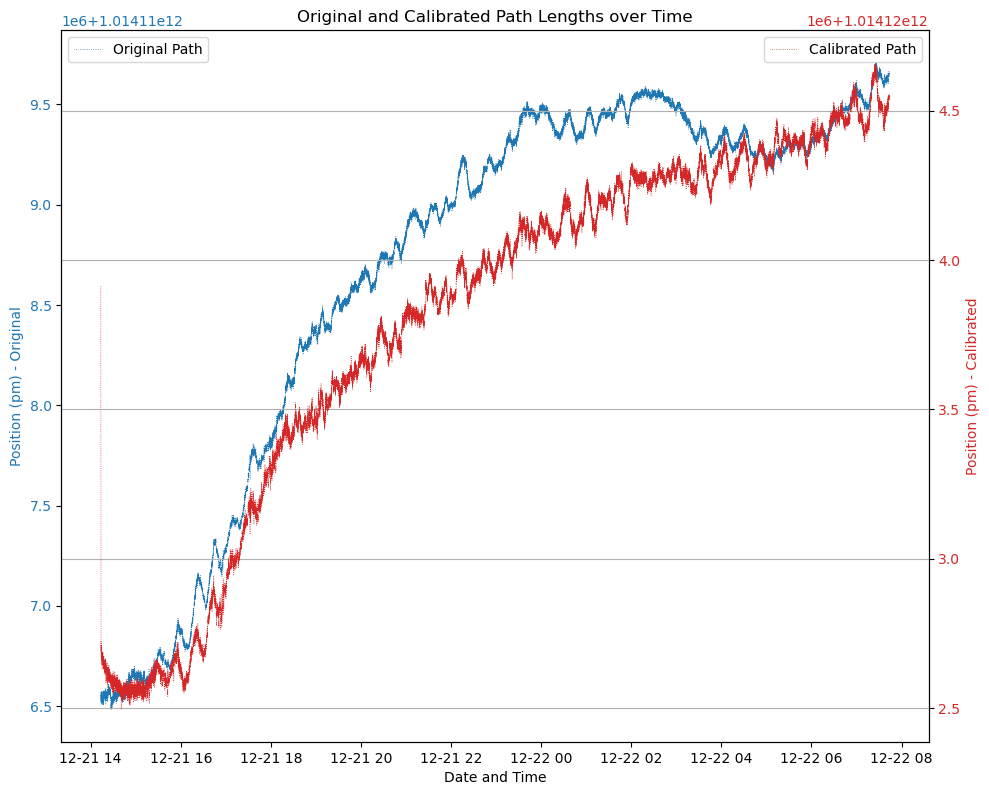

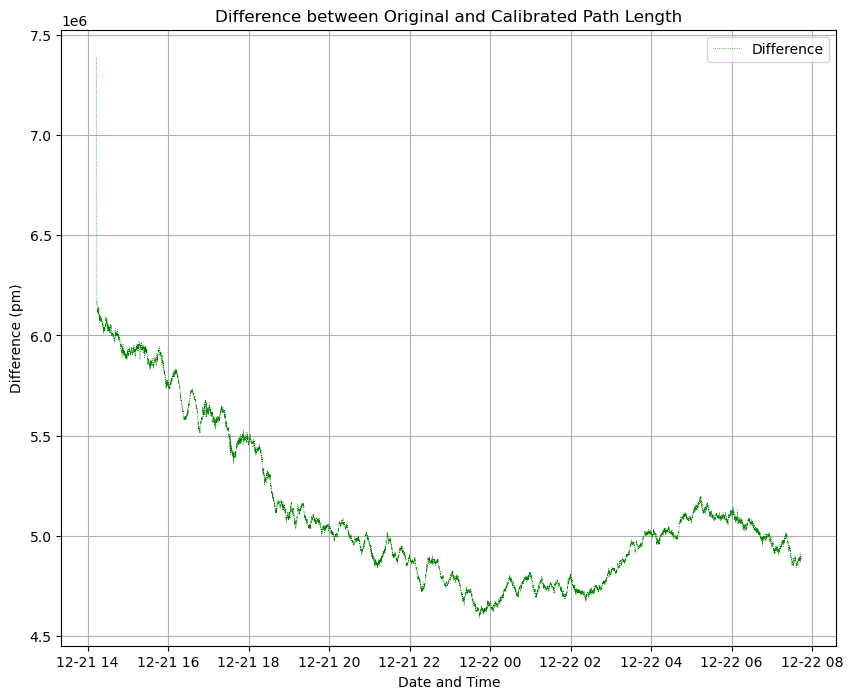

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

def load_data(file_path):
    return pd.read_csv(file_path)

def extract_date_time(df):
    return pd.to_datetime(df["Date"] + " " + df["Time"], format="%Y-%m-%d %H:%M:%S")

def convert_to_pm(position_cm):
    return position_cm * 1e10  # 1 cm = 1e10 pm

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) #hpa to kpa: 1hpa = 0.1kpa

def calculate_calibrated_path(original_path, refractive_index_standard, refractive_index_air):
    return original_path * refractive_index_standard / refractive_index_air

def plot_paths_with_twin_axes(date_time, original_path, calibrated_path, label_original="Original Path", label_calibrated="Calibrated Path"):
    fig, ax1 = plt.subplots(figsize=(10, 8))

    color = 'tab:blue'
    ax1.set_xlabel("Date and Time")
    ax1.set_ylabel("Position (pm) - Original", color=color)
    ax1.plot(date_time, original_path, label=label_original, linestyle='dotted', linewidth=0.5, color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel("Position (pm) - Calibrated", color=color)
    ax2.plot(date_time, calibrated_path, label=label_calibrated, linestyle='dotted', linewidth=0.5, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.legend(loc='upper right')

    fig.tight_layout()
    plt.title("Original and Calibrated Path Lengths over Time")
    plt.grid(True)
    plt.show()

def plot_difference(date_time, difference, label="Difference"):
    plt.figure(figsize=(10, 8))
    plt.plot(date_time, difference, label=label, linestyle='dotted', linewidth=0.5, color='green')
    plt.xlabel("Date and Time")
    plt.ylabel("Difference (pm)")
    plt.title("Difference between Original and Calibrated Path Length")
    plt.legend()
    plt.grid(True)
    plt.show()


# Load data
position_data = load_data("Experiment_outer_21_12_23_IDS+BME680_position.csv")
environment_data = load_data('Experiment_outer_21_12_23_IDS+BME680_environment_Modified.csv')

# Extract Date, Time, and Position columns from position data
date_time = extract_date_time(position_data)
position_cm = position_data["Position (cm)"]

# Convert position to nanometers
position_pm = convert_to_pm(position_cm)

# Calculate refractive index using environmental data
n_air = calculate_refractive_index(environment_data['Pressure(hPa)'], environment_data['Temperature(C)'], environment_data['Humidity(%rh)'])

# Refractive index of standard air
n_sa = 1.0002713938

# Calculate calibrated path length
calibrated_path = calculate_calibrated_path(position_pm, n_sa, n_air)

## Interpolate to fill missing values and make lengths equal
date_time_interpolated = pd.date_range(date_time.min(), date_time.max(), periods=len(date_time))
position_pm_interpolated = position_pm.interpolate(method='linear')
calibrated_path_interpolated = calibrated_path.interpolate(method='linear')

# Trim or pad to make lengths equal
min_length = min(len(date_time_interpolated), len(position_pm_interpolated), len(calibrated_path_interpolated))
date_time_interpolated = date_time_interpolated[:min_length]
position_pm_interpolated = position_pm_interpolated[:min_length]
calibrated_path_interpolated = calibrated_path_interpolated[:min_length]


# Calculate the difference between actual and calibrated paths
difference_interpolated = -position_pm_interpolated + calibrated_path_interpolated

# Plot original and calibrated paths with twin axes
plot_paths_with_twin_axes(date_time_interpolated, position_pm_interpolated, calibrated_path_interpolated)

# Plot the difference between original and calibrated paths
plot_difference(date_time_interpolated, difference_interpolated)



C:\Users\biswa\AppData\Local\Temp\ipykernel_25008\2840119126.py:8: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  environment_data = pd.read_csv('Experiment_outer_21_12_23_IDS+BME680_environment_Modified.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)


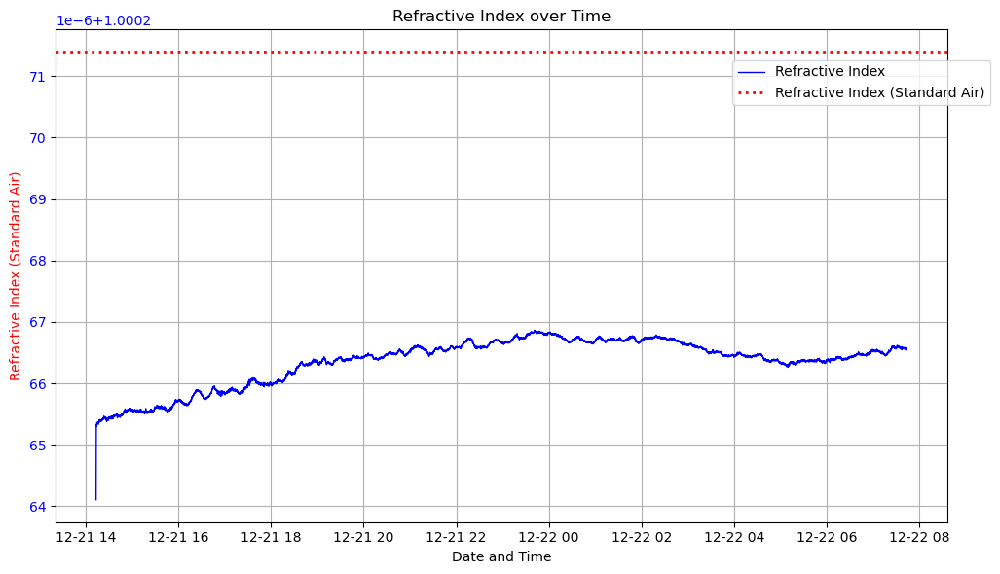

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

def calculate_refractive_index(P, T, H):
    return 1 + ((7.83e-4 * P*0.1) / (273 + T)) - (1.5e-11 * H * (T ** 2 + 160)) #hpa to kpa: 1hpa = 0.1kpa

# Load data
environment_data = pd.read_csv('Experiment_outer_21_12_23_IDS+BME680_environment_Modified.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)

# Calculate refractive index using environmental data
refractive_index = calculate_refractive_index(environment_data['Pressure(hPa)'],
                                               environment_data['Temperature(C)'],
                                               environment_data['Humidity(%rh)'])

# Refractive index of standard air
refractive_index_standard = 1.0002713938

# Plot refractive index and refractive index of standard air over time
fig, ax = plt.subplots(figsize=(10, 6))

# Plot left y-axis (refractive index)
ax.plot(environment_data['Date_Time'], refractive_index, label='Refractive Index', linestyle='-', linewidth=1, color='blue')
ax.set_xlabel('Date and Time')
ax.set_ylabel('ΔRefractive Index', color='blue')
ax.tick_params(axis='y', labelcolor='blue')
ax.grid(True)

# Plot right y-axis (refractive index of standard air)
ax.axhline(y=refractive_index_standard, color='red', linestyle='dotted', linewidth=2, label='Refractive Index (Standard Air)')
ax.set_ylabel('Refractive Index (Standard Air)', color='red')

# Title and legend
plt.title('Refractive Index over Time')
fig.tight_layout()
fig.legend(loc='upper left', bbox_to_anchor=(0.75, 0.9))

plt.show()


In [10]:
import pandas as pd

# Load environmental data
environment_data = pd.read_csv('Experiment_outer_21_12_23_IDS+BME680_environment_Modified.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)

# Extract relevant columns
temperature = environment_data['Temperature(C)']
humidity = environment_data['Humidity(%rh)']
pressure = environment_data['Pressure(hPa)']

# Find the mode for each variable
mode_temperature = temperature.mode().values[0]
mode_humidity = humidity.mode().values[0]
mode_pressure = pressure.mode().values[0]

# Display the results
print(f"Mode of Temperature: {mode_temperature} °C")
print(f"Mode of Humidity: {mode_humidity} %")
print(f"Mode of Pressure: {mode_pressure} hPa")


C:\Users\biswa\AppData\Local\Temp\ipykernel_25008\2742982506.py:4: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  environment_data = pd.read_csv('Experiment_outer_21_12_23_IDS+BME680_environment_Modified.csv', parse_dates=[['Date', 'Time']], dayfirst=True, error_bad_lines=False)


Mode of Temperature: 20.64 °C
Mode of Humidity: 50.55 %
Mode of Pressure: 1001.85 hPa


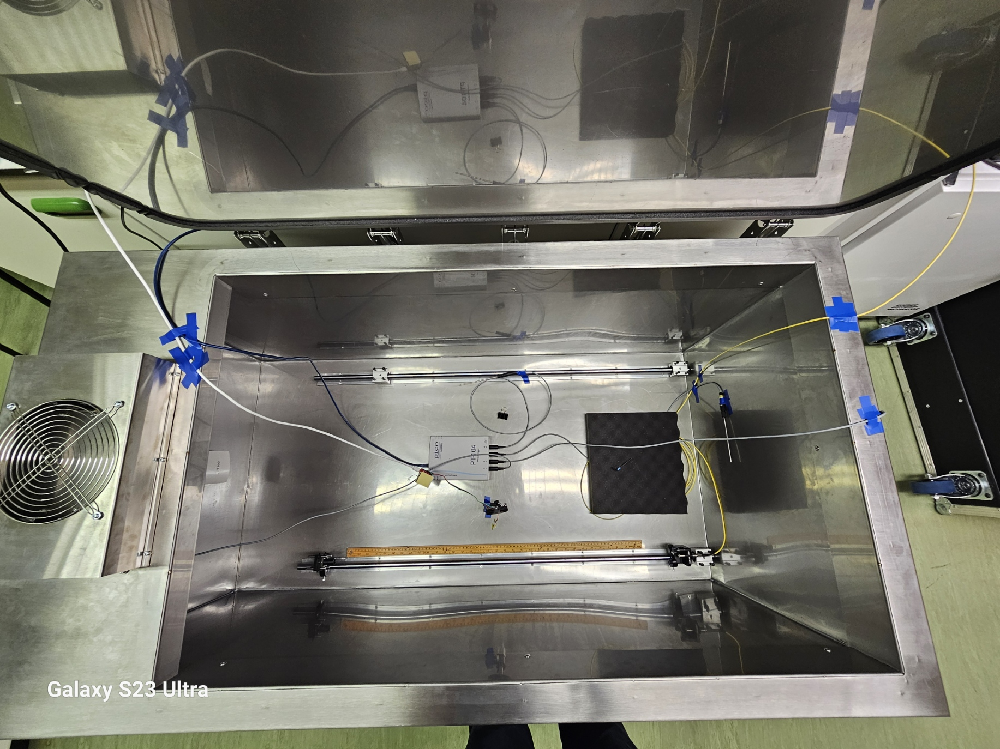

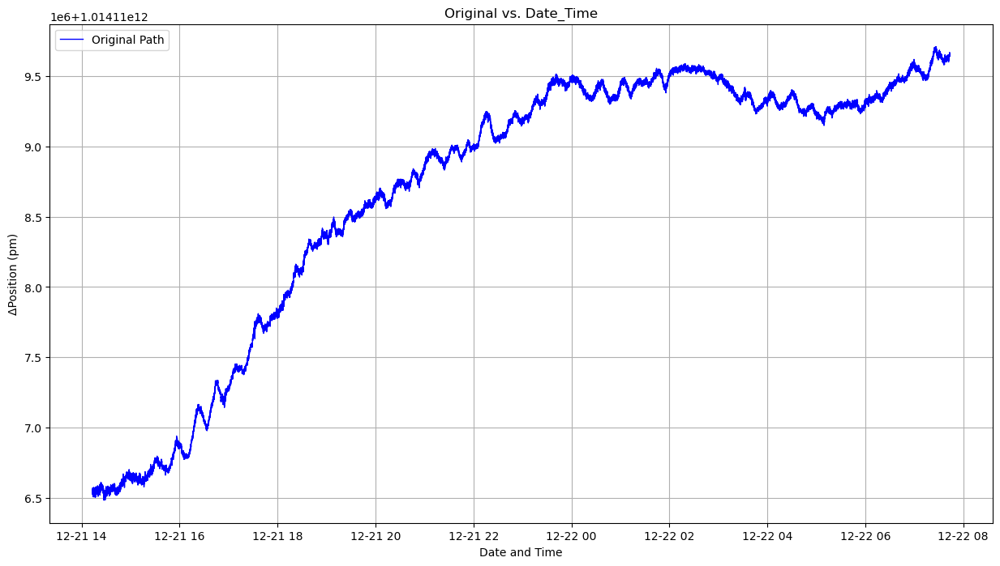

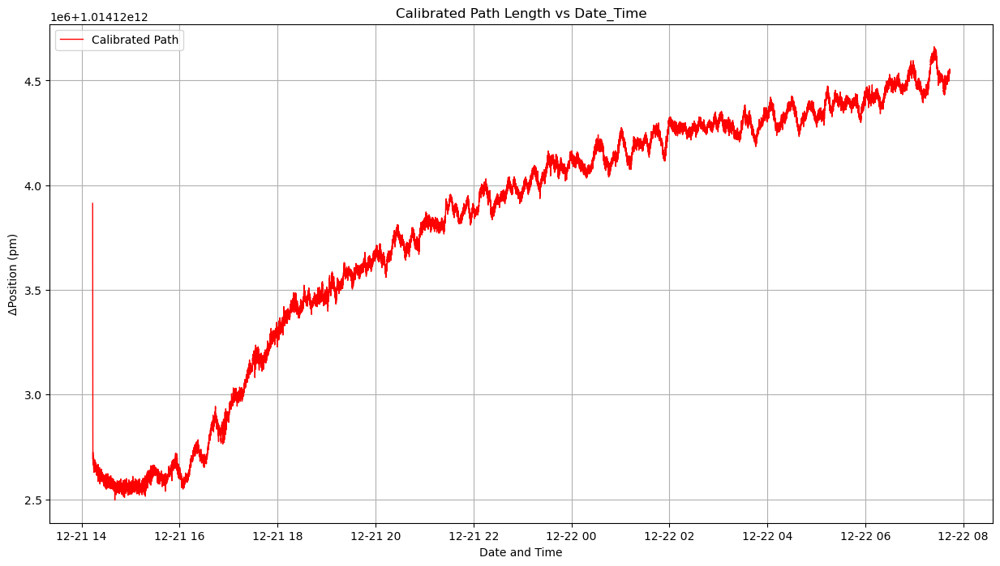

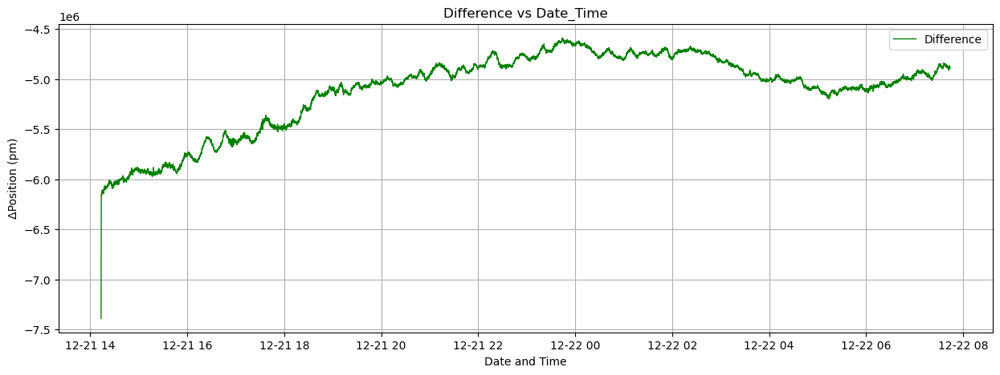

In [11]:
# Plot original and calibrated paths overlapped
plt.figure(figsize=(15, 8))
plt.plot(date_time_interpolated, position_pm_interpolated, label="Original Path", linestyle='-', linewidth=1, color='blue')
# plt.plot(date_time_interpolated, calibrated_path_interpolated, label="Calibrated Path", linestyle='-', linewidth=1, color='red')
plt.xlabel("Date and Time")
plt.ylabel("ΔPosition (pm)")
plt.title("Original vs. Date_Time")
plt.legend()
plt.grid(True)
plt.show()

# Plot original and calibrated paths overlapped
plt.figure(figsize=(15, 8))
# plt.plot(date_time_interpolated, position_pm_interpolated, label="Original Path", linestyle='-', linewidth=1, color='blue')
plt.plot(date_time_interpolated, calibrated_path_interpolated, label="Calibrated Path", linestyle='-', linewidth=1, color='red')
plt.xlabel("Date and Time")
plt.ylabel("ΔPosition (pm)")
plt.title("Calibrated Path Length vs Date_Time")
plt.legend()
plt.grid(True)
plt.show()

# Plot actual path and difference in the same plot
difference_interpolated = position_pm_interpolated - calibrated_path_interpolated
plt.figure(figsize=(15, 5))
# plt.plot(date_time_interpolated, position_pm_interpolated, label="Actual Path", linestyle='-', linewidth=1, color='blue')
plt.plot(date_time_interpolated, difference_interpolated, label="Difference", linestyle='-', linewidth=1, color='green')
plt.xlabel("Date and Time")
plt.ylabel("ΔPosition (pm)")
plt.title("Difference vs Date_Time")
plt.legend()
plt.grid(True)
plt.show()


In [12]:
print("Length of position_pm:", len(position_pm))
print("Length of calibrated_path:", len(calibrated_path))


Length of position_pm: 62463
Length of calibrated_path: 62758


## Fourier transform

In [13]:
import numpy as np
import matplotlib.pyplot as plt

def plot_fourier_transform_windowed(data, sample_rate, label="Fourier Transform"):
    # Remove DC component
    data = data - np.mean(data)

    # Apply Hanning window
    window = np.hanning(len(data))
    windowed_data = data * window

    # Perform FFT
    fft_result = np.fft.fft(windowed_data)
    frequencies = np.fft.fftfreq(len(data), d=1/sample_rate)

    # Normalize the FFT result
    fft_result /= len(data)

    # Plot the magnitude spectrum
    plt.figure(figsize=(15, 5))
    line, = plt.plot(frequencies, np.abs(fft_result), label=label, linestyle='-', linewidth=1, color='purple')
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Magnitude")
    plt.title("Fourier Transform of the Data with Windowing")
    plt.legend()
    plt.grid(True)
    plt.show()

# Perform Fourier Transform with windowing on the actual path data
plot_fourier_transform_windowed(position_pm_interpolated, sample_rate, label="Actual Path")

# Perform Fourier Transform with windowing on the difference data
plot_fourier_transform_windowed(difference_interpolated, sample_rate, label="Difference")


NameError: name 'sample_rate' is not defined

# PID Temp. Outerbox

- No IDS, Pre auto tuning setting-> loop1: 14:42:52 to 16:32:14(8th December)
- No IDS, No auto-tuning, plain temperature of the box. loop2: 8th December 16:41:44 to 11th December 12:58:00
- "REST"
- No IDS, Auto tuning with new values1-> loop3: 12th December 14:48:48 to 13th December 10:54:33
- No IDS, Box Opened for measurement of railing, Auto tuning with new value2-> 13th December 12:25:44 to 15th December 15:00:00
- No IDS available, experiment going on (S.Ghosh)
- Using IDS+slow model PID values-> loop 5: 18th December 16:44:40 to 22 December 6:00:00


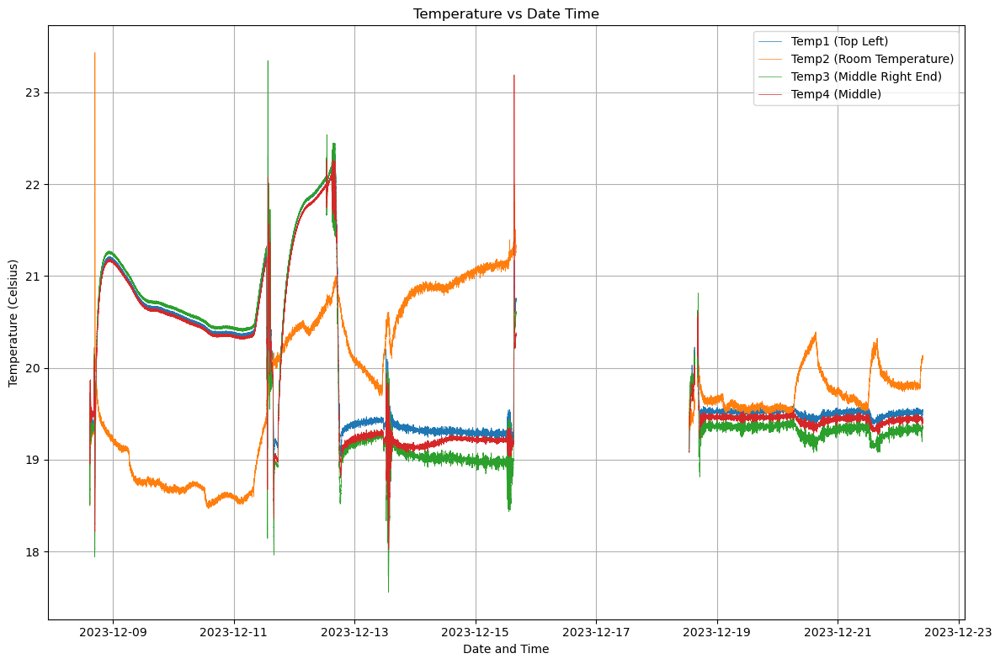

Temperature Sensitivity for Temp1 (Top Left):
0    NaN
1    9.0
2    0.0
3   -8.0
4    0.0
dtype: float64

Temperature Sensitivity for Temp2 (Room Temperature):
0     NaN
1   -10.0
2     0.0
3     0.0
4   -12.0
dtype: float64

Temperature Sensitivity for Temp3 (Middle Right End):
0    NaN
1    0.0
2   -2.0
3    0.0
4    0.0
dtype: float64

Temperature Sensitivity for Temp4 (Middle):
0    NaN
1    0.0
2    0.0
3   -6.0
4    0.0
dtype: float64


In [22]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data from the CSV file
file_path = 'Temperature_PID_loop_outerbox_analysis.csv'
data = pd.read_csv(file_path, parse_dates=[['Date', 'Time']], dayfirst=True)

# Extract Date_Time and temperature columns
date_time = data['Date_Time']
temp1 = data['Top Left(C)']
temp2 = data['Room_Temperature(C)']
temp3 = data['Middle Right end(C)']
temp4 = data['Middle(C)']

# Plot temperature vs date time
plt.figure(figsize=(12, 8))
plt.plot(date_time, temp1, label='Temp1 (Top Left)', linestyle='-', linewidth=0.5)
plt.plot(date_time, temp2, label='Temp2 (Room Temperature)', linestyle='-', linewidth=0.5)
plt.plot(date_time, temp3, label='Temp3 (Middle Right End)', linestyle='-', linewidth=0.5)
plt.plot(date_time, temp4, label='Temp4 (Middle)', linestyle='-', linewidth=0.5)

# Set labels and title
plt.xlabel('Date and Time')
plt.ylabel('Temperature (Celsius)')
plt.title('Temperature vs Date Time')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Calculate temperature sensitivity
temp1_sensitivity = temp1.diff() / (date_time.diff().dt.total_seconds()) * 1000  # in mK/s
temp2_sensitivity = temp2.diff() / (date_time.diff().dt.total_seconds()) * 1000  # in mK/s
temp3_sensitivity = temp3.diff() / (date_time.diff().dt.total_seconds()) * 1000  # in mK/s
temp4_sensitivity = temp4.diff() / (date_time.diff().dt.total_seconds()) * 1000  # in mK/s

# Display temperature sensitivity values
print("Temperature Sensitivity for Temp1 (Top Left):")
print(temp1_sensitivity.head())

print("\nTemperature Sensitivity for Temp2 (Room Temperature):")
print(temp2_sensitivity.head())

print("\nTemperature Sensitivity for Temp3 (Middle Right End):")
print(temp3_sensitivity.head())

print("\nTemperature Sensitivity for Temp4 (Middle):")
print(temp4_sensitivity.head())


<IPython.core.display.Javascript object>


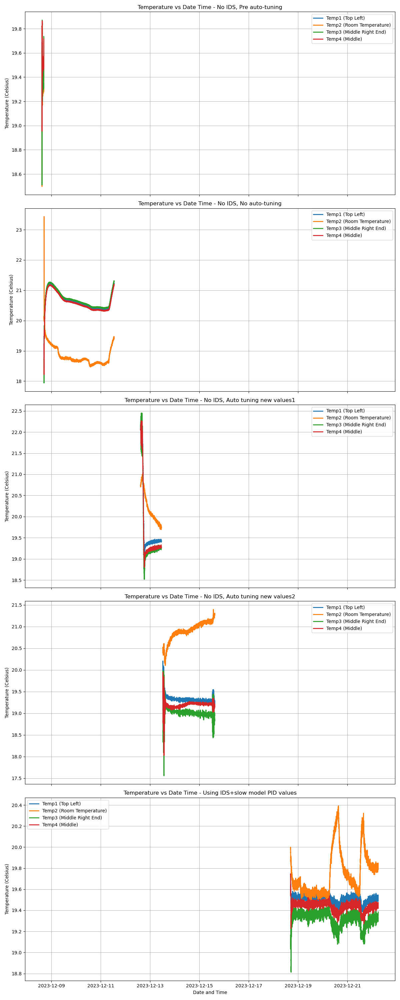

In [162]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data from the CSV file
file_path = 'Temperature_PID_loop_outerbox_analysis.csv'
data = pd.read_csv(file_path, parse_dates=[['Date', 'Time']], dayfirst=True)

# Extract Date_Time and temperature columns
date_time = data['Date_Time']
temp1 = data['Top Left(C)']
temp2 = data['Room_Temperature(C)']
temp3 = data['Middle Right end(C)']
temp4 = data['Middle(C)']

# Define time ranges for different conditions
time_ranges = [
    ("No IDS, Pre auto-tuning", "2023-12-08 14:42:52", "2023-12-08 16:32:14"),
    ("No IDS, No auto-tuning", "2023-12-08 16:41:44", "2023-12-11 12:58:00"),
    ("No IDS, Auto tuning new values1", "2023-12-12 14:48:48", "2023-12-13 10:54:33"),
    ("No IDS, Auto tuning new values2", "2023-12-13 12:25:44", "2023-12-15 15:00:00"),
    ("Using IDS+slow model PID values", "2023-12-18 16:44:40", "2023-12-22 06:00:00"),
]

# Create subplots
fig, axes = plt.subplots(len(time_ranges), 1, figsize=(12, 6 * len(time_ranges)), sharex=True)

for idx, (condition, start_time, end_time) in enumerate(time_ranges):
    condition_data = data[(date_time >= start_time) & (date_time <= end_time)]

    # Plot temperature vs date time
    axes[idx].plot(condition_data['Date_Time'], condition_data['Top Left(C)'], label='Temp1 (Top Left)', linestyle='-', linewidth=2)
    axes[idx].plot(condition_data['Date_Time'], condition_data['Room_Temperature(C)'], label='Temp2 (Room Temperature)', linestyle='-', linewidth=2)
    axes[idx].plot(condition_data['Date_Time'], condition_data['Middle Right end(C)'], label='Temp3 (Middle Right End)', linestyle='-', linewidth=2)
    axes[idx].plot(condition_data['Date_Time'], condition_data['Middle(C)'], label='Temp4 (Middle)', linestyle='-', linewidth=2)

    # Set labels and title
    axes[idx].set_ylabel('Temperature (Celsius)')
    axes[idx].set_title(f'Temperature vs Date Time - {condition}')
    axes[idx].legend()
    axes[idx].grid(True)

plt.xlabel('Date and Time')
plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>


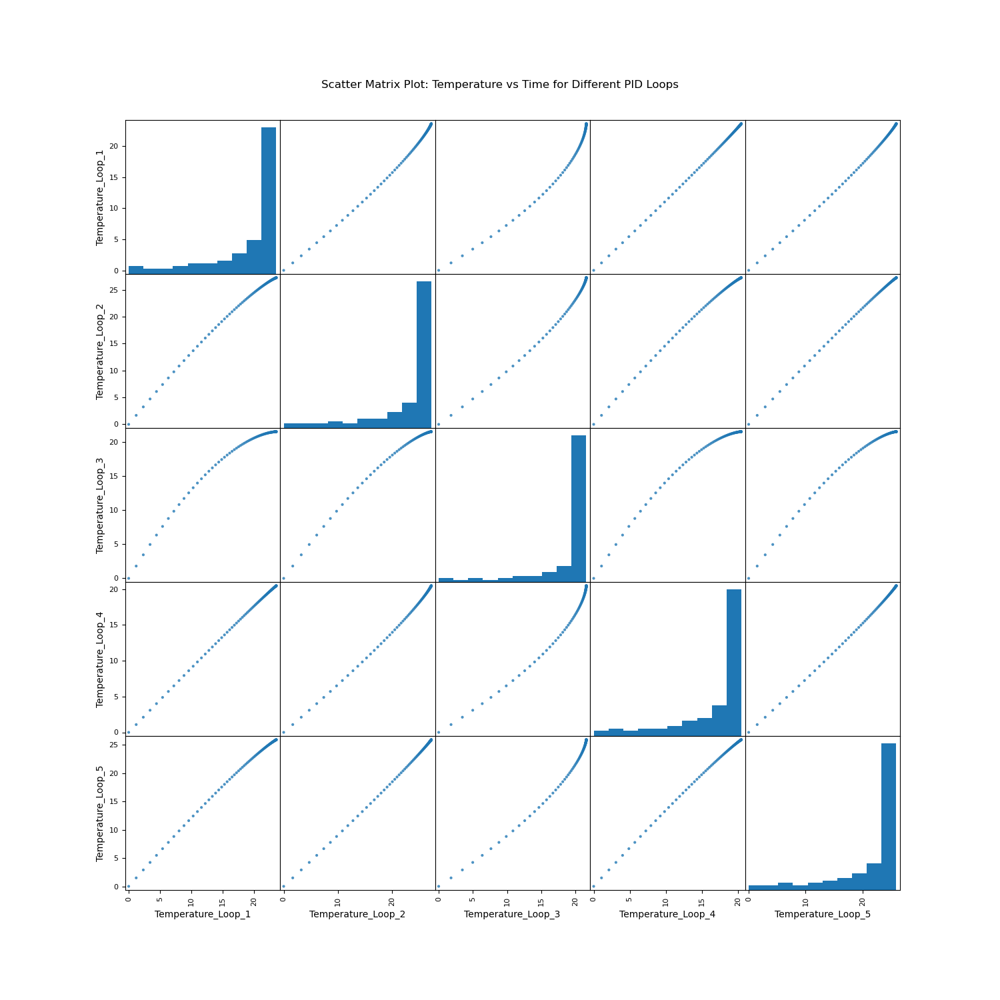

<IPython.core.display.Javascript object>


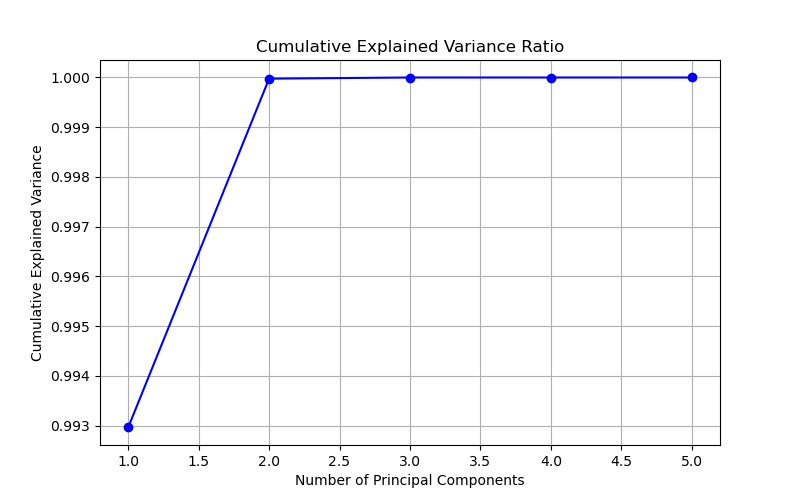

Time constant for Loop 1: 1.248067253651095
Time constant for Loop 2: 0.3058526920552329
Time constant for Loop 3: 2.3291124464543738
Time constant for Loop 4: 1.6709011275901637
Time constant for Loop 5: 0.7574564035311239


In [221]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Function to generate synthetic data for a single PID loop
def generate_synthetic_data(time_points):
    A = np.random.uniform(20, 30)
    tau = np.random.uniform(10, 20)
    temp_data = response_model(time_points, A, tau)
    return temp_data

# Response model for synthetic data
def response_model(time, A, tau):
    return A * (1 - np.exp(-time / tau))

# Generate synthetic data for multiple PID loops
np.random.seed(42)
num_loops = 5
time_points = np.linspace(0, 100, 100)  # Adjust the time range as needed

data = {'Time': time_points}
for i in range(num_loops):
    temp_data = generate_synthetic_data(time_points)
    data[f'Temperature_Loop_{i + 1}'] = temp_data

df = pd.DataFrame(data)

# Scatter matrix plot
scatter_matrix = pd.plotting.scatter_matrix(df.iloc[:, 1:], alpha=0.8, figsize=(15, 15), diagonal='hist')
plt.suptitle('Scatter Matrix Plot: Temperature vs Time for Different PID Loops', y=0.92)
plt.show()

# Standardize data and perform PCA
features = df.iloc[:, 1:]
features_standardized = StandardScaler().fit_transform(features)
pca = PCA()
principal_components = pca.fit_transform(features_standardized)

# Plot explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

plt.figure(figsize=(8, 5))
plt.plot(range(1, len(explained_variance_ratio) + 1), cumulative_explained_variance, marker='o', linestyle='-', color='b')
plt.title('Cumulative Explained Variance Ratio')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

# Find time constant for each loop
for i in range(num_loops):
    eigenvalues = pca.components_[i]
    time_constant = -1 / np.log(np.abs(eigenvalues))
    print(f'Time constant for Loop {i + 1}: {time_constant[1]}')
